- regular bayes between 20-1000
- kappa now float
- trade only on state shifts

In [2]:
# General
import numpy as np
import pandas as pd
import os, sys
import optuna

# For data prep and pre-processing
from jumpmodels.utils import filter_date_range 
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from sklearn.preprocessing import StandardScaler

# For model fit and prediction
from joblib import Parallel, delayed # allows parallel grid search on all 4 cores
from jumpmodels.sparse_jump import SparseJumpModel

# For plotting
from jumpmodels.plot import plot_regimes_and_cumret, plot_cumret
import matplotlib.pyplot as plt
import matplotlib as mpl    
mpl.rcParams["text.usetex"] = False


# Portfolio allocation
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.efficient_frontier import EfficientFrontier

#sys.path.append('/Users/victor/Documents/thesis_vri_vp/vic_new')         # for mac
sys.path.append('C:\\Users\\victo\\git_new\\thesis_vri_vp\\vic_new')      # for windows
from feature_set_v2 import MergedDataLoader 




In [3]:
# ---------------------------------------------------------------------
# 1) Purged/embargoed window function
# ---------------------------------------------------------------------
def get_train_val_windows(
        current_date, 
        full_data, 
        min_train_years=8,
        max_train_years=12, 
        val_years=3,
        initial_train_start=None,
        gap_days=3                                      # gap_days: number of days to exclude at the train/validation boundary (purge/embargo) to avoid look‑ahead; set to 0 to disable
    ):
    # 1) Validation window
    val_end   = current_date
    val_start = val_end - pd.DateOffset(years=val_years)
    
    # 2) Train ends just before validation
    train_end = val_start - pd.DateOffset(days=1)
    
    # 3) Max‐length training start
    train_start_candidate = train_end - pd.DateOffset(years=max_train_years)
    if initial_train_start is not None:
        earliest = pd.to_datetime(initial_train_start)
        train_start_candidate = max(train_start_candidate, earliest)
    
    # 4) Enforce min‐length
    if (train_end - train_start_candidate) < pd.Timedelta(days=365.25 * min_train_years):
        train_start_candidate = train_end - pd.DateOffset(years=min_train_years)
        if initial_train_start is not None:
            train_start_candidate = max(train_start_candidate, earliest)
    
    idx       = full_data.index
    train_idx = idx[(idx >= train_start_candidate) & (idx <= train_end)]
    val_idx   = idx[(idx >= val_start)           & (idx <= val_end)]
    
    # 5) Purge/embargo
    if gap_days > 0:
        if len(train_idx) > gap_days:
            train_idx = train_idx[:-gap_days]
        if len(val_idx)   > gap_days:
            val_idx   = val_idx[gap_days:]
    
    if train_idx.empty or val_idx.empty:
        raise ValueError(
            f"No data for train [{train_start_candidate.date()}-{train_end.date()}] "
            f"or val [{val_start.date()}-{val_end.date()}] after {gap_days}-day gap"
        )
    
    return train_idx[0], train_idx[-1], val_idx[0], val_idx[-1]


# ---------------------------------------------------------------------
# 2) Optuna objective & wrapper
# ---------------------------------------------------------------------
# 1) New evaluator that fits one model & returns Sharpe:
# ------------------------------------------------------------------
# Trade-only-at-state-shift evaluator
def evaluate_sjm_sharpe(
    lam, kappa,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")

    # 1) Online state predictions
    val_states = model.predict_online(X_vl_s)

    # 2) Flag re-hedge days  – True where *state* flips vs. yesterday
    shift = val_states.ne(val_states.shift()).fillna(True)

    # 3) P&L with trades **only** on those days
    pnl = np.zeros(len(val_states))
    prev_pos = 0.0
    for t, st in enumerate(val_states):
        if shift.iloc[t]:                         # rebalance
            exp_ann = model.ret_[st] * 252
            if   exp_ann >  annual_threshold: pos =  1.0
            elif exp_ann < -annual_threshold: pos = -1.0
            else:                                 pos = exp_ann / annual_threshold
        else:                                     # carry position
            pos = prev_pos

        pnl[t] = prev_pos * ar_vl.iloc[t] - abs(pos - prev_pos) * cost_per_100pct
        prev_pos = pos

    sharpe = pnl.mean() / pnl.std(ddof=1) * np.sqrt(252)
    return sharpe


# 2) Rewrite your Optuna objective to use it:
def optuna_objective(
    trial,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    lam   = trial.suggest_float("lambda", 10**2 / 5, 10**3)
    kappa = trial.suggest_float("kappa", 1, np.sqrt(17))
    return evaluate_sjm_sharpe(
        lam, kappa,
        X_tr_s, X_vl_s,
        ar_tr, ar_vl,
        cost_per_100pct, annual_threshold
    )

# 3) In your Bayesian wrapper, return the study:
def bayesian_hyperparam_search(
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct=0.0007,
    annual_threshold=0.05,
    n_trials=30
):
    study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=42), direction="maximize")
    study.optimize(
        lambda t: optuna_objective(
            t, X_tr_s, X_vl_s, ar_tr, ar_vl,
            cost_per_100pct, annual_threshold
        ),
        n_trials=n_trials
    )
    return study


# ---------------------------------------------------------------------
# 3) Rolling CV + final‑model fit using Optuna
# ---------------------------------------------------------------------
def rolling_time_series_cv_sjm_long_short_optimized(
    X_train, X_val,
    factor_returns_train, factor_returns_val,
    market_returns_train, market_returns_val,
    cost_per_100pct=0.0007,
    annual_threshold=0.05,
    n_trials=30
):
    # --- align indices & build active returns ---
    tr_idx = X_train.index.intersection(factor_returns_train.index).intersection(market_returns_train.index)
    vl_idx = X_val.index.intersection(factor_returns_val.index).intersection(market_returns_val.index)
    
    X_tr = X_train.loc[tr_idx]
    X_vl = X_val.loc[vl_idx]
    ar_tr = factor_returns_train.loc[tr_idx] - market_returns_train.loc[tr_idx]
    ar_vl = factor_returns_val.loc[vl_idx]     - market_returns_val.loc[vl_idx]
    
    # --- preprocess ---
    clipper = DataClipperStd(mul=3.0)
    scaler  = StandardScaler()
    
    X_tr_s = pd.DataFrame(
        scaler.fit_transform(clipper.fit_transform(X_tr)),
        index=X_tr.index, columns=X_tr.columns
    )
    X_vl_s = pd.DataFrame(
        scaler.transform(clipper.transform(X_vl)),
        index=X_vl.index, columns=X_vl.columns
    )
    
    # --- Bayesian search ---
    study = bayesian_hyperparam_search(
        X_tr_s, X_vl_s, ar_tr, ar_vl,
        cost_per_100pct, annual_threshold,
        n_trials
    )
    lam, kappa = study.best_params["lambda"], study.best_params["kappa"]
    best_sharpe = study.best_value
    print(f"Optuna best λ={lam:.4f}, κ={kappa}, Sharpe={best_sharpe:.4f}")
    
    # --- fit final SJM on the full train window ---
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    
    return {
        "best_lambda": lam,
        "best_kappa":  kappa,
        "best_sharpe": best_sharpe,
        "best_model":  model,
        "results_array": None,
        "study": study
    }

In [4]:
# ---------------------------------------------------------------------
# 4) Updated cross‑validation module (run_cv)
# ---------------------------------------------------------------------
def run_cv(
    factors,
    factor_data_dict,
    cv_dates,
    *,
    min_train_years=8,
    max_train_years=12,
    val_years=3,
    initial_train_start=None,
    save_path="0505_7bps_20-1000_tradeshift.parquet",
    make_plots=True,
    cost_per_100pct=0.0007,
    annual_threshold=0.05,
    n_trials=30
):
    records = []
    evolution_plotbuf = []

    for cv_end in cv_dates:
        for fac in factors:
            X       = factor_data_dict[fac]["X"]
            fac_ret = factor_data_dict[fac]["fac_ret"]
            mkt_ret = factor_data_dict[fac]["mkt_ret"]

            # get purged train/val windows
            train_start, train_end, val_start, val_end = get_train_val_windows(
                cv_end, X,
                min_train_years=min_train_years,
                max_train_years=max_train_years,
                val_years=val_years,
                initial_train_start=initial_train_start,
                gap_days=3
            )

            # slice data
            X_train  = filter_date_range(X, train_start, train_end)
            X_val    = filter_date_range(X, val_start,   val_end)
            fr_train = filter_date_range(fac_ret, train_start, train_end)
            fr_val   = filter_date_range(fac_ret, val_start,   val_end)
            mr_train = filter_date_range(mkt_ret, train_start, train_end)
            mr_val   = filter_date_range(mkt_ret, val_start,   val_end)

            # run Optuna‐powered CV
            res = rolling_time_series_cv_sjm_long_short_optimized(
                X_train=X_train,
                X_val=X_val,
                factor_returns_train=fr_train,
                factor_returns_val=fr_val,
                market_returns_train=mr_train,
                market_returns_val=mr_val,
                cost_per_100pct=cost_per_100pct,
                annual_threshold=annual_threshold,
                n_trials=n_trials
            )

            # store results
            records.append({
                "date": cv_end,
                "factor": fac,
                "best_lambda": res["best_lambda"],
                "best_kappa":  res["best_kappa"]
            })
            evolution_plotbuf.append({
                "date": cv_end,
                "factor": fac,
                "lambda": res["best_lambda"],
                "kappa":  res["best_kappa"]
            })

            # per‐fold Optuna scatter plot
            if make_plots:
                trials = res["study"].trials
                df_t = pd.DataFrame([
                    {"lambda": t.params["lambda"],
                     "kappa":  t.params["kappa"],
                     "value":  t.value}
                    for t in trials
                ])
                plt.figure(figsize=(8,5))
                sc = plt.scatter(
                    df_t["lambda"],
                    df_t["value"],
                    c=df_t["kappa"].astype(float),
                    cmap="viridis",
                    alpha=0.8
                )
                plt.xscale("log")
                plt.axvline(res["best_lambda"], ls="--", c="r", alpha=0.6)
                plt.colorbar(sc, label='$\\kappa$')
                plt.xlabel("'$\\lambda$' (log scale)")
                plt.ylabel("Validation Sharpe")
                plt.title(f"{fac} | CV cutoff {cv_end.date()} - Optuna trials")
                plt.grid(True, ls=":")
                plt.tight_layout()
                plt.show()

    # assemble and save
    cv_df = pd.DataFrame(records).sort_values(["factor", "date"])
    if save_path:
        cv_df.to_parquet(save_path)

    # overall λ/κ evolution
    if make_plots:
        evo = pd.DataFrame(evolution_plotbuf)
        for fac in factors:
            sub = evo[evo["factor"] == fac].sort_values("date")
            fig, ax1 = plt.subplots(figsize=(9,5))
            ax1.plot(sub["date"], sub["lambda"], marker="o", label='$\\lambda$')
            ax1.set_ylabel('$\\lambda$', color="tab:blue")
            ax1.tick_params(axis='y', labelcolor='tab:blue')
            ax2 = ax1.twinx()
            ax2.plot(sub["date"], sub["kappa"], marker="x", ls="--", color="tab:red", label='$\\kappa$')
            ax2.set_ylabel('$\\kappa$', color="tab:red")
            ax2.tick_params(axis='y', labelcolor='tab:red')
            ax1.set_xlabel("CV end-date")
            ax1.set_title(f"{fac} — hyperparameter evolution")
            ax1.grid(True, ls=":")
            ax1.legend(loc="upper left")
            ax2.legend(loc="upper right")
            plt.tight_layout()
            plt.show()

    return cv_df


[I 2025-05-05 23:28:46,963] A new study created in memory with name: no-name-59bbf91b-dfcf-48f1-b158-9c2bbd03272a
[I 2025-05-05 23:28:51,708] Trial 0 finished with value: 0.05732480826289452 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.05732480826289452.
[I 2025-05-05 23:28:54,521] Trial 1 finished with value: 0.05732480826289467 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.05732480826289467.
[I 2025-05-05 23:28:59,503] Trial 2 finished with value: -0.12059401115555848 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.05732480826289467.
[I 2025-05-05 23:29:05,271] Trial 3 finished with value: -0.15891610852327565 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.05732480826289467.
[I 2025-05-05 23:29:09,003] Trial 4 finished with value: 0.05732480826289452 a

Optuna best λ=318.1574, κ=2.6388697637096916, Sharpe=0.2894


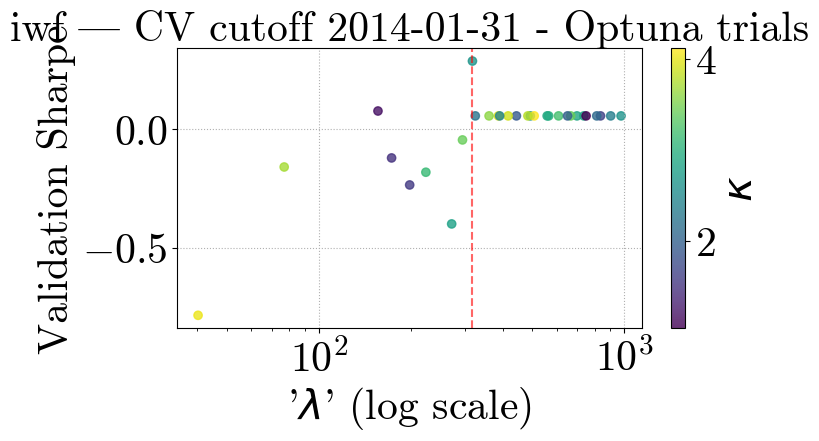

[I 2025-05-05 23:30:45,203] A new study created in memory with name: no-name-aea1f47b-fad4-4cdd-ab34-e2d0a9f3c1a2
[I 2025-05-05 23:30:47,651] Trial 0 finished with value: 0.7813438693941598 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7813438693941598.
[I 2025-05-05 23:30:50,361] Trial 1 finished with value: 0.7813438693941598 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7813438693941598.
[I 2025-05-05 23:30:54,150] Trial 2 finished with value: 0.5385761555569344 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.7813438693941598.
[I 2025-05-05 23:30:58,953] Trial 3 finished with value: 0.864091978128479 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.864091978128479.
[I 2025-05-05 23:31:01,689] Trial 4 finished with value: 0.7813438693941598 and parameters

Optuna best λ=249.8590, κ=2.886433507451418, Sharpe=1.2245


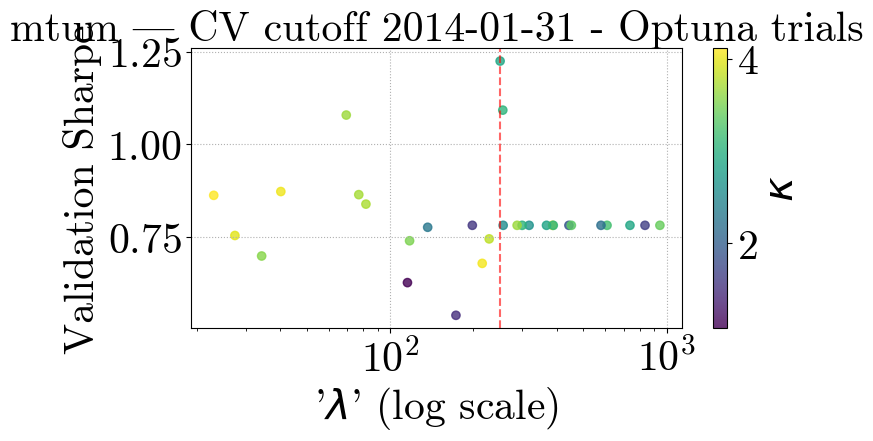

[I 2025-05-05 23:32:28,536] A new study created in memory with name: no-name-e0766480-0551-46c9-a2c1-ab0517fe0d95
[I 2025-05-05 23:32:31,038] Trial 0 finished with value: -0.36981151641021476 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.36981151641021476.
[I 2025-05-05 23:32:33,169] Trial 1 finished with value: -0.7074135081834748 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.36981151641021476.
[I 2025-05-05 23:32:35,967] Trial 2 finished with value: -0.45833457365041147 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.36981151641021476.
[I 2025-05-05 23:32:41,185] Trial 3 finished with value: -1.0031710796849467 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.36981151641021476.
[I 2025-05-05 23:32:43,454] Trial 4 finished with value: -0.70741350818347

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.6913


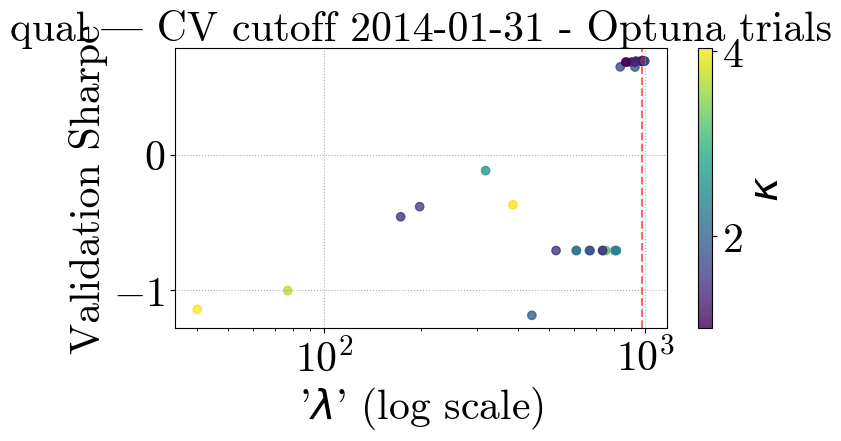

[I 2025-05-05 23:33:43,370] A new study created in memory with name: no-name-70561772-2a07-4408-b009-7072686c3acc
[I 2025-05-05 23:33:46,569] Trial 0 finished with value: -0.21029275554263738 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.21029275554263738.
[I 2025-05-05 23:33:49,385] Trial 1 finished with value: -0.5055828278341848 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.21029275554263738.
[I 2025-05-05 23:33:56,731] Trial 2 finished with value: -0.12913344687536998 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.12913344687536998.
[I 2025-05-05 23:34:02,837] Trial 3 finished with value: -0.022562015504019817 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.022562015504019817.
[I 2025-05-05 23:34:06,001] Trial 4 finished with value: 0.067175545483

Optuna best λ=416.9228, κ=3.8260542456916884, Sharpe=0.1861


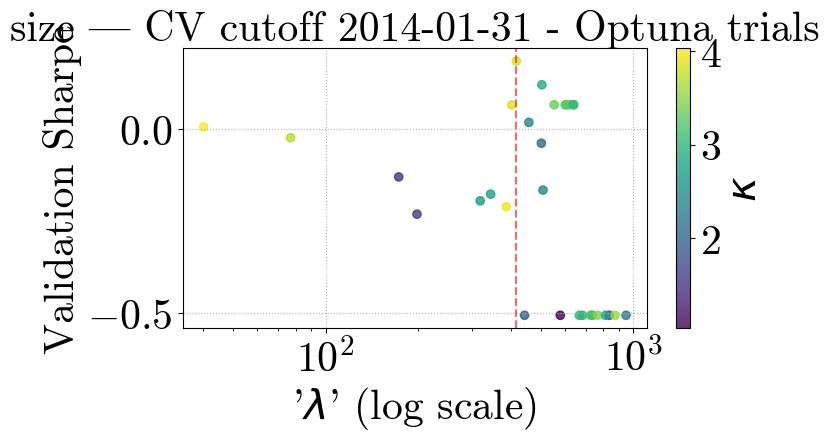

[I 2025-05-05 23:35:22,834] A new study created in memory with name: no-name-497bf8ed-d87f-4f44-b30f-94abf9cd2fd4
[I 2025-05-05 23:35:26,556] Trial 0 finished with value: -0.8525311417504574 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.8525311417504574.
[I 2025-05-05 23:35:30,568] Trial 1 finished with value: -0.3401217324741716 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.3401217324741716.
[I 2025-05-05 23:35:38,155] Trial 2 finished with value: -0.26089059254041796 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.26089059254041796.
[I 2025-05-05 23:35:46,395] Trial 3 finished with value: -0.504917722336242 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.26089059254041796.
[I 2025-05-05 23:35:51,197] Trial 4 finished with value: -0.3401217324741716 a

Optuna best λ=32.8775, κ=3.3946615920264867, Sharpe=0.0140


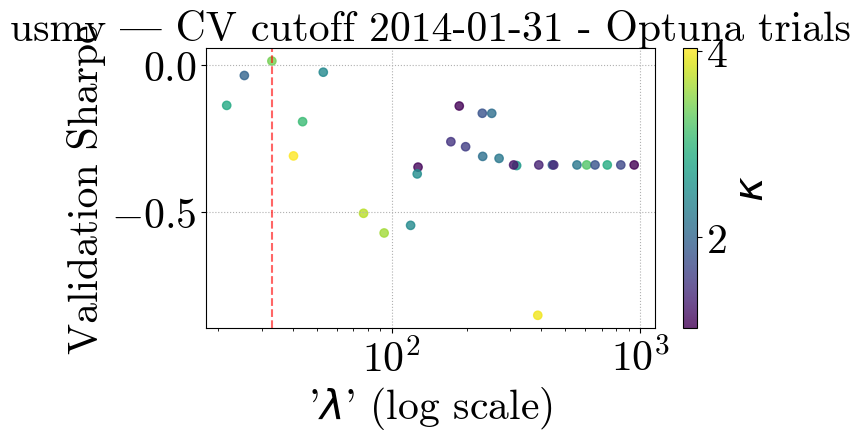

[I 2025-05-05 23:37:57,133] A new study created in memory with name: no-name-89f499cb-e397-41fe-bc2a-bb3796716382
[I 2025-05-05 23:38:00,733] Trial 0 finished with value: 0.008787699468959211 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.008787699468959211.
[I 2025-05-05 23:38:02,916] Trial 1 finished with value: 0.2860252207857802 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.2860252207857802.
[I 2025-05-05 23:38:06,785] Trial 2 finished with value: 0.22157891173018054 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.2860252207857802.
[I 2025-05-05 23:38:12,399] Trial 3 finished with value: 0.41972323199200995 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.41972323199200995.
[I 2025-05-05 23:38:14,430] Trial 4 finished with value: 0.45761410830469446 and 

Optuna best λ=121.9120, κ=2.8057325198498226, Sharpe=0.9854


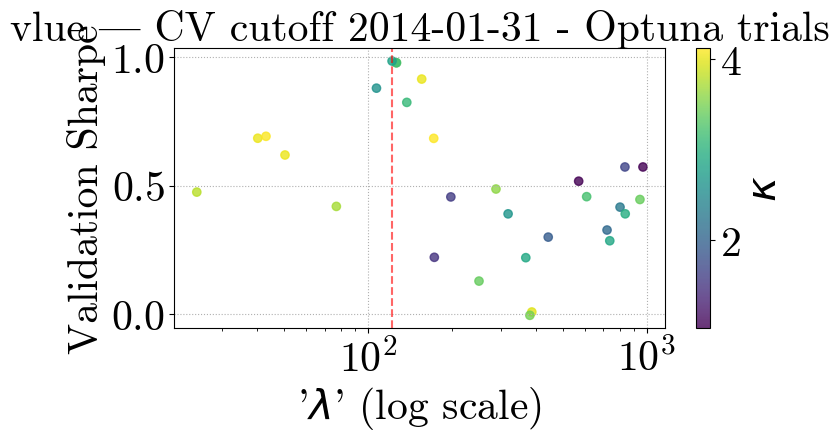

[I 2025-05-05 23:39:55,895] A new study created in memory with name: no-name-55171c82-365e-41ee-979c-ee608676cd5e
[I 2025-05-05 23:40:00,699] Trial 0 finished with value: -0.10305908227773891 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.10305908227773891.
[I 2025-05-05 23:40:05,500] Trial 1 finished with value: -0.10305908227773891 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.10305908227773891.
[I 2025-05-05 23:40:11,633] Trial 2 finished with value: 0.1319748526358138 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.1319748526358138.
[I 2025-05-05 23:40:18,764] Trial 3 finished with value: -0.38416114048819777 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.1319748526358138.
[I 2025-05-05 23:40:23,165] Trial 4 finished with value: -0.10305908227773891 

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=0.1320


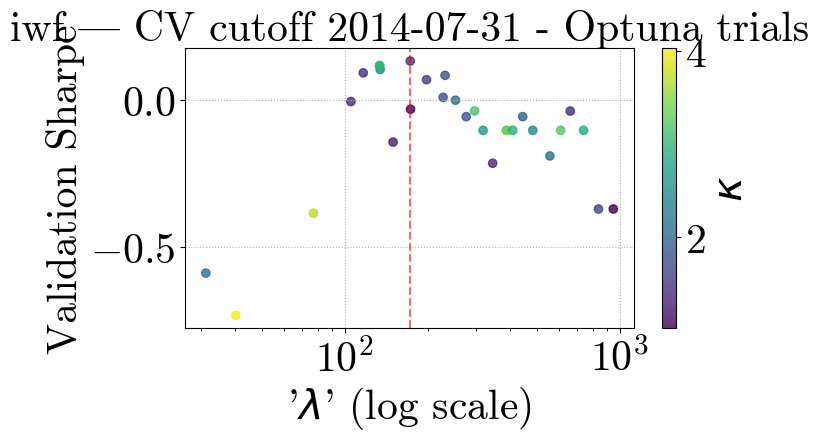

[I 2025-05-05 23:42:29,731] A new study created in memory with name: no-name-6c289d3f-730e-4319-8089-8fbb8dcf8acf
[I 2025-05-05 23:42:33,016] Trial 0 finished with value: 0.4574373372492537 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4574373372492537.
[I 2025-05-05 23:42:36,244] Trial 1 finished with value: 0.4574373372492537 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4574373372492537.
[I 2025-05-05 23:42:41,199] Trial 2 finished with value: 0.48093055638206733 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.48093055638206733.
[I 2025-05-05 23:42:48,529] Trial 3 finished with value: 0.4332410705907811 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.48093055638206733.
[I 2025-05-05 23:42:52,347] Trial 4 finished with value: 0.4574373372492537 and param

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.5269


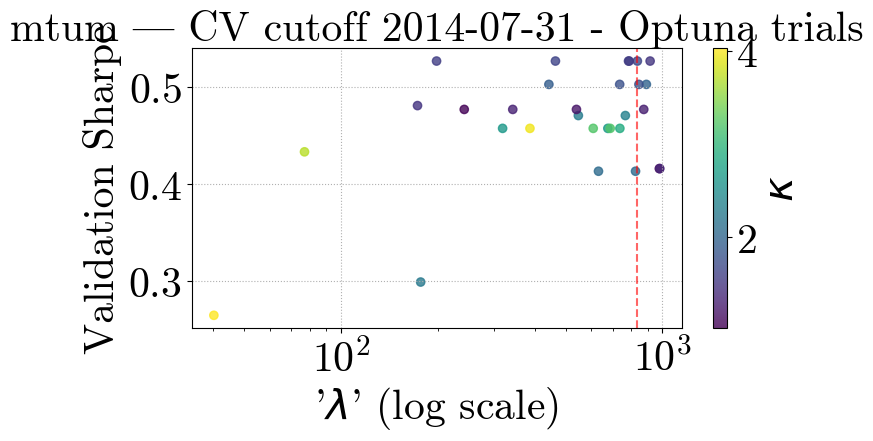

[I 2025-05-05 23:44:22,113] A new study created in memory with name: no-name-784d96d1-1ba6-4f5d-9fd6-212e332b4fc4
[I 2025-05-05 23:44:25,163] Trial 0 finished with value: 0.13805144106803666 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.13805144106803666.
[I 2025-05-05 23:44:27,444] Trial 1 finished with value: 0.09308100459810444 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.13805144106803666.
[I 2025-05-05 23:44:32,680] Trial 2 finished with value: 0.2533149224406636 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.2533149224406636.
[I 2025-05-05 23:44:38,481] Trial 3 finished with value: -0.21185565095002495 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.2533149224406636.
[I 2025-05-05 23:44:41,046] Trial 4 finished with value: 0.09308100459810444 and p

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=0.2533


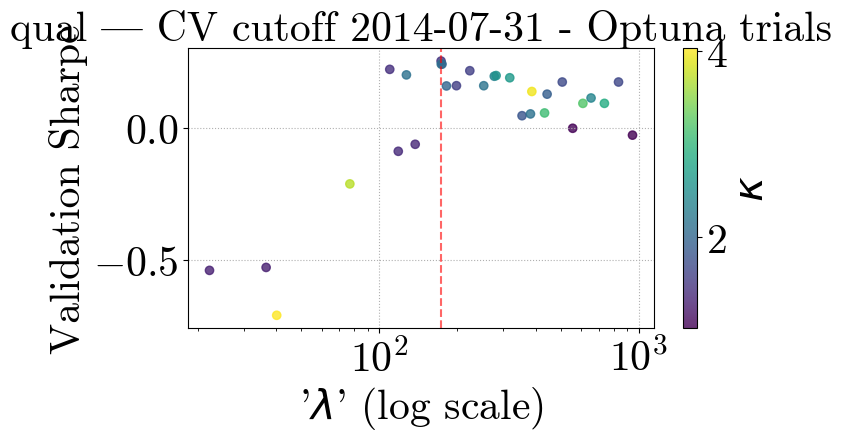

[I 2025-05-05 23:46:23,776] A new study created in memory with name: no-name-a403e859-6cbb-489a-a51f-22e76e5c6aff
[I 2025-05-05 23:46:27,430] Trial 0 finished with value: 0.0013454558701440295 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.0013454558701440295.
[I 2025-05-05 23:46:30,911] Trial 1 finished with value: 0.026888247492647913 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.026888247492647913.
[I 2025-05-05 23:46:38,393] Trial 2 finished with value: 0.05267424324874401 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.05267424324874401.
[I 2025-05-05 23:46:49,064] Trial 3 finished with value: 0.0675055159666657 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.0675055159666657.
[I 2025-05-05 23:46:52,680] Trial 4 finished with value: 0.27825533195232544

Optuna best λ=491.6627, κ=2.291554963104842, Sharpe=0.3185


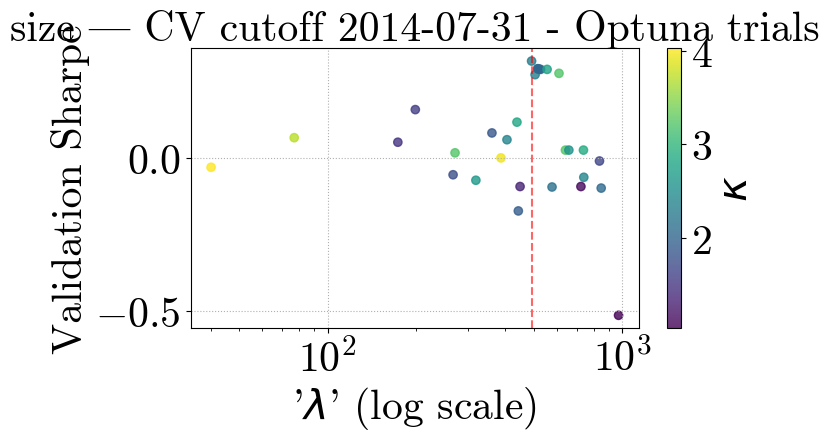

[I 2025-05-05 23:48:24,595] A new study created in memory with name: no-name-3989667e-5e6d-48ac-85fc-3e83e16cbcdf
[I 2025-05-05 23:48:29,684] Trial 0 finished with value: 0.4659303976081688 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4659303976081688.
[I 2025-05-05 23:48:32,044] Trial 1 finished with value: 0.3007734631848889 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4659303976081688.
[I 2025-05-05 23:48:38,460] Trial 2 finished with value: 0.49318334358915306 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.49318334358915306.
[I 2025-05-05 23:48:44,462] Trial 3 finished with value: -0.1057674617810292 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.49318334358915306.
[I 2025-05-05 23:48:46,894] Trial 4 finished with value: 0.3007734631848889 and para

Optuna best λ=278.9822, κ=3.62895382596083, Sharpe=0.6357


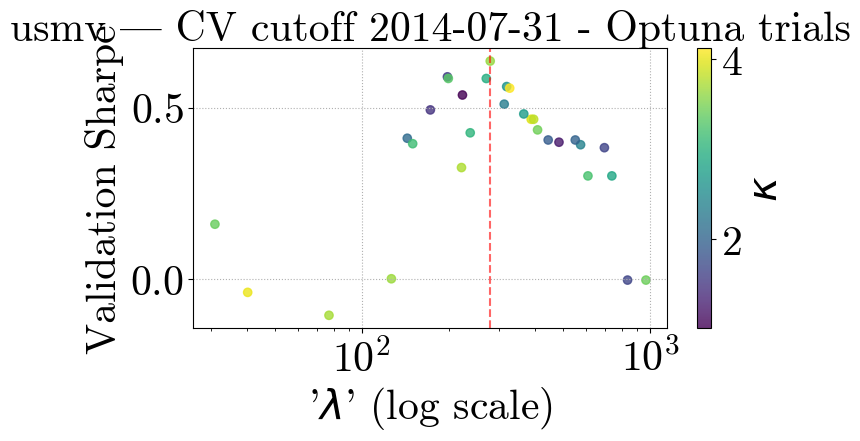

[I 2025-05-05 23:50:46,345] A new study created in memory with name: no-name-fb969208-4e62-4c78-b689-469443f00aae
[I 2025-05-05 23:50:51,091] Trial 0 finished with value: 1.0451844287847973 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0451844287847973.
[I 2025-05-05 23:50:54,476] Trial 1 finished with value: 1.3832268239319543 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.3832268239319543.
[I 2025-05-05 23:50:57,861] Trial 2 finished with value: 1.1019970482947115 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.3832268239319543.
[I 2025-05-05 23:51:02,192] Trial 3 finished with value: 0.417956722682559 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.3832268239319543.
[I 2025-05-05 23:51:05,596] Trial 4 finished with value: 1.3250133646226128 and parameter

Optuna best λ=823.3549, κ=1.032158511026232, Sharpe=1.4741


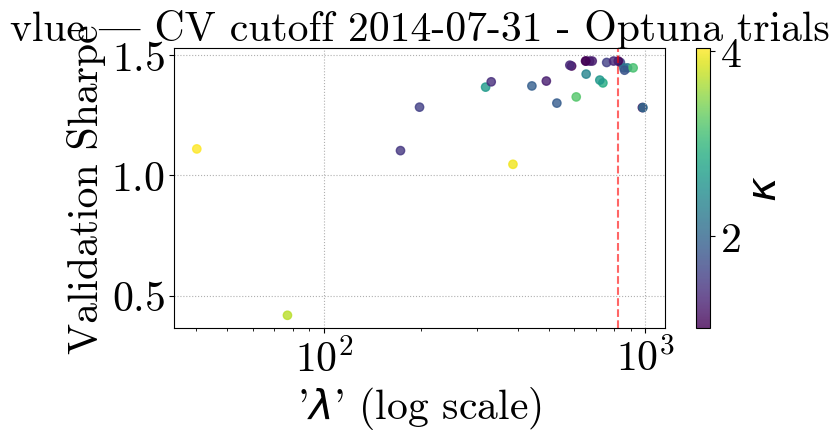

[I 2025-05-05 23:52:11,893] A new study created in memory with name: no-name-cb2fb446-0fbc-44a1-9507-70260a29afc8
[I 2025-05-05 23:52:16,173] Trial 0 finished with value: 0.19686227402891326 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.19686227402891326.
[I 2025-05-05 23:52:17,764] Trial 1 finished with value: 0.5925536360994367 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5925536360994367.
[I 2025-05-05 23:52:25,308] Trial 2 finished with value: 0.19686227402891335 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5925536360994367.
[I 2025-05-05 23:52:34,526] Trial 3 finished with value: -0.7567817211629374 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5925536360994367.
[I 2025-05-05 23:52:38,479] Trial 4 finished with value: 0.19686227402891326 and par

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.5926


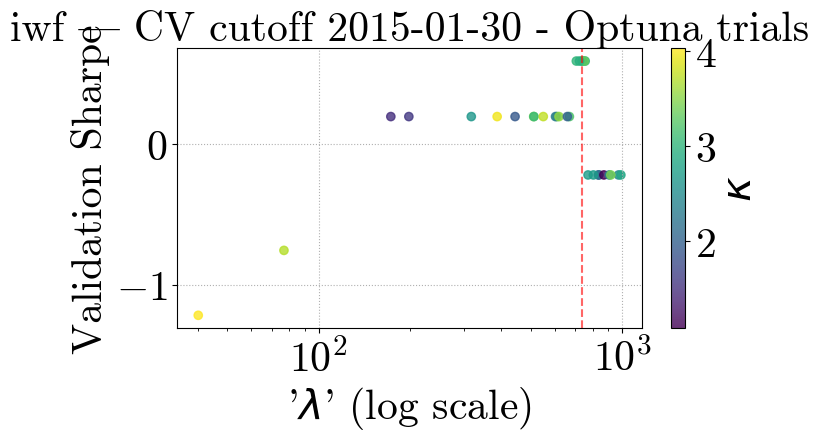

[I 2025-05-05 23:53:53,890] A new study created in memory with name: no-name-ab622df4-3741-437a-9c06-3db3b9f80212
[I 2025-05-05 23:53:57,142] Trial 0 finished with value: 1.0137813235343276 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0137813235343276.
[I 2025-05-05 23:54:00,571] Trial 1 finished with value: 1.0137813235343276 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0137813235343276.
[I 2025-05-05 23:54:06,159] Trial 2 finished with value: 1.0137813235343276 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.0137813235343276.
[I 2025-05-05 23:54:15,360] Trial 3 finished with value: 0.8995085314391935 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.0137813235343276.
[I 2025-05-05 23:54:18,627] Trial 4 finished with value: 1.0137813235343276 and paramete

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=1.0138


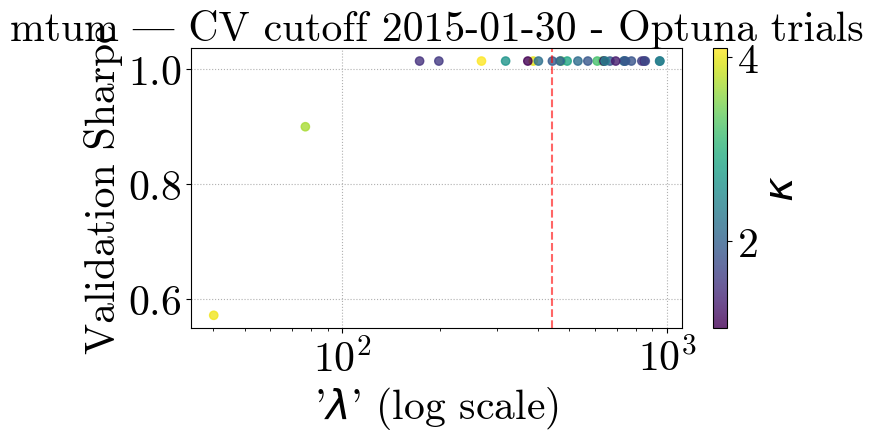

[I 2025-05-05 23:55:53,855] A new study created in memory with name: no-name-f2a9ebd3-7cc6-428a-b44d-e31f8fb2e3af
[I 2025-05-05 23:55:57,273] Trial 0 finished with value: -0.27907033482464993 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.27907033482464993.
[I 2025-05-05 23:56:00,222] Trial 1 finished with value: -0.27907033482464993 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.27907033482464993.
[I 2025-05-05 23:56:05,623] Trial 2 finished with value: -0.27907033482465 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.27907033482464993.
[I 2025-05-05 23:56:11,174] Trial 3 finished with value: -0.9271391781603812 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.27907033482464993.
[I 2025-05-05 23:56:14,407] Trial 4 finished with value: -0.2790703348246499

Optuna best λ=822.7978, κ=2.0161336400150702, Sharpe=0.5602


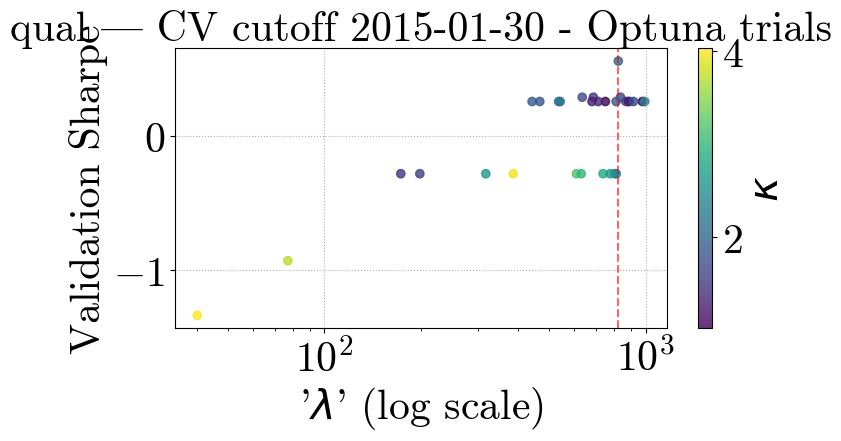

[I 2025-05-05 23:58:16,412] A new study created in memory with name: no-name-29e003b6-4423-420d-b8ea-a78ae7b49bf9
[I 2025-05-05 23:58:20,154] Trial 0 finished with value: -0.7617454081879981 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7617454081879981.
[I 2025-05-05 23:58:23,907] Trial 1 finished with value: -0.6053110030936105 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6053110030936105.
[I 2025-05-05 23:58:29,470] Trial 2 finished with value: -0.6428784283413507 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.6053110030936105.
[I 2025-05-05 23:58:37,185] Trial 3 finished with value: -0.20934259850807369 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.20934259850807369.
[I 2025-05-05 23:58:40,887] Trial 4 finished with value: -0.6053110030936105 a

Optuna best λ=27.3964, κ=3.9798232276603978, Sharpe=0.1375


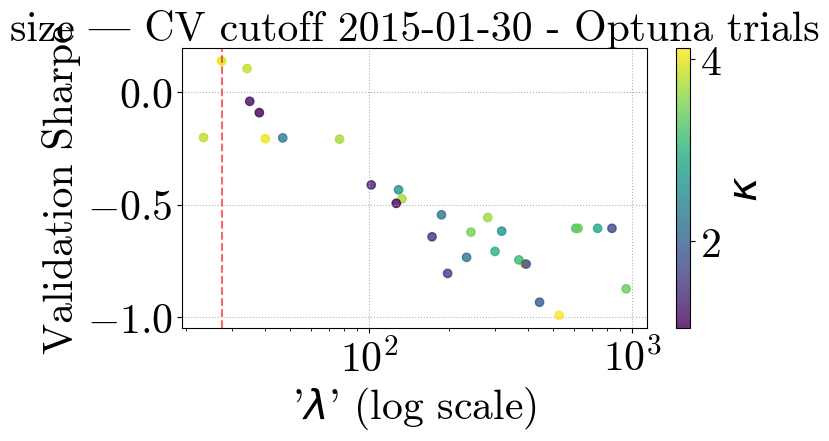

[I 2025-05-06 00:00:53,940] A new study created in memory with name: no-name-a0854709-8ee9-4a28-8cd9-ceba7f6fa617
[I 2025-05-06 00:00:58,021] Trial 0 finished with value: -0.18789106432190322 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.18789106432190322.
[I 2025-05-06 00:01:00,669] Trial 1 finished with value: -0.1878910643219033 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.18789106432190322.
[I 2025-05-06 00:01:06,233] Trial 2 finished with value: -0.1878910643219034 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.18789106432190322.
[I 2025-05-06 00:01:16,773] Trial 3 finished with value: -0.7391022046963748 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.18789106432190322.
[I 2025-05-06 00:01:19,687] Trial 4 finished with value: -0.187891064321903

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.1785


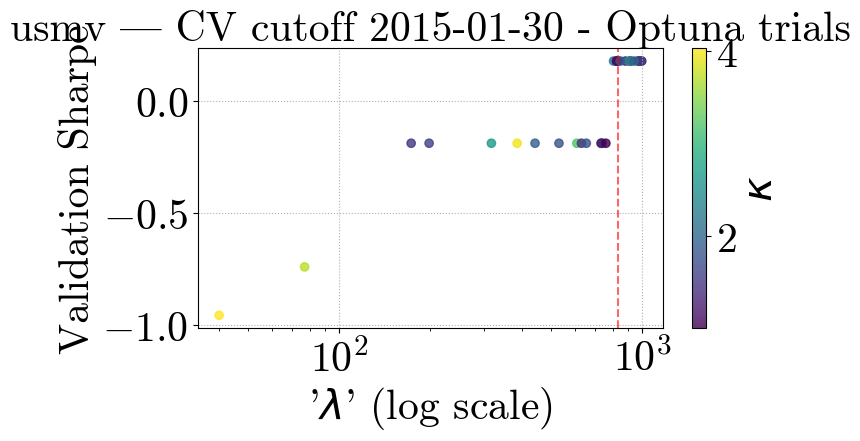

[I 2025-05-06 00:02:15,454] A new study created in memory with name: no-name-cbf24b29-cbcc-4ce9-8e11-4af811c9754c
[I 2025-05-06 00:02:18,803] Trial 0 finished with value: 1.1557329413675201 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.1557329413675201.
[I 2025-05-06 00:02:23,571] Trial 1 finished with value: 1.2795052287863842 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.2795052287863842.
[I 2025-05-06 00:02:30,389] Trial 2 finished with value: 1.1726190604046316 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.2795052287863842.
[I 2025-05-06 00:02:35,967] Trial 3 finished with value: 0.3518188745127379 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.2795052287863842.
[I 2025-05-06 00:02:39,602] Trial 4 finished with value: 1.2795052287863842 and paramete

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.2795


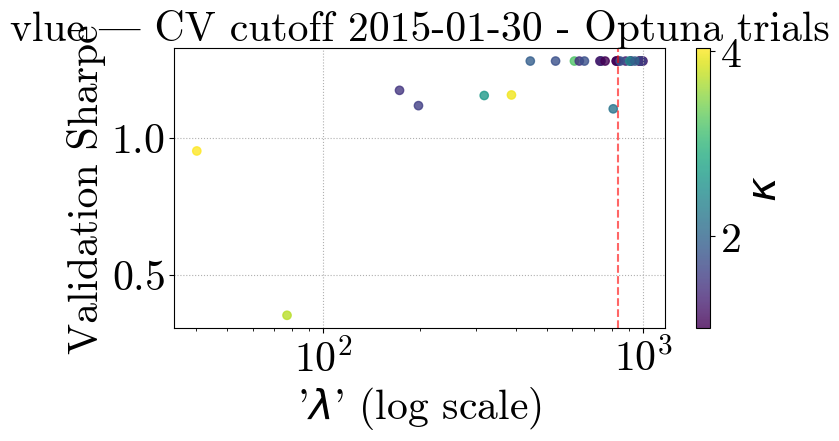

[I 2025-05-06 00:03:42,175] A new study created in memory with name: no-name-528ffe82-7fea-440f-81ba-d87bf7346cd6
[I 2025-05-06 00:03:46,872] Trial 0 finished with value: 0.28293550918400995 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.28293550918400995.
[I 2025-05-06 00:03:47,551] Trial 1 finished with value: 0.2829355091840099 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.28293550918400995.
[I 2025-05-06 00:04:05,019] Trial 2 finished with value: 0.2829355091840097 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.28293550918400995.
[I 2025-05-06 00:04:12,603] Trial 3 finished with value: -0.9469100819739398 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.28293550918400995.
[I 2025-05-06 00:04:16,352] Trial 4 finished with value: 0.28293550918400995 and p

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.2829


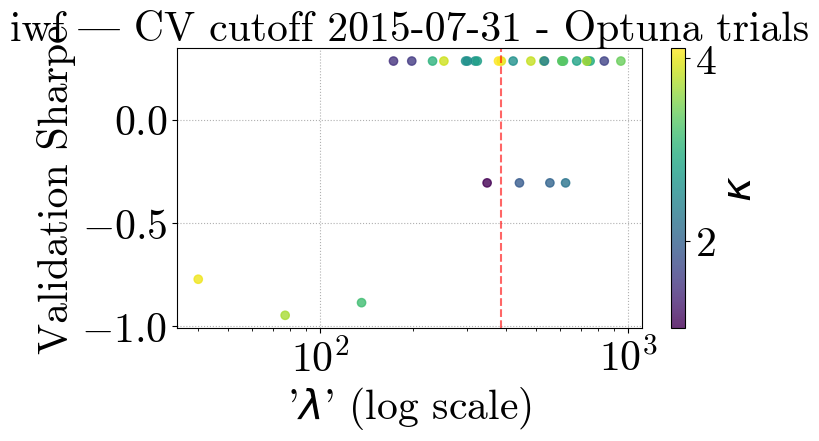

[I 2025-05-06 00:06:20,638] A new study created in memory with name: no-name-938d468e-a90d-4e29-9031-2304dd368988
[I 2025-05-06 00:06:24,116] Trial 0 finished with value: 1.001865556468576 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.001865556468576.
[I 2025-05-06 00:06:27,999] Trial 1 finished with value: 1.001865556468576 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.001865556468576.
[I 2025-05-06 00:06:33,785] Trial 2 finished with value: 1.0018655564685761 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.0018655564685761.
[I 2025-05-06 00:06:43,736] Trial 3 finished with value: 0.8835043457452115 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.0018655564685761.
[I 2025-05-06 00:06:47,818] Trial 4 finished with value: 1.001865556468576 and parameters: {

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=1.0019


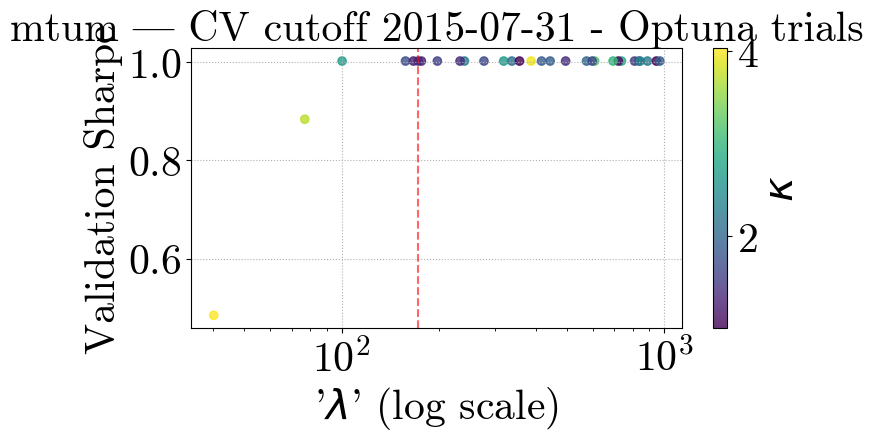

[I 2025-05-06 00:08:29,052] A new study created in memory with name: no-name-120b4119-a979-46e8-add4-5d6632f3d9c1
[I 2025-05-06 00:08:33,666] Trial 0 finished with value: -0.4788203170801891 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.4788203170801891.
[I 2025-05-06 00:08:37,197] Trial 1 finished with value: -0.4788203170801891 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.4788203170801891.
[I 2025-05-06 00:08:44,933] Trial 2 finished with value: -0.4788203170801889 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.4788203170801889.
[I 2025-05-06 00:08:53,418] Trial 3 finished with value: -0.8811432186184854 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.4788203170801889.
[I 2025-05-06 00:08:58,103] Trial 4 finished with value: -0.4788203170801891 and

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.4582


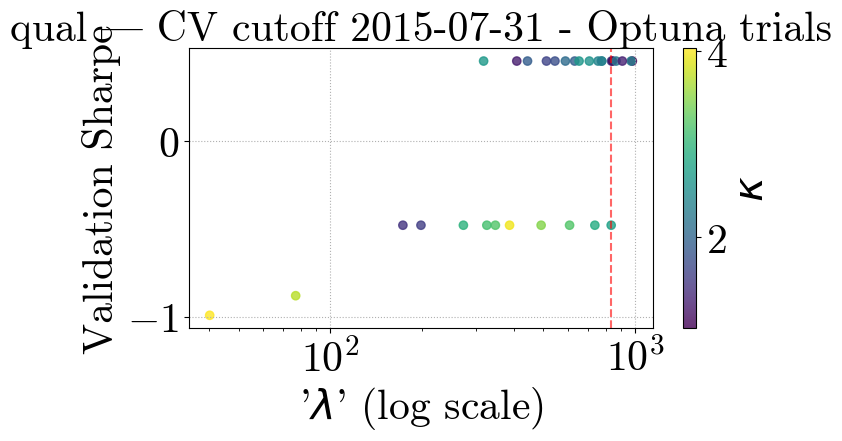

[I 2025-05-06 00:11:21,831] A new study created in memory with name: no-name-4a12c71d-242c-4160-b0b0-85a5ef68d769
[I 2025-05-06 00:11:27,014] Trial 0 finished with value: -0.43973395317572367 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.43973395317572367.
[I 2025-05-06 00:11:29,902] Trial 1 finished with value: -0.40900879301731746 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.40900879301731746.
[I 2025-05-06 00:11:34,597] Trial 2 finished with value: -0.30518501954715654 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.30518501954715654.
[I 2025-05-06 00:11:41,062] Trial 3 finished with value: 0.06240271301549148 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.06240271301549148.
[I 2025-05-06 00:11:44,264] Trial 4 finished with value: -0.55153105791231

Optuna best λ=34.2366, κ=3.5723657905253328, Sharpe=0.3567


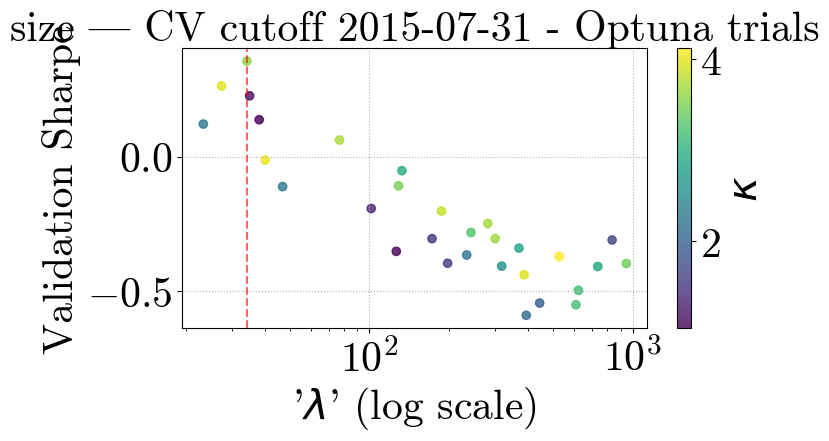

[I 2025-05-06 00:14:14,981] A new study created in memory with name: no-name-8f42a796-81b6-45dc-ae2e-8196624290ce
[I 2025-05-06 00:14:18,629] Trial 0 finished with value: 0.18866954895515256 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.18866954895515256.
[I 2025-05-06 00:14:23,215] Trial 1 finished with value: -0.7031601223861159 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.18866954895515256.
[I 2025-05-06 00:14:28,598] Trial 2 finished with value: -0.19898135557163604 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.18866954895515256.
[I 2025-05-06 00:14:38,798] Trial 3 finished with value: -0.07984958707001158 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.18866954895515256.
[I 2025-05-06 00:14:42,162] Trial 4 finished with value: 0.18866954895515242 a

Optuna best λ=542.2628, κ=2.165370231561575, Sharpe=0.1887


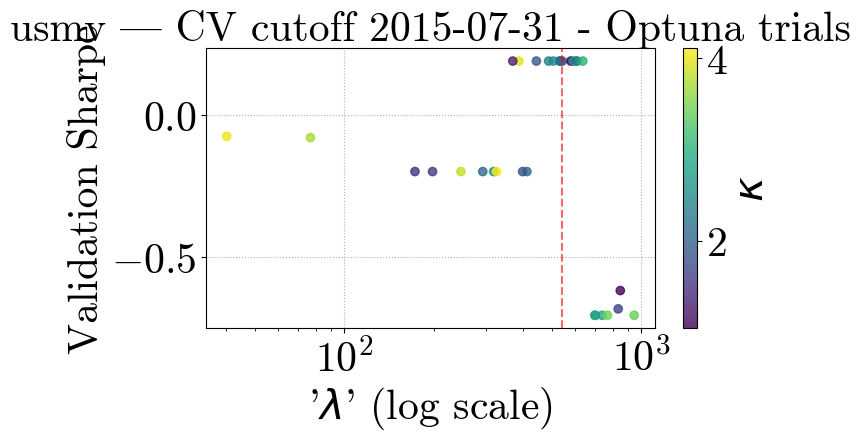

[I 2025-05-06 00:16:31,999] A new study created in memory with name: no-name-212eb4b2-286e-4bc5-b294-203ec24fb9af
[I 2025-05-06 00:16:35,228] Trial 0 finished with value: 1.4464713663615087 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.4464713663615087.
[I 2025-05-06 00:16:38,549] Trial 1 finished with value: 1.4464713663615087 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.4464713663615087.
[I 2025-05-06 00:16:46,529] Trial 2 finished with value: 1.3384283859869333 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.4464713663615087.
[I 2025-05-06 00:16:52,209] Trial 3 finished with value: 0.912689104397084 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.4464713663615087.
[I 2025-05-06 00:16:55,313] Trial 4 finished with value: 1.4464713663615087 and parameter

Optuna best λ=720.8662, κ=2.2154997449705958, Sharpe=1.4465


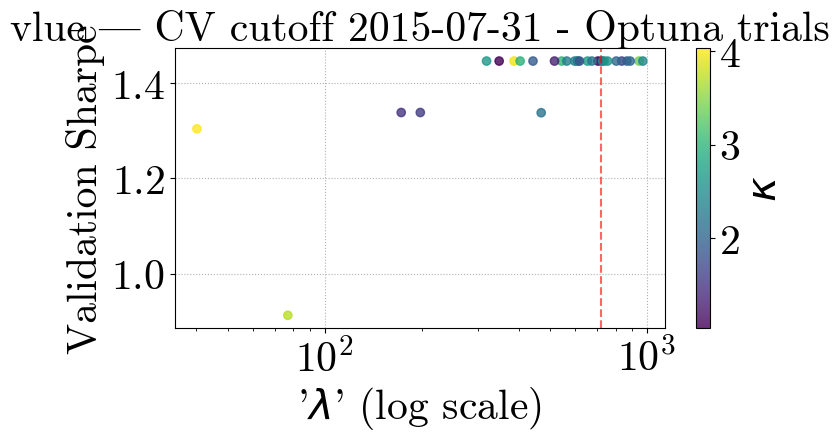

[I 2025-05-06 00:18:14,480] A new study created in memory with name: no-name-d4290ffa-940f-410e-b149-dabe04e918d5
[I 2025-05-06 00:18:19,229] Trial 0 finished with value: -0.883386587580568 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.883386587580568.
[I 2025-05-06 00:18:23,044] Trial 1 finished with value: -0.883386587580568 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.883386587580568.
[I 2025-05-06 00:18:39,281] Trial 2 finished with value: -0.8833865875805679 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.8833865875805679.
[I 2025-05-06 00:18:47,745] Trial 3 finished with value: -0.8818307199482188 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.8818307199482188.
[I 2025-05-06 00:18:52,110] Trial 4 finished with value: -0.883386587580568 and para

Optuna best λ=34.2268, κ=3.834733028321934, Sharpe=-0.2074


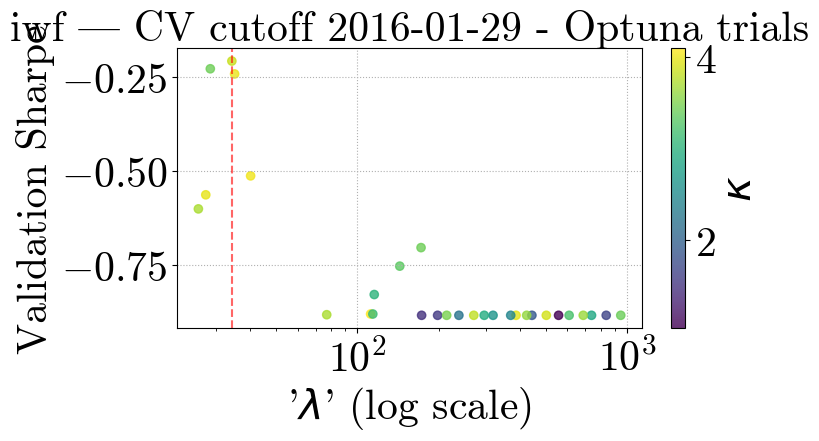

[I 2025-05-06 00:22:17,278] A new study created in memory with name: no-name-fe41c6f1-c147-48d2-9df6-e3c671eafaf2
[I 2025-05-06 00:22:21,012] Trial 0 finished with value: 1.523807174588965 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.523807174588965.
[I 2025-05-06 00:22:24,275] Trial 1 finished with value: 1.523807174588965 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.523807174588965.
[I 2025-05-06 00:22:30,888] Trial 2 finished with value: 1.523807174588965 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.523807174588965.
[I 2025-05-06 00:22:39,978] Trial 3 finished with value: 0.9882089322833754 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.523807174588965.
[I 2025-05-06 00:22:43,827] Trial 4 finished with value: 1.523807174588965 and parameters: {'la

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=1.5238


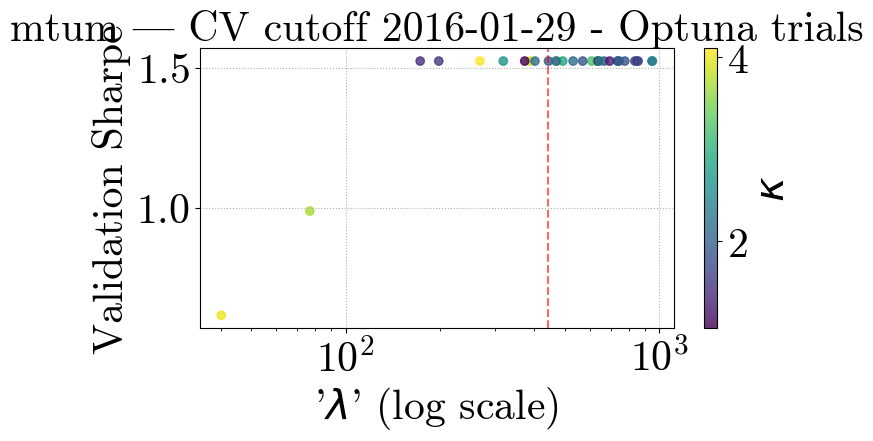

[I 2025-05-06 00:24:27,159] A new study created in memory with name: no-name-97705ed3-0c86-4fd5-8937-b97c7860d440
[I 2025-05-06 00:24:31,807] Trial 0 finished with value: -1.3030668994684087 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.3030668994684087.
[I 2025-05-06 00:24:34,828] Trial 1 finished with value: -1.3030668994684087 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -1.3030668994684087.
[I 2025-05-06 00:24:41,791] Trial 2 finished with value: -0.4683839170072764 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.4683839170072764.
[I 2025-05-06 00:24:57,609] Trial 3 finished with value: 0.0021000580493952185 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.0021000580493952185.
[I 2025-05-06 00:25:00,677] Trial 4 finished with value: -1.3030668994684087

Optuna best λ=531.1417, κ=2.1258152001831987, Sharpe=1.2841


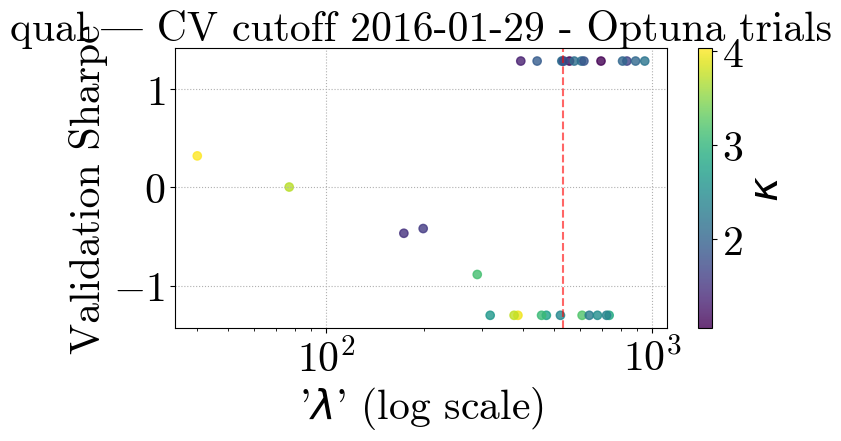

[I 2025-05-06 00:27:46,393] A new study created in memory with name: no-name-bc6d5d4b-6a0e-44eb-b4a8-9b969be263d3
[I 2025-05-06 00:27:50,839] Trial 0 finished with value: -0.4806702650198999 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.4806702650198999.
[I 2025-05-06 00:27:55,443] Trial 1 finished with value: -0.5232170393961456 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.4806702650198999.
[I 2025-05-06 00:28:05,640] Trial 2 finished with value: -0.2738657898229539 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.2738657898229539.
[I 2025-05-06 00:28:11,220] Trial 3 finished with value: -0.0755459807625282 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.0755459807625282.
[I 2025-05-06 00:28:16,921] Trial 4 finished with value: -0.5232170393961456 and

Optuna best λ=23.3699, κ=1.9321629133842002, Sharpe=0.0771


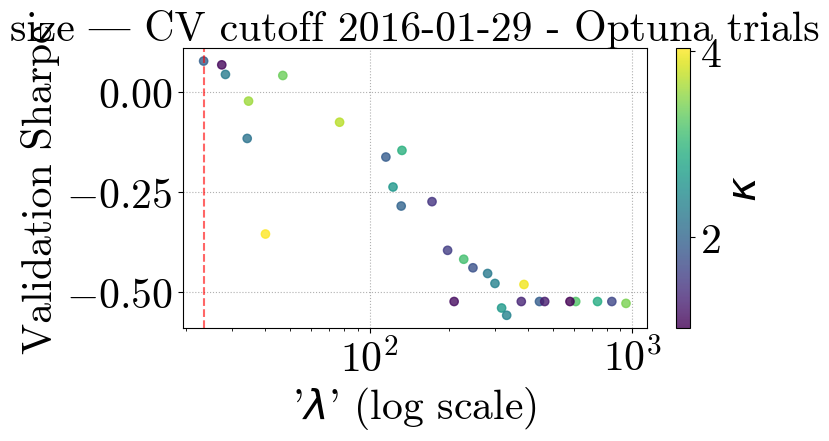

[I 2025-05-06 00:30:35,253] A new study created in memory with name: no-name-4382b7cc-1d01-449a-a595-a30ffb37f77d
[I 2025-05-06 00:30:39,207] Trial 0 finished with value: -0.5977573919826559 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5977573919826559.
[I 2025-05-06 00:30:43,156] Trial 1 finished with value: -0.6836738039592094 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5977573919826559.
[I 2025-05-06 00:30:51,003] Trial 2 finished with value: -0.633440205095678 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.5977573919826559.
[I 2025-05-06 00:31:01,423] Trial 3 finished with value: 0.34590391846988683 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.34590391846988683.
[I 2025-05-06 00:31:06,274] Trial 4 finished with value: -0.5977573919826559 and 

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.3459


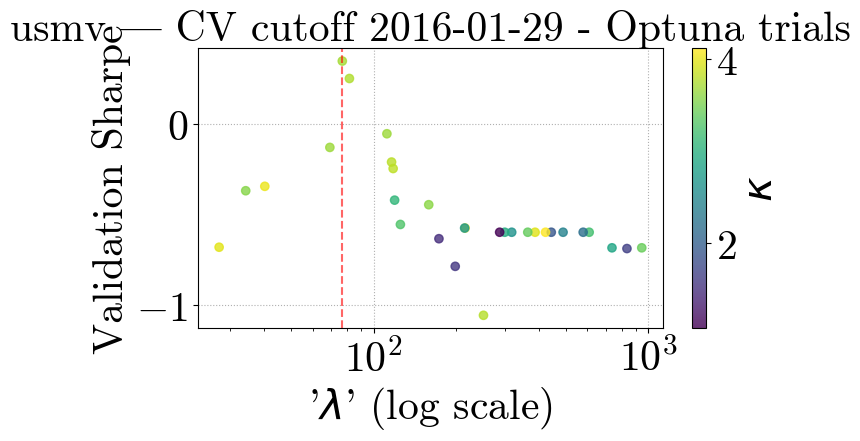

[I 2025-05-06 00:34:00,538] A new study created in memory with name: no-name-a66f7967-8b58-45d7-9da1-a774df0a331b
[I 2025-05-06 00:34:07,068] Trial 0 finished with value: 1.0989287881065617 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0989287881065617.
[I 2025-05-06 00:34:09,638] Trial 1 finished with value: 0.27184953791463395 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0989287881065617.
[I 2025-05-06 00:34:17,738] Trial 2 finished with value: 1.2309332997082985 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.2309332997082985.
[I 2025-05-06 00:34:22,685] Trial 3 finished with value: 1.1341165216159128 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.2309332997082985.
[I 2025-05-06 00:34:25,854] Trial 4 finished with value: 0.6996503361446283 and paramet

Optuna best λ=253.9802, κ=3.47746164195975, Sharpe=1.3099


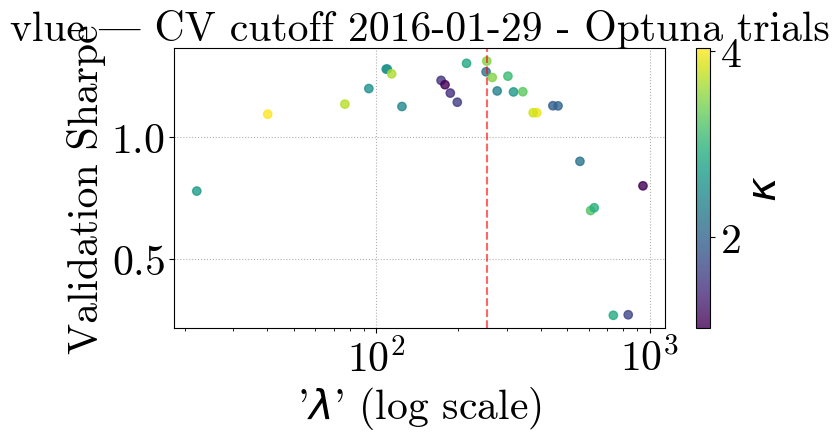

[I 2025-05-06 00:36:49,402] A new study created in memory with name: no-name-6e39a304-d4ea-41a8-a747-87af96d02bf9
[I 2025-05-06 00:36:58,404] Trial 0 finished with value: -0.730563987147049 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.730563987147049.
[I 2025-05-06 00:37:02,201] Trial 1 finished with value: -0.730563987147049 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.730563987147049.
[I 2025-05-06 00:37:19,422] Trial 2 finished with value: -0.7305639871470488 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.7305639871470488.
[I 2025-05-06 00:37:28,169] Trial 3 finished with value: -0.9626065335842001 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.7305639871470488.
[I 2025-05-06 00:37:34,669] Trial 4 finished with value: -0.730563987147049 and para

Optuna best λ=31.9649, κ=3.2930135451030447, Sharpe=-0.4686


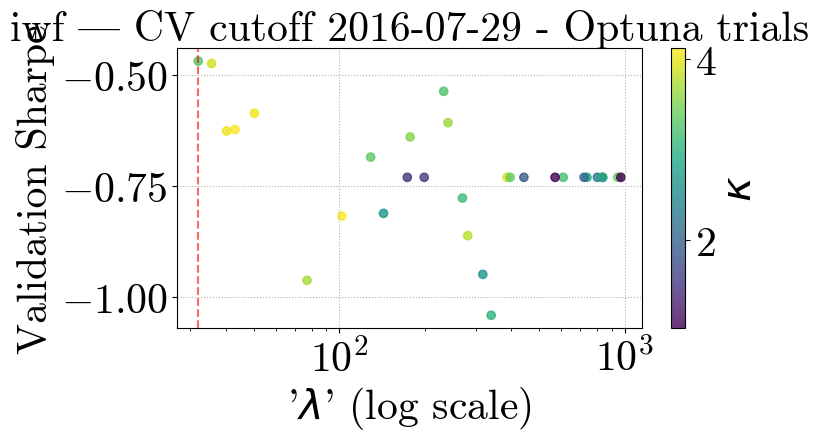

[I 2025-05-06 00:40:59,866] A new study created in memory with name: no-name-6d217496-9d41-4ed6-99f8-5eed0c2ff44f
[I 2025-05-06 00:41:04,617] Trial 0 finished with value: 1.176113723348641 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.176113723348641.
[I 2025-05-06 00:41:09,252] Trial 1 finished with value: 1.176113723348641 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.176113723348641.
[I 2025-05-06 00:41:15,215] Trial 2 finished with value: 1.255362615083927 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.255362615083927.
[I 2025-05-06 00:41:28,050] Trial 3 finished with value: 0.9487878272566618 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.255362615083927.
[I 2025-05-06 00:41:32,800] Trial 4 finished with value: 1.176113723348641 and parameters: {'la

Optuna best λ=126.5348, κ=2.01539071247649, Sharpe=1.6761


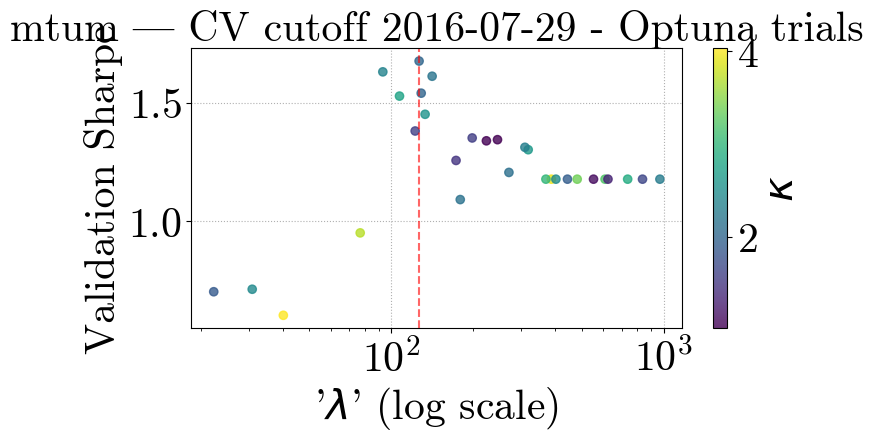

[I 2025-05-06 00:44:30,814] A new study created in memory with name: no-name-f23e2483-281c-4f24-aceb-082cbf78dd1f
[I 2025-05-06 00:44:34,699] Trial 0 finished with value: -1.0032706152727089 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0032706152727089.
[I 2025-05-06 00:44:39,848] Trial 1 finished with value: -1.0032706152727089 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -1.0032706152727089.
[I 2025-05-06 00:44:48,616] Trial 2 finished with value: 0.10270790199252679 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.10270790199252679.
[I 2025-05-06 00:44:58,768] Trial 3 finished with value: 0.20649207566122316 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.20649207566122316.
[I 2025-05-06 00:45:02,048] Trial 4 finished with value: -1.0032706152727089 and

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.9853


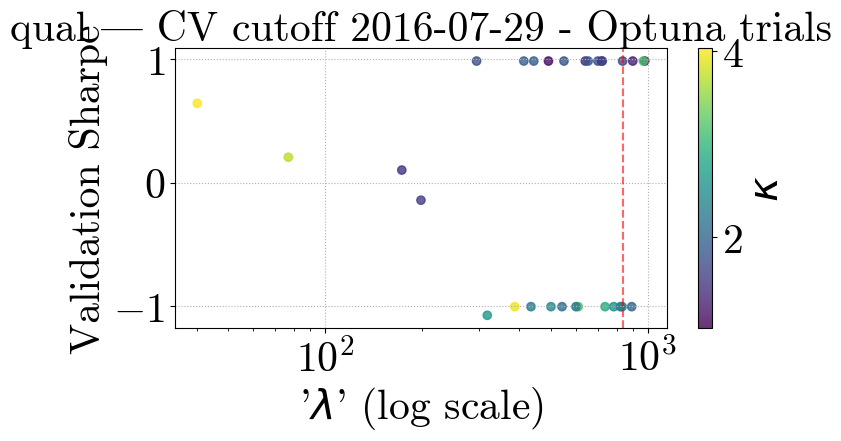

[I 2025-05-06 00:48:10,896] A new study created in memory with name: no-name-715db742-3e60-4330-886e-dd29e5fa3cde
[I 2025-05-06 00:48:15,815] Trial 0 finished with value: -0.24047906085319237 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.24047906085319237.
[I 2025-05-06 00:48:20,568] Trial 1 finished with value: -0.4544062672079502 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.24047906085319237.
[I 2025-05-06 00:48:31,580] Trial 2 finished with value: -0.1787550002271854 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.1787550002271854.
[I 2025-05-06 00:48:41,267] Trial 3 finished with value: 0.10169584281704976 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.10169584281704976.
[I 2025-05-06 00:48:46,580] Trial 4 finished with value: -0.4544062672079502 

Optuna best λ=28.2918, κ=3.7164421443642444, Sharpe=0.1284


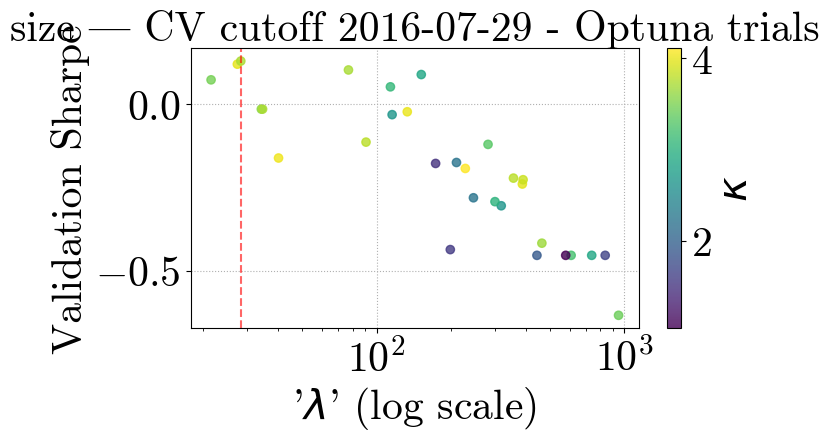

[I 2025-05-06 00:51:51,915] A new study created in memory with name: no-name-1aceb679-411b-4a40-b669-5b6ff4155325
[I 2025-05-06 00:51:56,410] Trial 0 finished with value: -0.6393517814509035 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6393517814509035.
[I 2025-05-06 00:52:02,514] Trial 1 finished with value: -0.1120086532344503 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.1120086532344503.
[I 2025-05-06 00:52:07,560] Trial 2 finished with value: -0.5273318680293503 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.1120086532344503.
[I 2025-05-06 00:52:17,861] Trial 3 finished with value: 0.49519866882681235 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.49519866882681235.
[I 2025-05-06 00:52:20,697] Trial 4 finished with value: -0.6393517814509035 and

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.4952


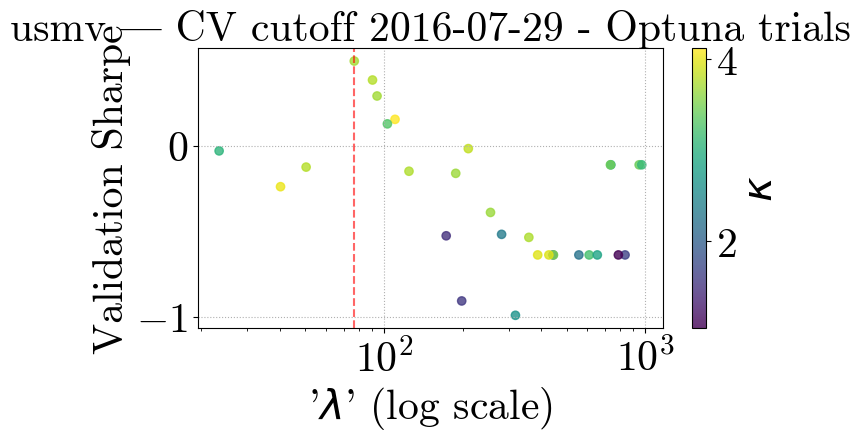

[I 2025-05-06 00:55:15,485] A new study created in memory with name: no-name-d27ca525-b509-4622-b50d-2201b6f57d57
[I 2025-05-06 00:55:21,548] Trial 0 finished with value: 0.23114661880906898 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.23114661880906898.
[I 2025-05-06 00:55:27,526] Trial 1 finished with value: 0.0363190392910577 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.23114661880906898.
[I 2025-05-06 00:55:34,592] Trial 2 finished with value: 0.230907418756905 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.23114661880906898.
[I 2025-05-06 00:55:41,191] Trial 3 finished with value: -0.08238105062874136 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.23114661880906898.
[I 2025-05-06 00:55:48,177] Trial 4 finished with value: 0.06763188540216798 and p

Optuna best λ=341.9438, κ=1.9612926001010043, Sharpe=0.5632


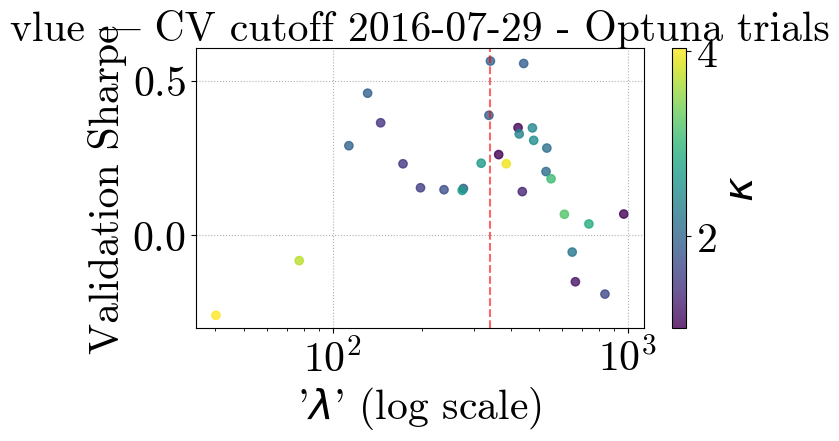

[I 2025-05-06 00:58:09,124] A new study created in memory with name: no-name-7c10da9c-00db-4ba3-b9f8-a0730b94380d
[I 2025-05-06 00:58:17,595] Trial 0 finished with value: -0.16990143423043388 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.16990143423043388.
[I 2025-05-06 00:58:23,643] Trial 1 finished with value: -0.16990143423043388 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.16990143423043388.
[I 2025-05-06 00:58:32,126] Trial 2 finished with value: -0.38433713504619094 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.16990143423043388.
[I 2025-05-06 00:58:41,725] Trial 3 finished with value: -1.0472863822229315 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.16990143423043388.
[I 2025-05-06 00:58:47,859] Trial 4 finished with value: -0.1699014342304

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=-0.1699


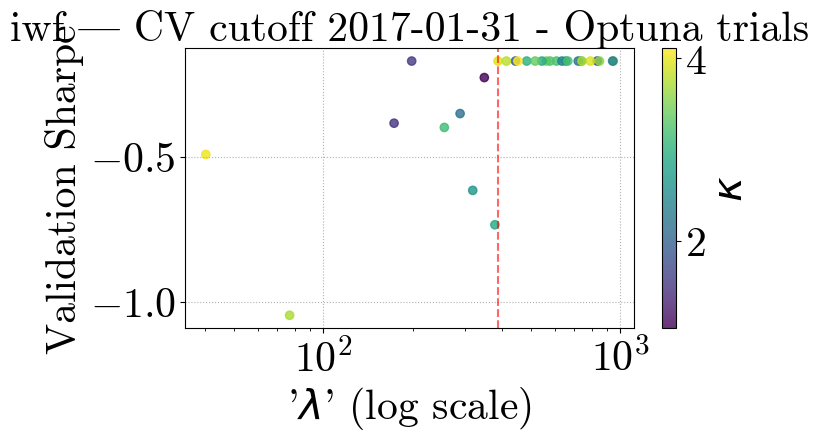

[I 2025-05-06 01:01:24,006] A new study created in memory with name: no-name-a331cd45-29a3-4428-9cf4-7875d6378447
[I 2025-05-06 01:01:29,574] Trial 0 finished with value: 0.728550374850522 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.728550374850522.
[I 2025-05-06 01:01:34,189] Trial 1 finished with value: 0.728550374850522 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.728550374850522.
[I 2025-05-06 01:01:41,569] Trial 2 finished with value: 0.8244924802344684 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.8244924802344684.
[I 2025-05-06 01:01:51,072] Trial 3 finished with value: 0.9401050596502006 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.9401050596502006.
[I 2025-05-06 01:01:55,739] Trial 4 finished with value: 0.728550374850522 and parameters: {

Optuna best λ=96.6120, κ=3.5603588166510027, Sharpe=1.3288


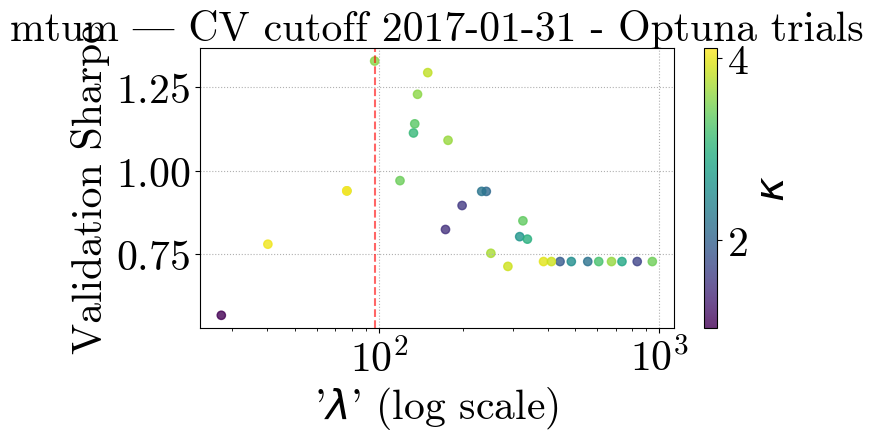

[I 2025-05-06 01:04:47,820] A new study created in memory with name: no-name-0d325b1c-3d2e-4259-9f38-8752450e8ee3
[I 2025-05-06 01:04:52,569] Trial 0 finished with value: -0.6551736832562959 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6551736832562959.
[I 2025-05-06 01:04:56,632] Trial 1 finished with value: -0.6551736832562959 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.6551736832562959.
[I 2025-05-06 01:05:03,719] Trial 2 finished with value: 0.4846477058936375 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.4846477058936375.
[I 2025-05-06 01:05:14,523] Trial 3 finished with value: 0.20255347205588586 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.4846477058936375.
[I 2025-05-06 01:05:18,757] Trial 4 finished with value: -0.6551736832562959 and pa

Optuna best λ=805.2383, κ=2.1855441481340363, Sharpe=0.6379


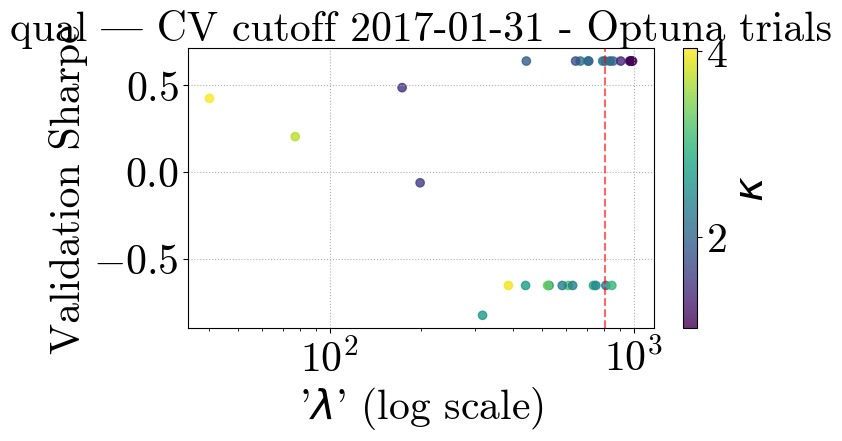

[I 2025-05-06 01:08:03,076] A new study created in memory with name: no-name-de91272f-9e41-4ecf-8a20-c27f9632ed5d
[I 2025-05-06 01:08:09,055] Trial 0 finished with value: -0.263264066863675 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.263264066863675.
[I 2025-05-06 01:08:14,619] Trial 1 finished with value: -0.4772219219268636 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.263264066863675.
[I 2025-05-06 01:08:22,921] Trial 2 finished with value: -0.11712799451828881 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.11712799451828881.
[I 2025-05-06 01:08:32,487] Trial 3 finished with value: 0.1245283222474844 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1245283222474844.
[I 2025-05-06 01:08:40,153] Trial 4 finished with value: -0.4772219219268636 and pa

Optuna best λ=38.1030, κ=1.0411523272835175, Sharpe=0.4405


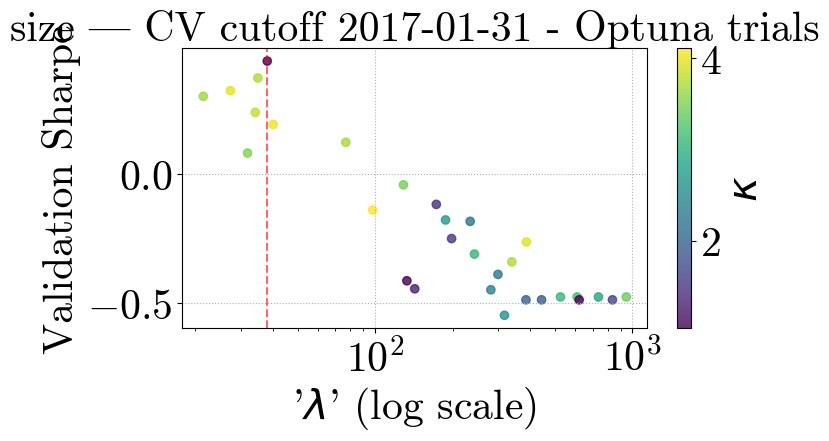

[I 2025-05-06 01:11:42,769] A new study created in memory with name: no-name-ff669aeb-81df-446c-ac96-0b3c4c7f826e
[I 2025-05-06 01:11:47,668] Trial 0 finished with value: -1.0627858554423473 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0627858554423473.
[I 2025-05-06 01:11:55,070] Trial 1 finished with value: -0.1552493311625916 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.1552493311625916.
[I 2025-05-06 01:12:01,000] Trial 2 finished with value: -0.9231328697185004 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.1552493311625916.
[I 2025-05-06 01:12:12,985] Trial 3 finished with value: -0.0738033280363482 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.0738033280363482.
[I 2025-05-06 01:12:16,334] Trial 4 finished with value: -0.48188174328030264 an

Optuna best λ=787.9570, κ=1.0411523272835175, Sharpe=0.0987


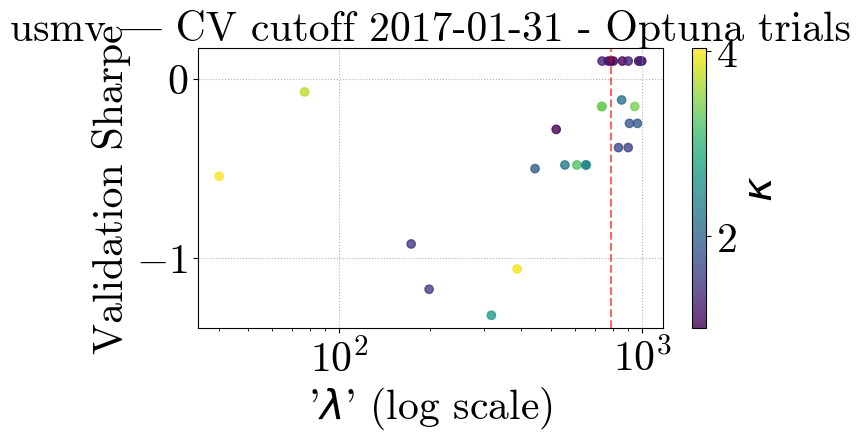

[I 2025-05-06 01:13:56,950] A new study created in memory with name: no-name-fb1309ce-50f0-4f89-bdae-f87d433061ca
[I 2025-05-06 01:14:03,667] Trial 0 finished with value: 0.79623342537473 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.79623342537473.
[I 2025-05-06 01:14:07,716] Trial 1 finished with value: 0.2948873476418223 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.79623342537473.
[I 2025-05-06 01:14:16,116] Trial 2 finished with value: 0.7170468309951096 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.79623342537473.
[I 2025-05-06 01:14:22,098] Trial 3 finished with value: 0.5549630757358168 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.79623342537473.
[I 2025-05-06 01:14:26,167] Trial 4 finished with value: 0.9178813617647728 and parameters: {'lamb

Optuna best λ=609.0927, κ=3.2113854510604285, Sharpe=0.9179


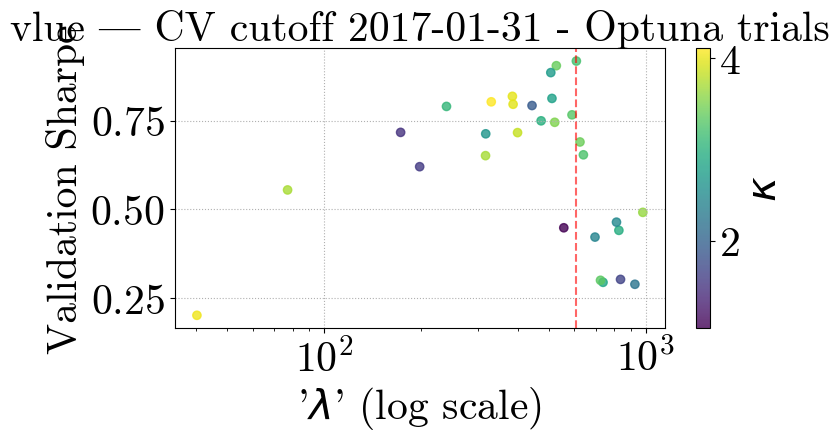

[I 2025-05-06 01:16:45,934] A new study created in memory with name: no-name-8f222f6b-6e8a-4684-92ca-ffdc8fdbf453
[I 2025-05-06 01:16:54,749] Trial 0 finished with value: -1.0466254493383893 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0466254493383893.
[I 2025-05-06 01:17:01,699] Trial 1 finished with value: -0.6368910664980916 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6368910664980916.
[I 2025-05-06 01:17:10,914] Trial 2 finished with value: -0.4864034707568211 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.4864034707568211.
[I 2025-05-06 01:17:19,614] Trial 3 finished with value: -1.4537475589824302 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.4864034707568211.
[I 2025-05-06 01:17:27,246] Trial 4 finished with value: -0.6368910664980916 and

Optuna best λ=269.2856, κ=1.3092788964673219, Sharpe=-0.0099


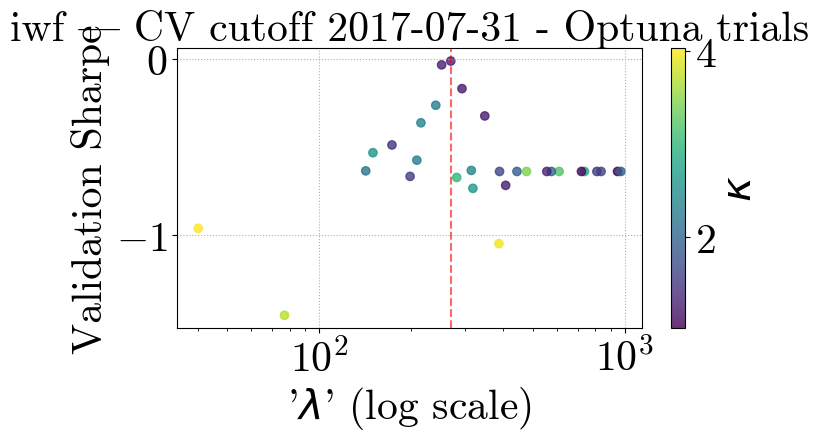

[I 2025-05-06 01:20:07,781] A new study created in memory with name: no-name-ced26fd1-5505-4eaf-94c9-367f508488c7
[I 2025-05-06 01:20:11,913] Trial 0 finished with value: 1.2241679198414142 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.2241679198414142.
[I 2025-05-06 01:20:15,732] Trial 1 finished with value: 1.2241679198414142 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.2241679198414142.
[I 2025-05-06 01:20:24,063] Trial 2 finished with value: 1.281300137562714 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.281300137562714.
[I 2025-05-06 01:20:36,697] Trial 3 finished with value: 1.861039857305642 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.861039857305642.
[I 2025-05-06 01:20:40,595] Trial 4 finished with value: 1.2241679198414142 and parameters: 

Optuna best λ=97.8659, κ=3.702308982650631, Sharpe=2.1156


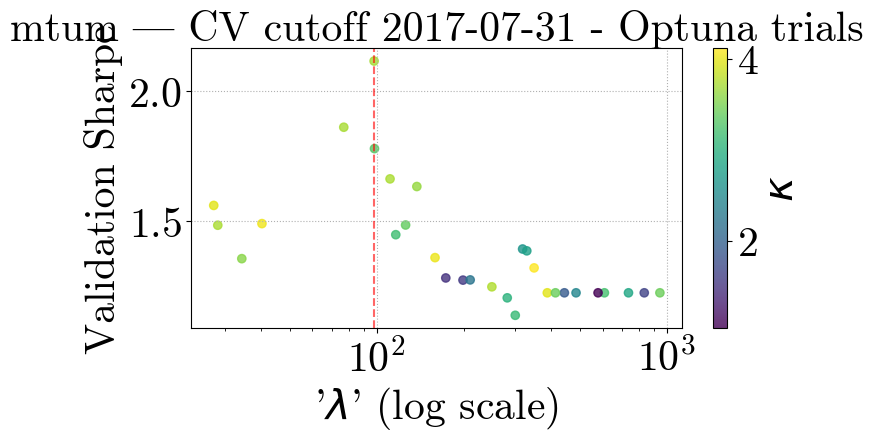

[I 2025-05-06 01:24:10,132] A new study created in memory with name: no-name-2d46f1c8-2aaf-438c-9929-5b8f7843f11f
[I 2025-05-06 01:24:16,128] Trial 0 finished with value: -0.7378163880806663 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7378163880806663.
[I 2025-05-06 01:24:21,645] Trial 1 finished with value: -0.7378163880806663 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.7378163880806663.
[I 2025-05-06 01:24:28,410] Trial 2 finished with value: 0.6322861490360344 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.6322861490360344.
[I 2025-05-06 01:24:37,964] Trial 3 finished with value: 0.13799469670985032 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.6322861490360344.
[I 2025-05-06 01:24:43,177] Trial 4 finished with value: -0.7378163880806663 and pa

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.7208


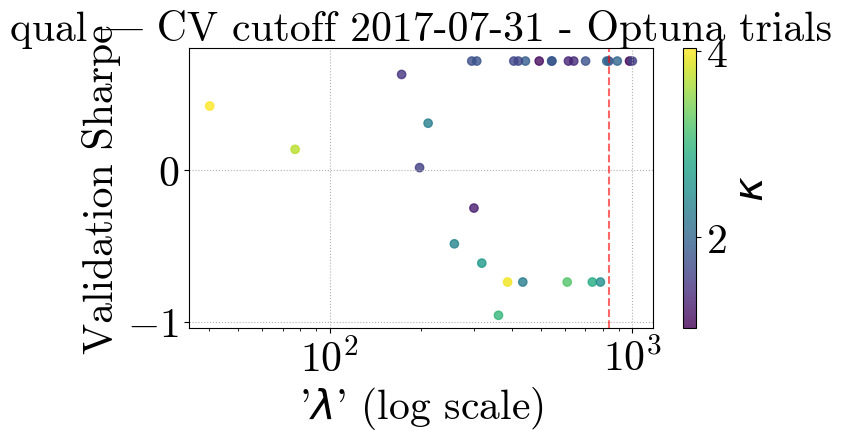

[I 2025-05-06 01:27:57,696] A new study created in memory with name: no-name-955452d6-60ac-4d07-879f-0ca8b563717e
[I 2025-05-06 01:28:04,445] Trial 0 finished with value: 0.317270282046777 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.317270282046777.
[I 2025-05-06 01:28:10,692] Trial 1 finished with value: -0.3105283743457976 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.317270282046777.
[I 2025-05-06 01:28:18,242] Trial 2 finished with value: 0.2909013800518288 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.317270282046777.
[I 2025-05-06 01:28:29,160] Trial 3 finished with value: 0.5706476791485013 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5706476791485013.
[I 2025-05-06 01:28:35,228] Trial 4 finished with value: -0.3105283743457976 and parameters

Optuna best λ=28.2918, κ=3.7164421443642444, Sharpe=0.6697


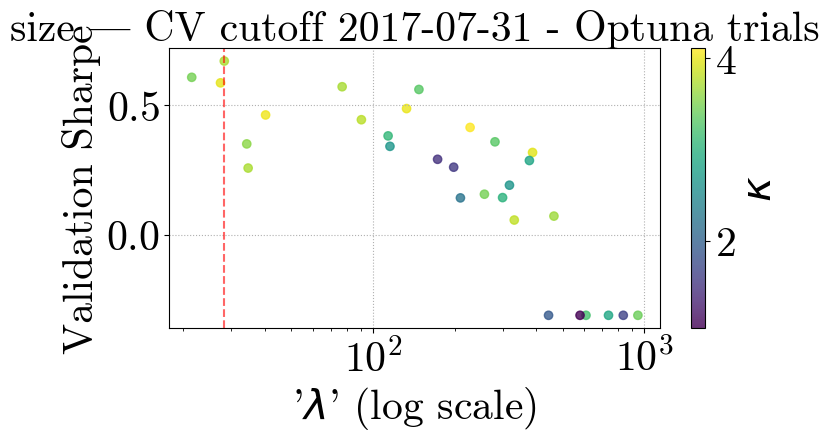

[I 2025-05-06 01:32:04,377] A new study created in memory with name: no-name-b2a6918a-788a-4385-885a-2d8c9a756c39
[I 2025-05-06 01:32:07,958] Trial 0 finished with value: -1.0207147954473017 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0207147954473017.
[I 2025-05-06 01:32:12,894] Trial 1 finished with value: 1.1794863961524162 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.1794863961524162.
[I 2025-05-06 01:32:21,624] Trial 2 finished with value: -1.0770291845391853 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.1794863961524162.
[I 2025-05-06 01:32:32,055] Trial 3 finished with value: -0.007626092759680926 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.1794863961524162.
[I 2025-05-06 01:32:34,924] Trial 4 finished with value: -0.4141292380588331 and p

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=1.1795


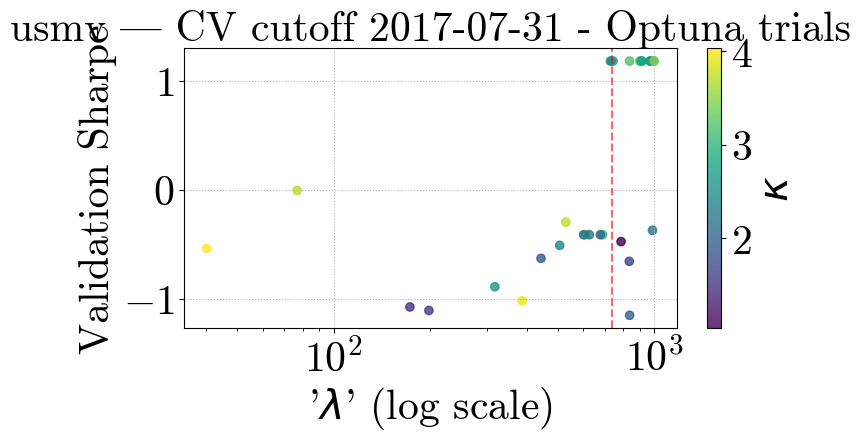

[I 2025-05-06 01:34:43,541] A new study created in memory with name: no-name-68353012-46fb-4571-9f0e-2011d0aee8a7
[I 2025-05-06 01:34:48,273] Trial 0 finished with value: 0.41045716809123234 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.41045716809123234.
[I 2025-05-06 01:34:52,604] Trial 1 finished with value: -0.15746230920202628 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.41045716809123234.
[I 2025-05-06 01:34:58,991] Trial 2 finished with value: 0.15484447223030506 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.41045716809123234.
[I 2025-05-06 01:35:04,838] Trial 3 finished with value: -0.023209485451828663 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.41045716809123234.
[I 2025-05-06 01:35:09,659] Trial 4 finished with value: 0.19758535862972326 

Optuna best λ=360.6808, κ=1.417247520884584, Sharpe=0.4862


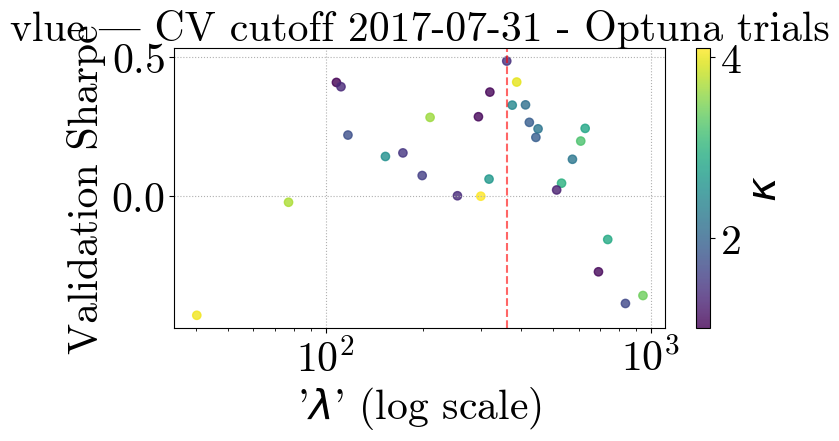

[I 2025-05-06 01:37:20,541] A new study created in memory with name: no-name-c153f0c2-4d0d-4ca5-a05f-a6c554d50310
[I 2025-05-06 01:37:26,256] Trial 0 finished with value: -0.37885750479524266 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.37885750479524266.
[I 2025-05-06 01:37:32,954] Trial 1 finished with value: -0.8322555030421476 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.37885750479524266.
[I 2025-05-06 01:37:38,357] Trial 2 finished with value: -0.4627404752879387 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.37885750479524266.
[I 2025-05-06 01:37:47,554] Trial 3 finished with value: -1.6903312371625137 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.37885750479524266.
[I 2025-05-06 01:37:52,706] Trial 4 finished with value: -0.832255503042147

Optuna best λ=277.0260, κ=1.0625335748558942, Sharpe=-0.0162


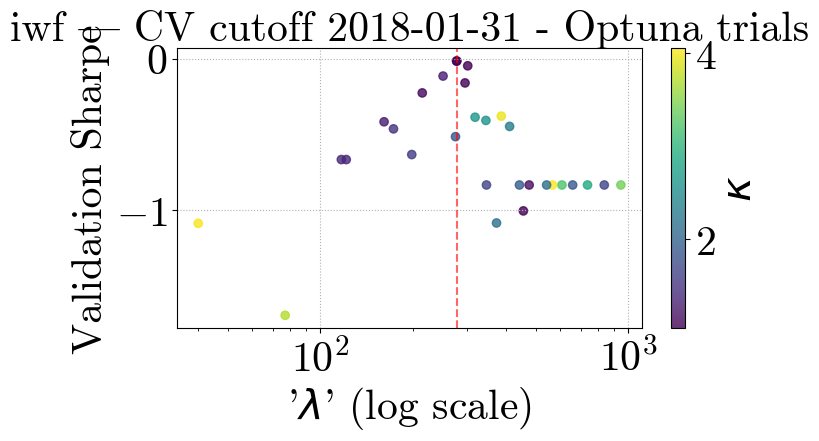

[I 2025-05-06 01:40:02,307] A new study created in memory with name: no-name-d68a22ae-4cf4-48bf-89c5-28cf1d04692d
[I 2025-05-06 01:40:07,720] Trial 0 finished with value: 1.3641644415664627 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.3641644415664627.
[I 2025-05-06 01:40:11,639] Trial 1 finished with value: 1.3641644415664627 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.3641644415664627.
[I 2025-05-06 01:40:19,153] Trial 2 finished with value: 1.454754850259767 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.454754850259767.
[I 2025-05-06 01:40:36,403] Trial 3 finished with value: 1.992229642498661 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.992229642498661.
[I 2025-05-06 01:40:40,507] Trial 4 finished with value: 1.3641644415664627 and parameters: 

Optuna best λ=93.8557, κ=3.0627018391420346, Sharpe=2.2430


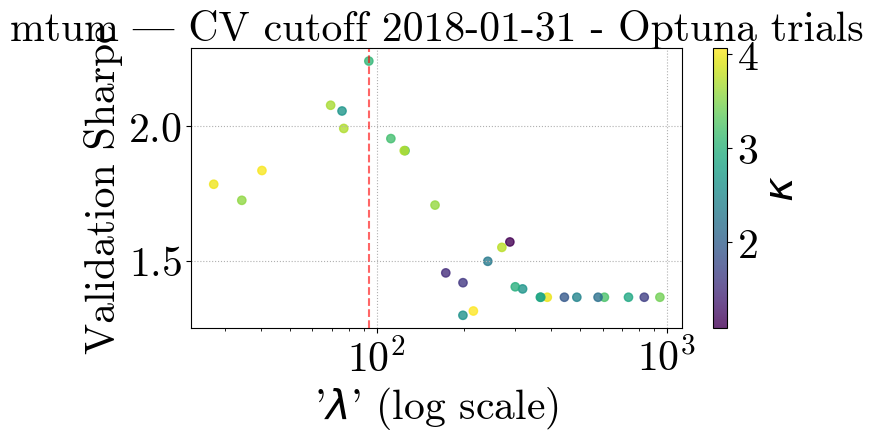

[I 2025-05-06 01:44:16,421] A new study created in memory with name: no-name-4947cbe4-607e-43d8-b3bc-93e9935592a9
[I 2025-05-06 01:44:22,270] Trial 0 finished with value: 0.6509218552307321 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6509218552307321.
[I 2025-05-06 01:44:26,818] Trial 1 finished with value: 0.6509218552307321 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6509218552307321.
[I 2025-05-06 01:44:36,738] Trial 2 finished with value: 0.5222666027137748 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6509218552307321.
[I 2025-05-06 01:44:48,518] Trial 3 finished with value: 0.164133970719647 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6509218552307321.
[I 2025-05-06 01:44:55,634] Trial 4 finished with value: 0.6509218552307321 and parameter

Optuna best λ=306.1260, κ=1.797308272706998, Sharpe=0.9045


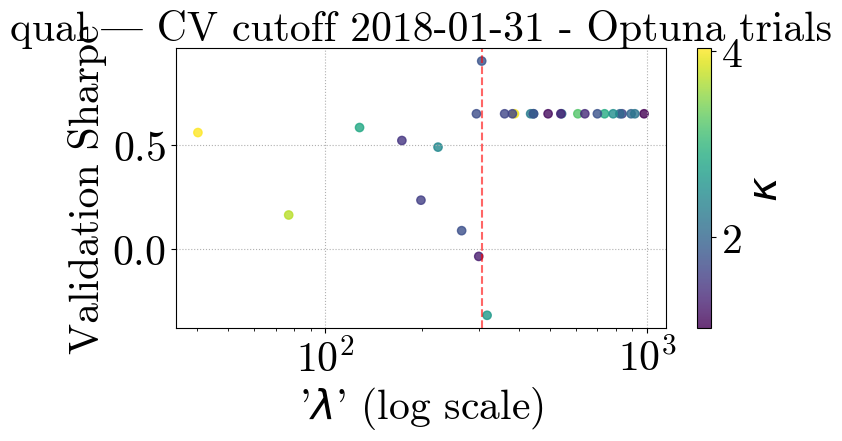

[I 2025-05-06 01:47:58,318] A new study created in memory with name: no-name-15f02bba-cb8c-42f2-8e9c-c770be2b83b6
[I 2025-05-06 01:48:02,998] Trial 0 finished with value: -0.1067842300474602 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.1067842300474602.
[I 2025-05-06 01:48:06,451] Trial 1 finished with value: -0.03037706620945663 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.03037706620945663.
[I 2025-05-06 01:48:15,099] Trial 2 finished with value: 0.06908522599990537 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.06908522599990537.
[I 2025-05-06 01:48:26,264] Trial 3 finished with value: 0.2857370512867935 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.2857370512867935.
[I 2025-05-06 01:48:29,998] Trial 4 finished with value: -0.1067842300474602 and

Optuna best λ=22.5573, κ=3.1449940322222174, Sharpe=0.3205


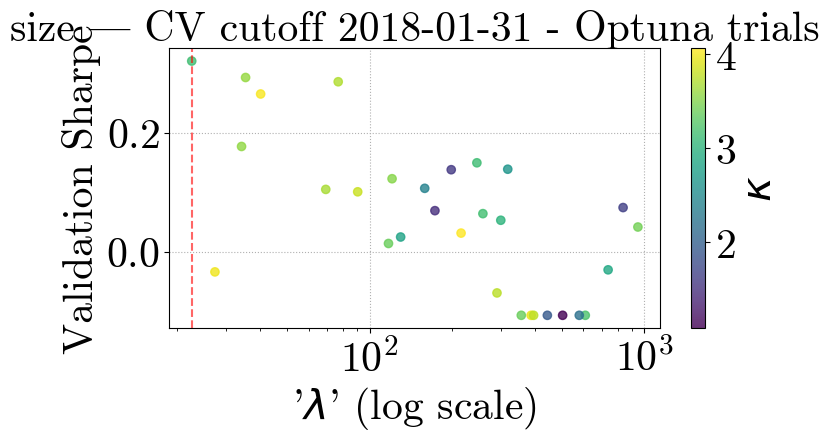

[I 2025-05-06 01:51:48,613] A new study created in memory with name: no-name-18bc47eb-6155-46a9-890d-ccb4df9cc4ca
[I 2025-05-06 01:51:53,400] Trial 0 finished with value: -0.65263321443508 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.65263321443508.
[I 2025-05-06 01:51:59,181] Trial 1 finished with value: 0.082468291907999 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.082468291907999.
[I 2025-05-06 01:52:05,532] Trial 2 finished with value: -0.42384142298771044 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.082468291907999.
[I 2025-05-06 01:52:19,930] Trial 3 finished with value: 0.07064236512291928 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.082468291907999.
[I 2025-05-06 01:52:26,180] Trial 4 finished with value: 0.082468291907999 and parameters: 

Optuna best λ=50.3067, κ=4.029145496054593, Sharpe=0.1975


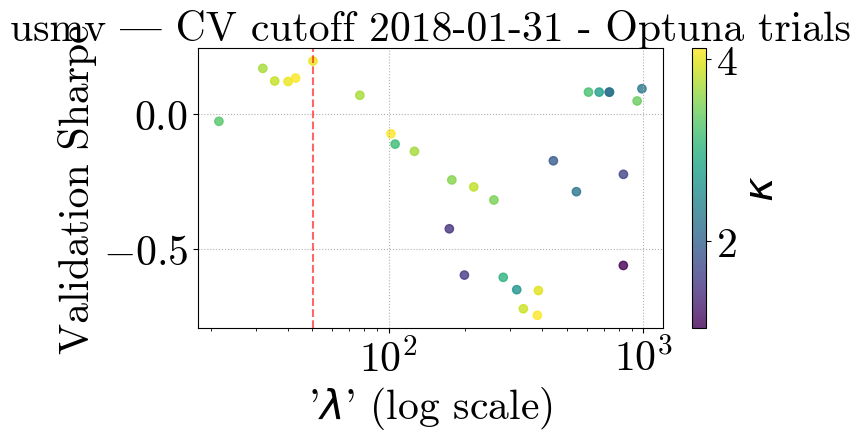

[I 2025-05-06 01:56:23,895] A new study created in memory with name: no-name-749096bb-a469-41da-b9d2-2b095d4e7114
[I 2025-05-06 01:56:32,545] Trial 0 finished with value: 0.18261078363794384 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.18261078363794384.
[I 2025-05-06 01:56:36,428] Trial 1 finished with value: 0.459761763372183 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.459761763372183.
[I 2025-05-06 01:56:44,846] Trial 2 finished with value: 0.609028752121856 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.609028752121856.
[I 2025-05-06 01:56:51,413] Trial 3 finished with value: 0.25801195287163997 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.609028752121856.
[I 2025-05-06 01:56:55,765] Trial 4 finished with value: 0.456118871696731 and parameters:

Optuna best λ=555.1292, κ=1.230878774258537, Sharpe=0.6518


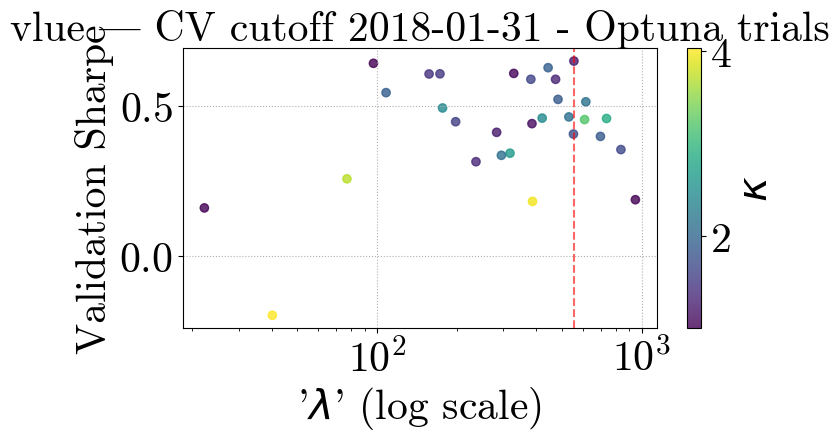

[I 2025-05-06 01:58:58,797] A new study created in memory with name: no-name-558d5139-550c-4076-ba7d-3b2b1aa3a78e
[I 2025-05-06 01:59:05,193] Trial 0 finished with value: -0.39873063269862274 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.39873063269862274.
[I 2025-05-06 01:59:10,579] Trial 1 finished with value: -0.39873063269862274 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.39873063269862274.
[I 2025-05-06 01:59:20,128] Trial 2 finished with value: 0.2624912532372121 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.2624912532372121.
[I 2025-05-06 01:59:32,064] Trial 3 finished with value: 0.9173992947653006 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.9173992947653006.
[I 2025-05-06 01:59:37,066] Trial 4 finished with value: -0.39873063269862274 an

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.9174


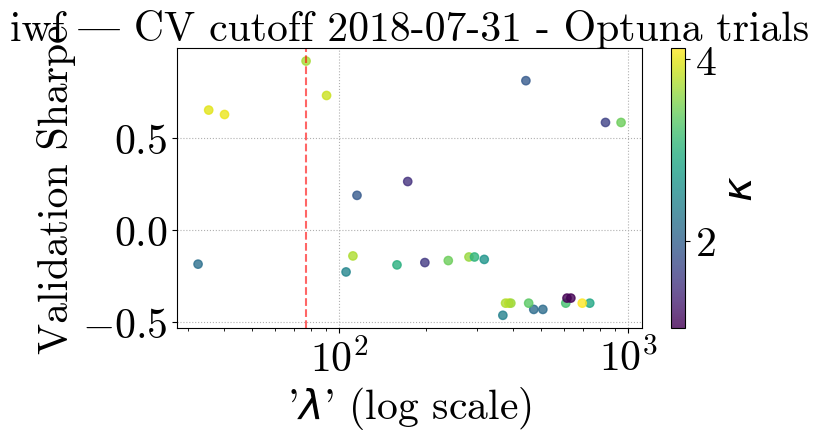

[I 2025-05-06 02:02:55,444] A new study created in memory with name: no-name-db5fd3b4-83bc-4c66-a6ae-950a5d2b680a
[I 2025-05-06 02:03:00,347] Trial 0 finished with value: 1.0313840716670117 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0313840716670117.
[I 2025-05-06 02:03:05,364] Trial 1 finished with value: 1.0313840716670117 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0313840716670117.
[I 2025-05-06 02:03:15,844] Trial 2 finished with value: 1.1173480649958831 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.1173480649958831.
[I 2025-05-06 02:03:25,508] Trial 3 finished with value: 1.4257961091848346 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.4257961091848346.
[I 2025-05-06 02:03:30,085] Trial 4 finished with value: 1.0313840716670117 and paramete

Optuna best λ=116.2359, κ=2.478160849362115, Sharpe=1.4324


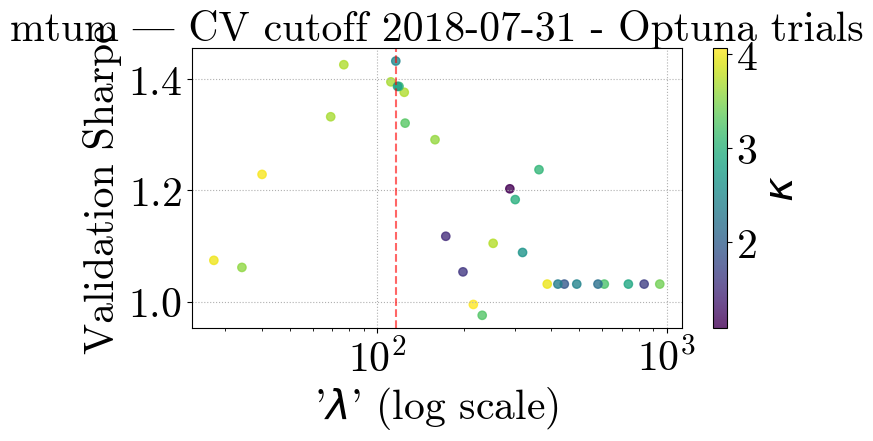

[I 2025-05-06 02:06:46,022] A new study created in memory with name: no-name-a73ee2b7-6a35-4c62-b5d3-ab6a3f301a1a
[I 2025-05-06 02:06:51,538] Trial 0 finished with value: 0.4571548450600461 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4571548450600461.
[I 2025-05-06 02:06:55,440] Trial 1 finished with value: 0.4571548450600461 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4571548450600461.
[I 2025-05-06 02:07:04,075] Trial 2 finished with value: 0.6010937632467596 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.6010937632467596.
[I 2025-05-06 02:07:16,906] Trial 3 finished with value: 0.04726652506332581 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.6010937632467596.
[I 2025-05-06 02:07:20,689] Trial 4 finished with value: 0.4571548450600461 and paramet

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=0.8852


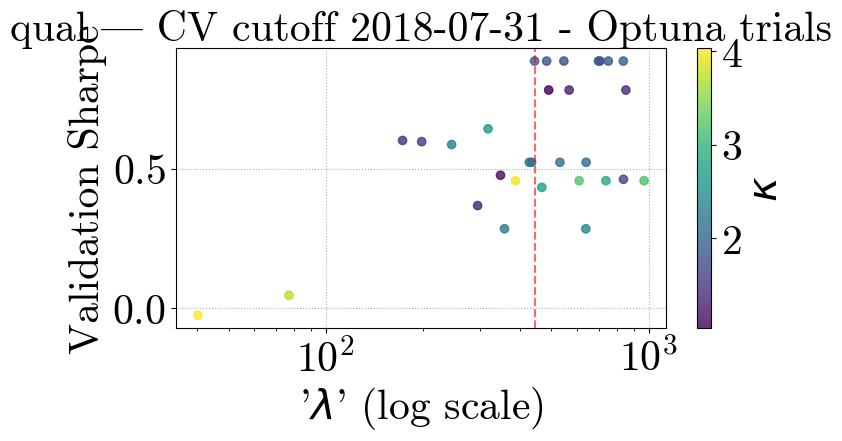

[I 2025-05-06 02:10:16,979] A new study created in memory with name: no-name-bcd9eb59-9dc5-4695-a0f2-366eaee3c66a
[I 2025-05-06 02:10:22,404] Trial 0 finished with value: -0.3588271087327532 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3588271087327532.
[I 2025-05-06 02:10:25,656] Trial 1 finished with value: -0.3588271087327532 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.3588271087327532.
[I 2025-05-06 02:10:32,935] Trial 2 finished with value: -0.04894504262075884 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.04894504262075884.
[I 2025-05-06 02:10:45,336] Trial 3 finished with value: 0.13664835544602286 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.13664835544602286.
[I 2025-05-06 02:10:49,705] Trial 4 finished with value: -0.3588271087327532 a

Optuna best λ=884.6007, κ=1.340901796564335, Sharpe=0.2878


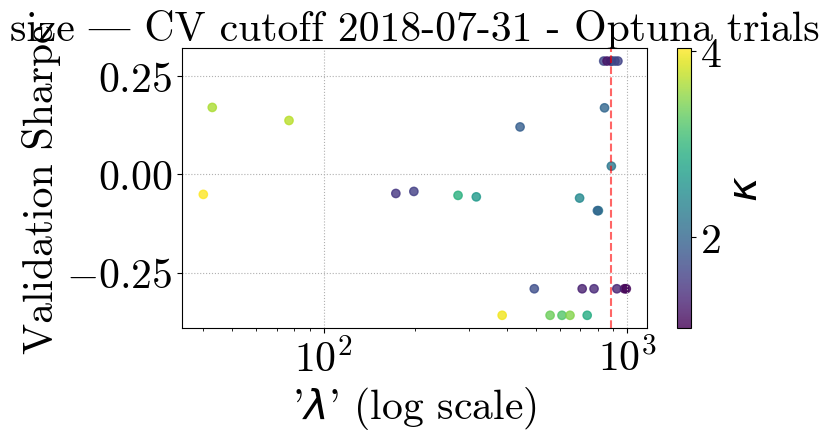

[I 2025-05-06 02:12:29,304] A new study created in memory with name: no-name-d1f37b12-66ed-4ded-8d82-2e8f48044fbd
[I 2025-05-06 02:12:35,438] Trial 0 finished with value: -0.7053394268539317 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7053394268539317.
[I 2025-05-06 02:12:40,554] Trial 1 finished with value: -0.028570462415744482 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.028570462415744482.
[I 2025-05-06 02:12:48,190] Trial 2 finished with value: -0.2503538823709419 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.028570462415744482.
[I 2025-05-06 02:13:00,268] Trial 3 finished with value: -0.6775553062653566 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.028570462415744482.
[I 2025-05-06 02:13:05,439] Trial 4 finished with value: -0.028570462415

Optuna best λ=879.9806, κ=1.8744413899888643, Sharpe=0.0309


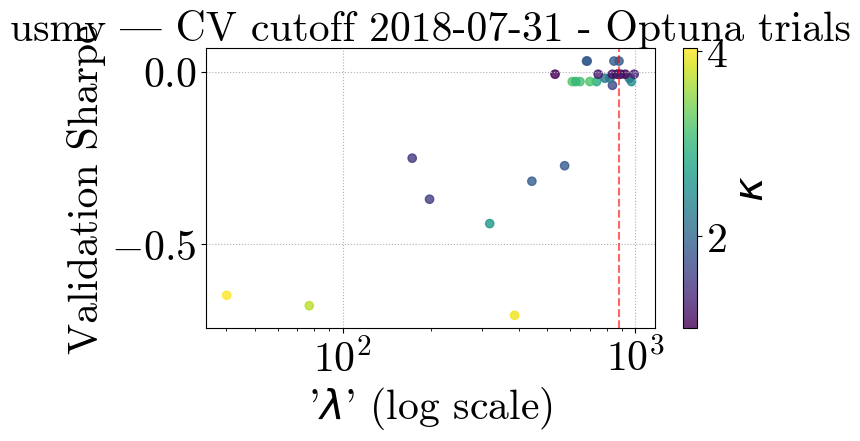

[I 2025-05-06 02:15:03,936] A new study created in memory with name: no-name-7e24563e-b757-43ff-a3a9-15e168911f7e
[I 2025-05-06 02:15:09,872] Trial 0 finished with value: 0.4198745874978862 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4198745874978862.
[I 2025-05-06 02:15:14,270] Trial 1 finished with value: 0.612415056216809 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.612415056216809.
[I 2025-05-06 02:15:20,472] Trial 2 finished with value: 0.6804169354206713 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.6804169354206713.
[I 2025-05-06 02:15:26,773] Trial 3 finished with value: 0.3212975482843222 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.6804169354206713.
[I 2025-05-06 02:15:30,587] Trial 4 finished with value: 0.7172076027535118 and parameters

Optuna best λ=473.0977, κ=3.3456787036687925, Sharpe=0.8782


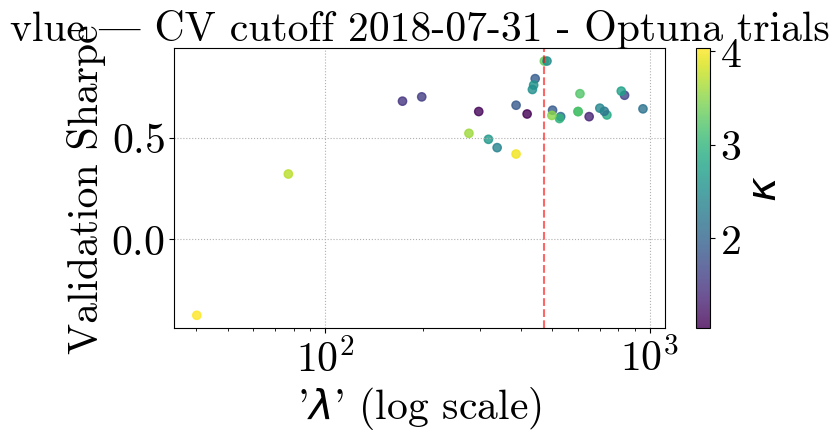

[I 2025-05-06 02:17:38,771] A new study created in memory with name: no-name-cf934783-aa7a-441b-bead-15a70cb08aa8
[I 2025-05-06 02:17:43,434] Trial 0 finished with value: 0.3604749017098078 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3604749017098078.
[I 2025-05-06 02:17:47,866] Trial 1 finished with value: -0.0022340452325522123 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3604749017098078.
[I 2025-05-06 02:17:55,951] Trial 2 finished with value: 0.41292336228961873 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.41292336228961873.
[I 2025-05-06 02:18:05,354] Trial 3 finished with value: 0.6775807649155139 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.6775807649155139.
[I 2025-05-06 02:18:09,815] Trial 4 finished with value: -0.040399572982249166 and

Optuna best λ=34.2366, κ=3.561963338490747, Sharpe=0.7152


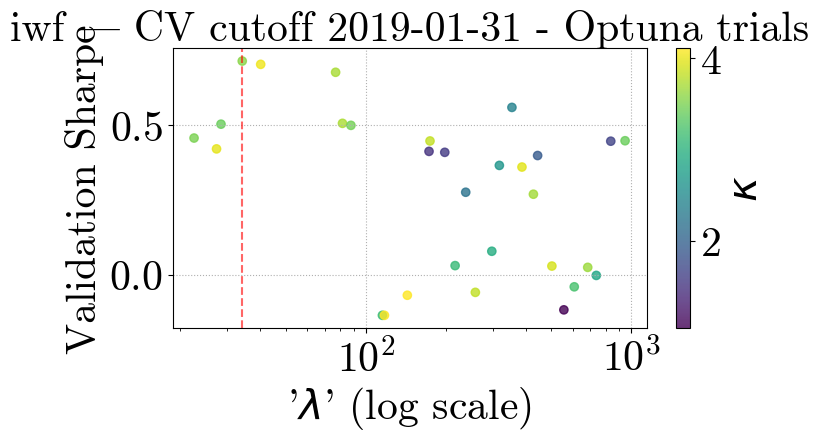

[I 2025-05-06 02:22:06,402] A new study created in memory with name: no-name-033ecaa1-51ab-4e17-94db-30d4fd98f2a4
[I 2025-05-06 02:22:10,933] Trial 0 finished with value: 0.6211871591547123 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6211871591547123.
[I 2025-05-06 02:22:14,848] Trial 1 finished with value: 0.9128177078928048 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.9128177078928048.
[I 2025-05-06 02:22:21,769] Trial 2 finished with value: 0.9276264014848854 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9276264014848854.
[I 2025-05-06 02:22:33,300] Trial 3 finished with value: 1.1737139122237348 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.1737139122237348.
[I 2025-05-06 02:22:37,699] Trial 4 finished with value: 0.9289950865919608 and paramete

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=1.2066


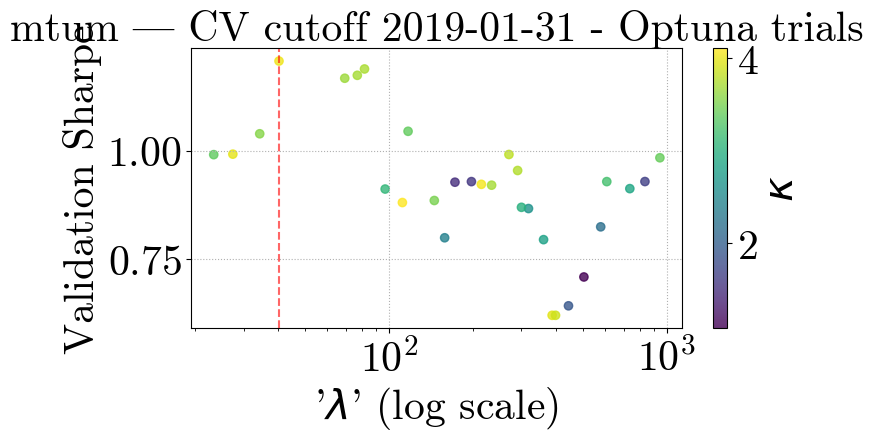

[I 2025-05-06 02:25:55,567] A new study created in memory with name: no-name-c4f28641-a9ac-44ec-a1ad-9a168e012776
[I 2025-05-06 02:26:00,098] Trial 0 finished with value: -0.022632958063107445 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.022632958063107445.
[I 2025-05-06 02:26:05,114] Trial 1 finished with value: -0.09028027063562459 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.022632958063107445.
[I 2025-05-06 02:26:14,029] Trial 2 finished with value: -0.12730091126265053 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.022632958063107445.
[I 2025-05-06 02:26:23,133] Trial 3 finished with value: -0.13680572359690935 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.022632958063107445.
[I 2025-05-06 02:26:27,630] Trial 4 finished with value: -0.0253880

Optuna best λ=244.1853, κ=2.0907862987092907, Sharpe=0.2434


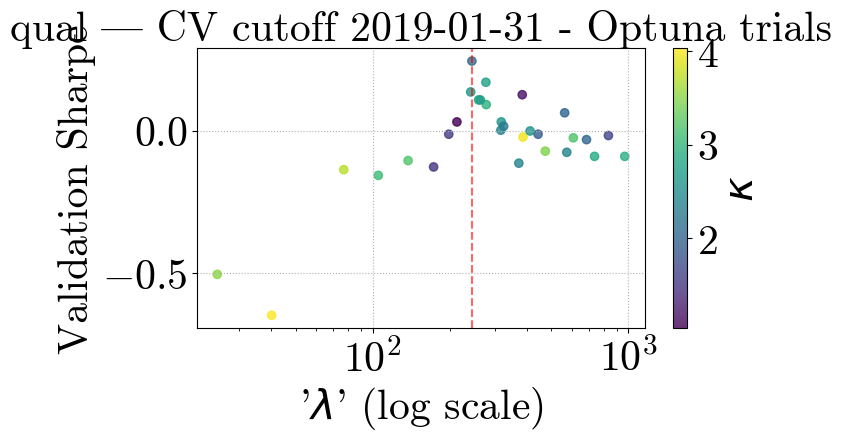

[I 2025-05-06 02:30:19,231] A new study created in memory with name: no-name-98aa1d69-684a-43c7-bbd6-9ec2ab49f650
[I 2025-05-06 02:30:24,799] Trial 0 finished with value: 0.04767709352532106 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.04767709352532106.
[I 2025-05-06 02:30:28,366] Trial 1 finished with value: 0.04767709352532106 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.04767709352532106.
[I 2025-05-06 02:30:36,493] Trial 2 finished with value: -0.31040896158882614 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.04767709352532106.
[I 2025-05-06 02:30:51,164] Trial 3 finished with value: 0.1448109050125161 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1448109050125161.
[I 2025-05-06 02:30:54,747] Trial 4 finished with value: 0.04767709352532106 and 

Optuna best λ=21.5052, κ=2.796322129897775, Sharpe=0.3464


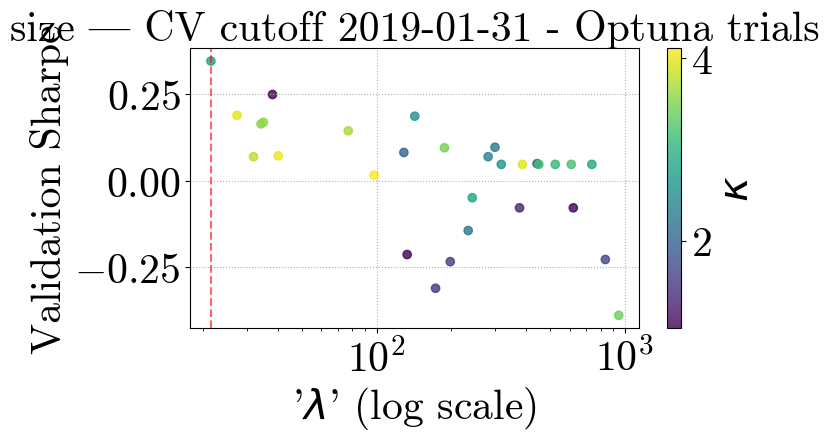

[I 2025-05-06 02:34:24,579] A new study created in memory with name: no-name-c798ed4a-e2e3-40a9-ad7c-0a485680492d
[I 2025-05-06 02:34:29,262] Trial 0 finished with value: -0.591002167553701 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.591002167553701.
[I 2025-05-06 02:34:34,444] Trial 1 finished with value: 0.012363836046209265 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.012363836046209265.
[I 2025-05-06 02:34:40,911] Trial 2 finished with value: -0.40302387729842815 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.012363836046209265.
[I 2025-05-06 02:34:56,861] Trial 3 finished with value: -0.6490459049756085 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.012363836046209265.
[I 2025-05-06 02:35:01,329] Trial 4 finished with value: 0.012363836046209265

Optuna best λ=782.1668, κ=1.7963601902007889, Sharpe=0.0690


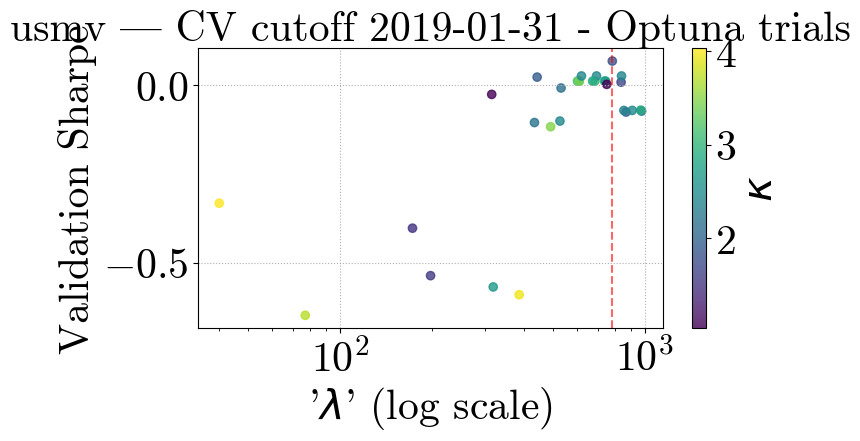

[I 2025-05-06 02:37:19,873] A new study created in memory with name: no-name-32ddc82a-38f8-4ab8-9202-92adb62c1891
[I 2025-05-06 02:37:29,157] Trial 0 finished with value: 0.29563263654195515 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.29563263654195515.
[I 2025-05-06 02:37:33,877] Trial 1 finished with value: -0.06501552784558676 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.29563263654195515.
[I 2025-05-06 02:37:40,606] Trial 2 finished with value: 0.5047980907680826 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.5047980907680826.
[I 2025-05-06 02:37:50,425] Trial 3 finished with value: 0.4392385187781206 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.5047980907680826.
[I 2025-05-06 02:37:55,888] Trial 4 finished with value: 0.04148784103758909 and pa

Optuna best λ=122.8265, κ=2.441016049888713, Sharpe=0.8840


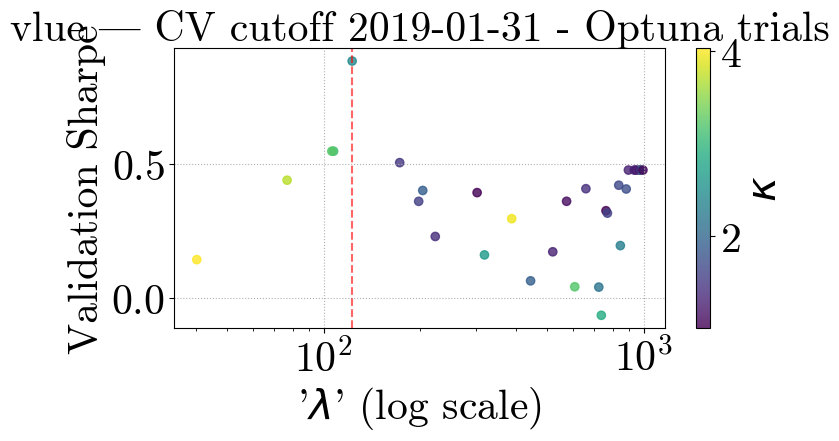

[I 2025-05-06 02:39:45,854] A new study created in memory with name: no-name-d43ff9f8-117b-4902-ba40-0c94e07d3a47
[I 2025-05-06 02:39:51,686] Trial 0 finished with value: 0.6680968736129306 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6680968736129306.
[I 2025-05-06 02:39:57,592] Trial 1 finished with value: 0.45747823813210986 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6680968736129306.
[I 2025-05-06 02:40:09,704] Trial 2 finished with value: 0.7776269179403641 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.7776269179403641.
[I 2025-05-06 02:40:22,790] Trial 3 finished with value: 1.0388162479351328 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.0388162479351328.
[I 2025-05-06 02:40:28,274] Trial 4 finished with value: 0.25885968770096696 and parame

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=1.0388


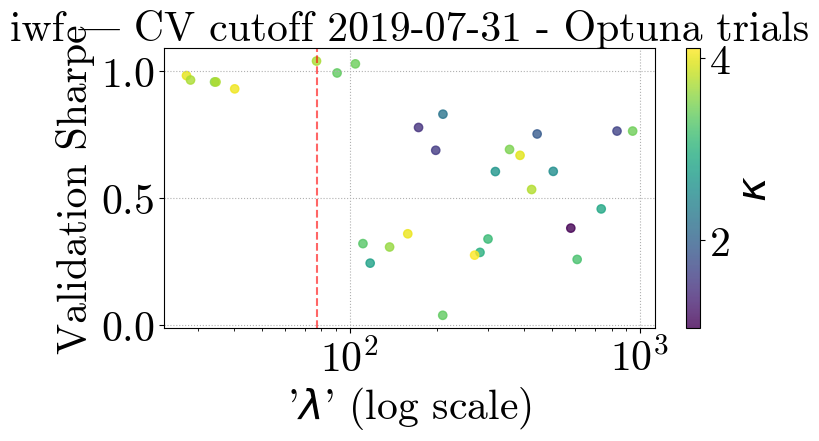

[I 2025-05-06 02:44:42,954] A new study created in memory with name: no-name-1ec0c039-67de-403d-8773-804fc14494e4
[I 2025-05-06 02:44:47,754] Trial 0 finished with value: 0.8342008060143669 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8342008060143669.
[I 2025-05-06 02:44:51,985] Trial 1 finished with value: 1.1663837838816942 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.1663837838816942.
[I 2025-05-06 02:44:57,571] Trial 2 finished with value: 1.1290279390055902 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.1663837838816942.
[I 2025-05-06 02:45:10,703] Trial 3 finished with value: 1.314555077154242 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.314555077154242.
[I 2025-05-06 02:45:15,021] Trial 4 finished with value: 1.1278124994288272 and parameters

Optuna best λ=81.6520, κ=3.722788413455649, Sharpe=1.4021


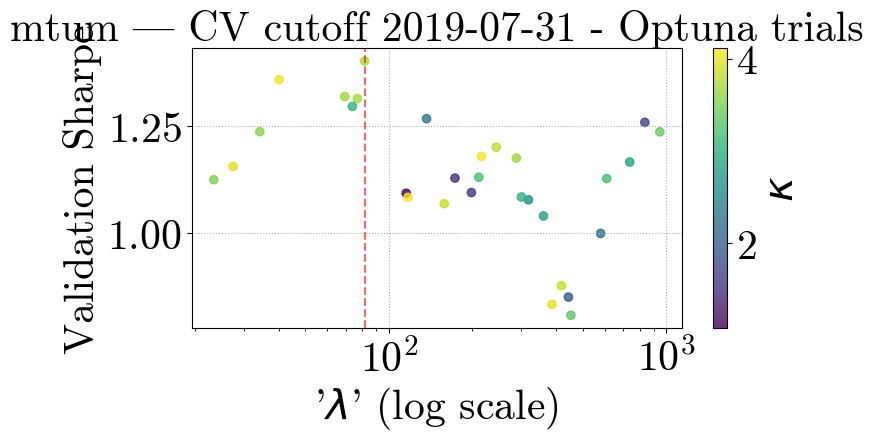

[I 2025-05-06 02:49:10,105] A new study created in memory with name: no-name-934c9a74-e0be-48db-bf0a-2a1828f68f65
[I 2025-05-06 02:49:16,581] Trial 0 finished with value: 0.6641578578269198 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6641578578269198.
[I 2025-05-06 02:49:22,671] Trial 1 finished with value: 0.5455986127099819 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6641578578269198.
[I 2025-05-06 02:49:31,052] Trial 2 finished with value: 0.6170963692288097 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6641578578269198.
[I 2025-05-06 02:49:45,588] Trial 3 finished with value: -0.32881016555537124 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6641578578269198.
[I 2025-05-06 02:49:51,118] Trial 4 finished with value: 0.5120390654014046 and parame

Optuna best λ=530.2598, κ=1.062494947927091, Sharpe=0.8388


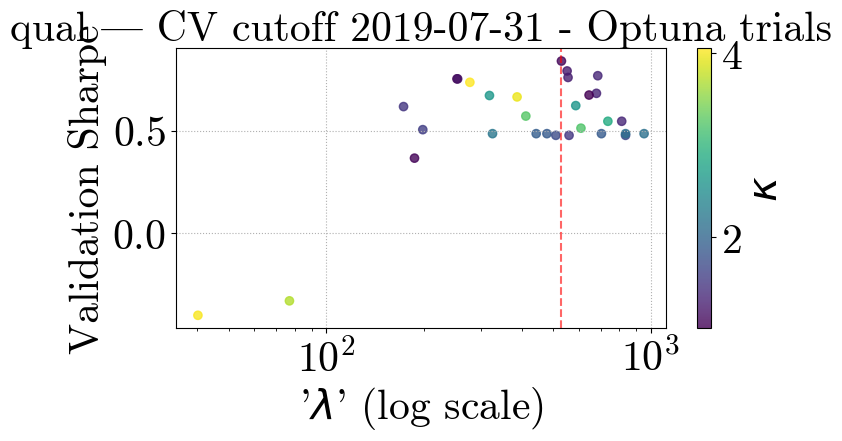

[I 2025-05-06 02:53:10,003] A new study created in memory with name: no-name-88b51d19-fa1a-4835-9538-db2353978f25
[I 2025-05-06 02:53:15,218] Trial 0 finished with value: 0.3540931365306977 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3540931365306977.
[I 2025-05-06 02:53:20,053] Trial 1 finished with value: -0.22887858663141517 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3540931365306977.
[I 2025-05-06 02:53:26,534] Trial 2 finished with value: -0.3439729113469578 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3540931365306977.
[I 2025-05-06 02:53:41,947] Trial 3 finished with value: -0.25775193236063326 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3540931365306977.
[I 2025-05-06 02:53:46,498] Trial 4 finished with value: 0.3540931365306977 and par

Optuna best λ=680.1324, κ=2.81703364487058, Sharpe=0.3541


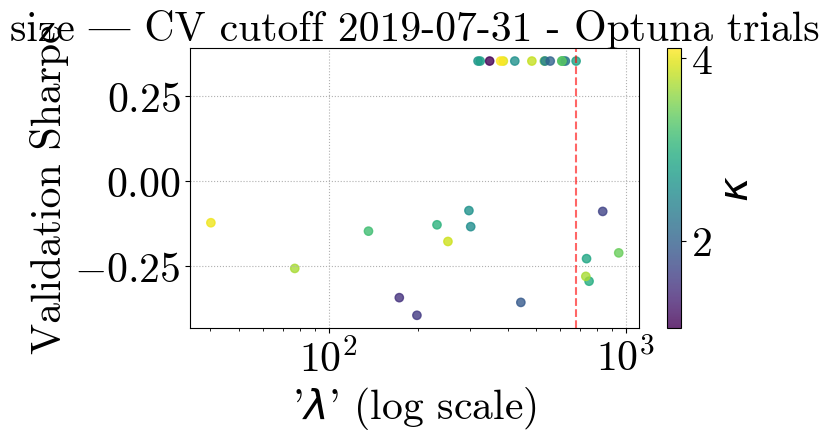

[I 2025-05-06 02:56:15,996] A new study created in memory with name: no-name-10e0b62b-210c-4b92-89a5-ce6af4467fcc
[I 2025-05-06 02:56:21,348] Trial 0 finished with value: -0.6945224820765895 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6945224820765895.
[I 2025-05-06 02:56:24,563] Trial 1 finished with value: -0.04005856304398727 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.04005856304398727.
[I 2025-05-06 02:56:30,985] Trial 2 finished with value: -0.44217534811795295 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.04005856304398727.
[I 2025-05-06 02:56:43,898] Trial 3 finished with value: -0.7998227410056796 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.04005856304398727.
[I 2025-05-06 02:56:48,582] Trial 4 finished with value: -0.558133868052069

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.2027


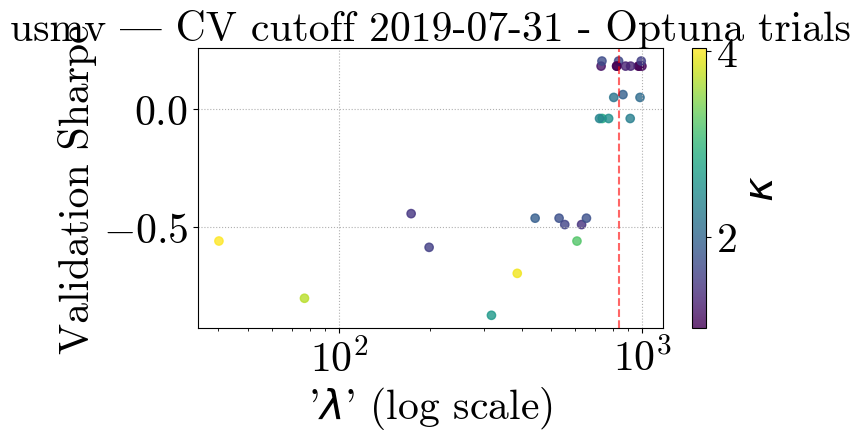

[I 2025-05-06 02:58:38,798] A new study created in memory with name: no-name-31358817-8f7a-4bd5-a1da-566ece985237
[I 2025-05-06 02:58:46,997] Trial 0 finished with value: 0.4129791252513198 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4129791252513198.
[I 2025-05-06 02:58:52,847] Trial 1 finished with value: 0.3492743942484807 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4129791252513198.
[I 2025-05-06 02:58:59,617] Trial 2 finished with value: 0.6656480825978314 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.6656480825978314.
[I 2025-05-06 02:59:08,027] Trial 3 finished with value: 0.6012207882357367 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.6656480825978314.
[I 2025-05-06 02:59:12,893] Trial 4 finished with value: 0.6011691531469331 and paramete

Optuna best λ=140.2450, κ=2.5176991357040883, Sharpe=0.8688


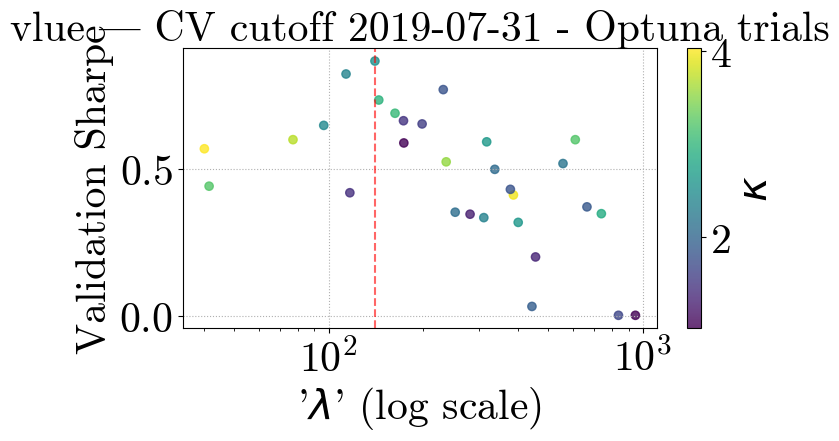

[I 2025-05-06 03:01:57,509] A new study created in memory with name: no-name-c90ced91-7bda-443c-bd70-d658cfbb8159
[I 2025-05-06 03:02:02,132] Trial 0 finished with value: 0.7150413477289811 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7150413477289811.
[I 2025-05-06 03:02:05,127] Trial 1 finished with value: 0.3762315356621103 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7150413477289811.
[I 2025-05-06 03:02:16,994] Trial 2 finished with value: 0.6560002373892923 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.7150413477289811.
[I 2025-05-06 03:02:28,928] Trial 3 finished with value: 1.2708503620088398 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.2708503620088398.
[I 2025-05-06 03:02:32,614] Trial 4 finished with value: 0.3968601082829526 and paramete

Optuna best λ=80.6479, κ=3.979848793475017, Sharpe=1.3253


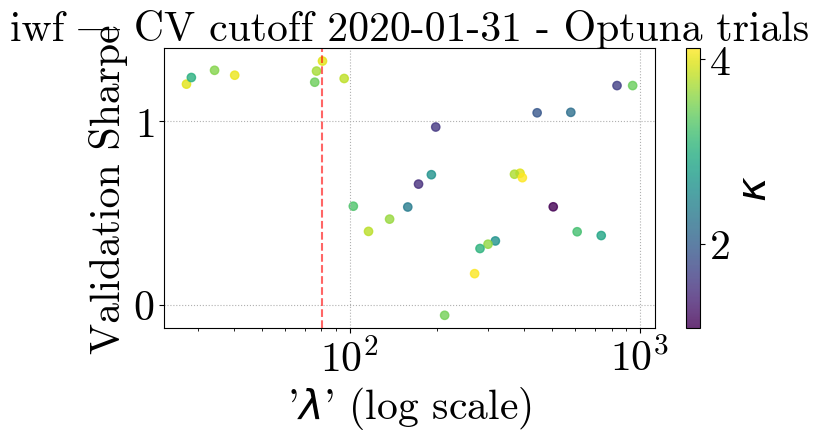

[I 2025-05-06 03:06:23,664] A new study created in memory with name: no-name-aef5058e-1ffa-4aee-96cf-af5b405baa7c
[I 2025-05-06 03:06:30,946] Trial 0 finished with value: 1.104504415890252 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.104504415890252.
[I 2025-05-06 03:06:34,995] Trial 1 finished with value: 1.45500292602094 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.45500292602094.
[I 2025-05-06 03:06:43,126] Trial 2 finished with value: 1.4591445866442052 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.4591445866442052.
[I 2025-05-06 03:06:55,926] Trial 3 finished with value: 1.388938197878813 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.4591445866442052.
[I 2025-05-06 03:07:00,375] Trial 4 finished with value: 1.41170752172693 and parameters: {'lam

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.5506


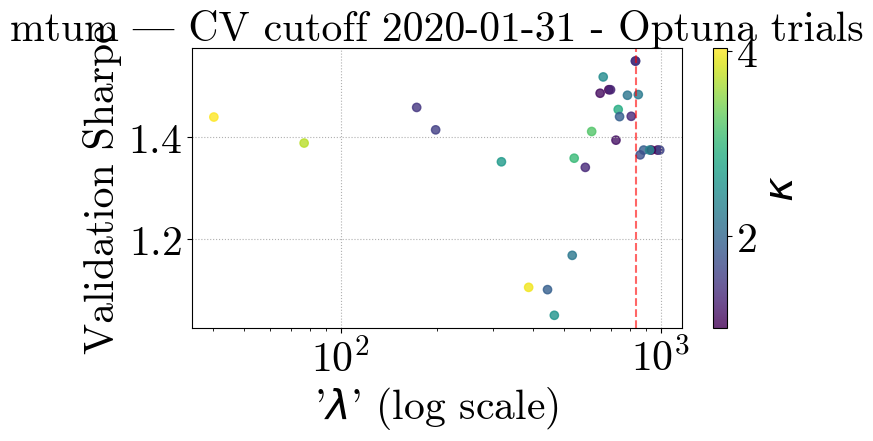

[I 2025-05-06 03:09:16,890] A new study created in memory with name: no-name-a6dce8f3-104c-4e3e-9622-91970556282d
[I 2025-05-06 03:09:24,858] Trial 0 finished with value: 0.871097183497225 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.871097183497225.
[I 2025-05-06 03:09:30,706] Trial 1 finished with value: 1.0616314001148444 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.0616314001148444.
[I 2025-05-06 03:09:37,058] Trial 2 finished with value: 0.2960174508573737 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.0616314001148444.
[I 2025-05-06 03:09:52,827] Trial 3 finished with value: -0.39424850271553924 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.0616314001148444.
[I 2025-05-06 03:09:58,840] Trial 4 finished with value: 0.7472282051440775 and paramete

Optuna best λ=320.8988, κ=1.3886277010418204, Sharpe=1.2184


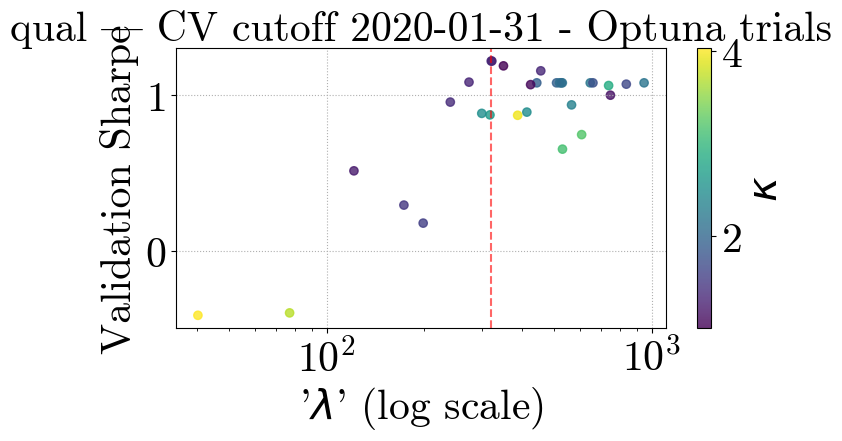

[I 2025-05-06 03:13:55,508] A new study created in memory with name: no-name-9620dfd0-c485-4a01-bc7b-21c6d6c5ee9d
[I 2025-05-06 03:13:59,542] Trial 0 finished with value: 0.34991157376333953 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.34991157376333953.
[I 2025-05-06 03:14:05,837] Trial 1 finished with value: 0.34991157376333953 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.34991157376333953.
[I 2025-05-06 03:14:12,770] Trial 2 finished with value: -0.3223184868856292 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.34991157376333953.
[I 2025-05-06 03:14:27,625] Trial 3 finished with value: -0.13565257775683418 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.34991157376333953.
[I 2025-05-06 03:14:31,708] Trial 4 finished with value: 0.34991157376333953 an

Optuna best λ=251.1931, κ=3.132907707315758, Sharpe=0.4861


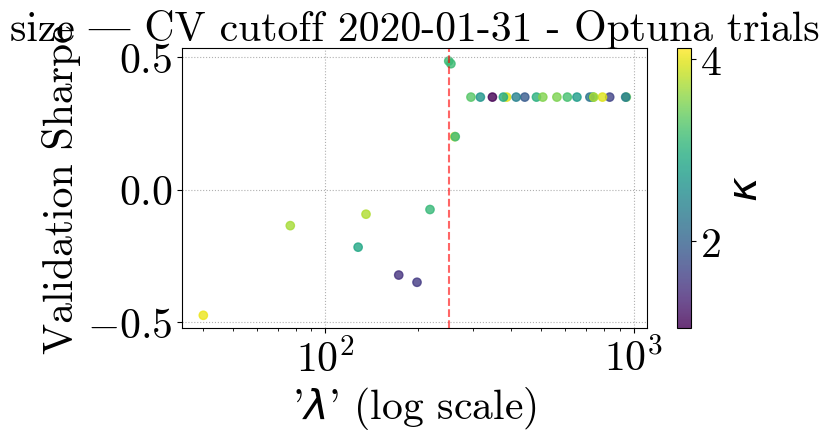

[I 2025-05-06 03:17:18,391] A new study created in memory with name: no-name-fd17a1af-45f4-4a98-9264-b5fcba086fe2
[I 2025-05-06 03:17:23,234] Trial 0 finished with value: -0.864847823590431 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.864847823590431.
[I 2025-05-06 03:17:26,986] Trial 1 finished with value: 0.5325092518820823 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5325092518820823.
[I 2025-05-06 03:17:32,315] Trial 2 finished with value: -0.00875034226671797 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5325092518820823.
[I 2025-05-06 03:17:44,939] Trial 3 finished with value: -0.4602387753416615 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5325092518820823.
[I 2025-05-06 03:17:48,388] Trial 4 finished with value: 0.5325092518820823 and param

Optuna best λ=905.2397, κ=2.3795644956684163, Sharpe=0.5325


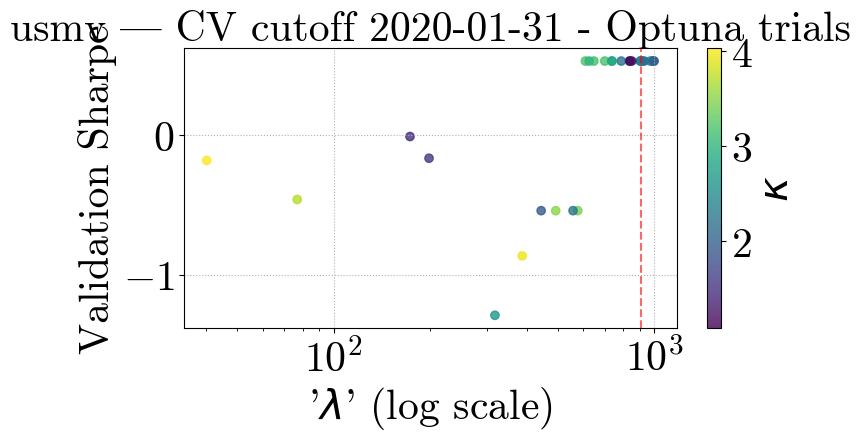

[I 2025-05-06 03:20:10,489] A new study created in memory with name: no-name-ed8342eb-db7d-4da6-ab79-36a82e96701a
[I 2025-05-06 03:20:18,451] Trial 0 finished with value: -0.3927954843817614 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3927954843817614.
[I 2025-05-06 03:20:25,004] Trial 1 finished with value: -0.29916681629322817 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.29916681629322817.
[I 2025-05-06 03:20:32,649] Trial 2 finished with value: 0.02814851967523674 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.02814851967523674.
[I 2025-05-06 03:20:41,741] Trial 3 finished with value: -0.8451107194237193 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.02814851967523674.
[I 2025-05-06 03:20:48,769] Trial 4 finished with value: -0.7828998655286402 a

Optuna best λ=131.6339, κ=1.9545929831020619, Sharpe=0.0497


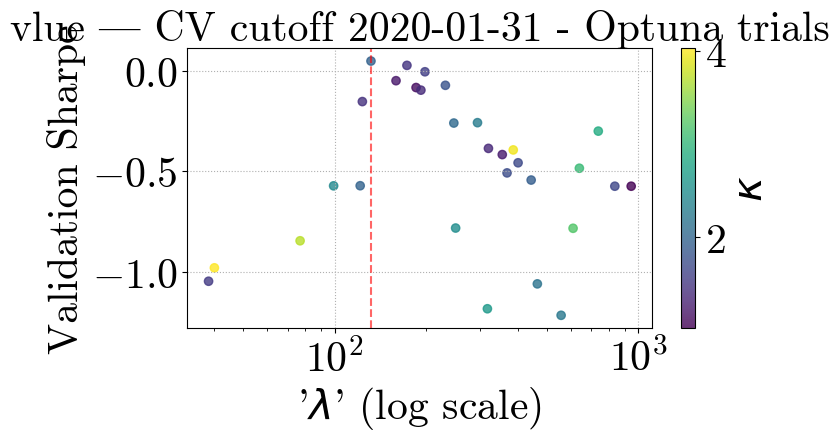

[I 2025-05-06 03:23:18,203] A new study created in memory with name: no-name-f3a184f0-0b41-4907-954f-da55c040abe0
[I 2025-05-06 03:23:24,882] Trial 0 finished with value: 0.8003974484287565 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8003974484287565.
[I 2025-05-06 03:23:30,000] Trial 1 finished with value: 1.0124753262769761 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.0124753262769761.
[I 2025-05-06 03:23:44,053] Trial 2 finished with value: 0.8757953317588772 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.0124753262769761.
[I 2025-05-06 03:23:57,654] Trial 3 finished with value: 1.2348554622409167 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.2348554622409167.
[I 2025-05-06 03:24:03,081] Trial 4 finished with value: 1.1614250626428402 and paramete

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.4344


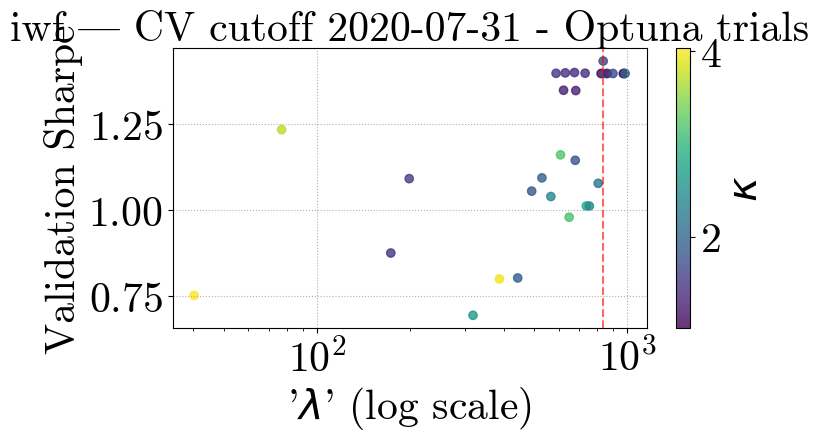

[I 2025-05-06 03:26:18,160] A new study created in memory with name: no-name-d932edb6-4fa2-43bd-9343-358f0e5aa9ba
[I 2025-05-06 03:26:23,899] Trial 0 finished with value: 0.5955822271284658 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5955822271284658.
[I 2025-05-06 03:26:28,952] Trial 1 finished with value: 1.0920984566678884 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.0920984566678884.
[I 2025-05-06 03:26:39,298] Trial 2 finished with value: 0.6460146143405717 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.0920984566678884.
[I 2025-05-06 03:26:58,152] Trial 3 finished with value: 0.763879726580024 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.0920984566678884.
[I 2025-05-06 03:27:02,400] Trial 4 finished with value: 1.0723775421204884 and parameter

Optuna best λ=658.4141, κ=1.032158511026232, Sharpe=1.1700


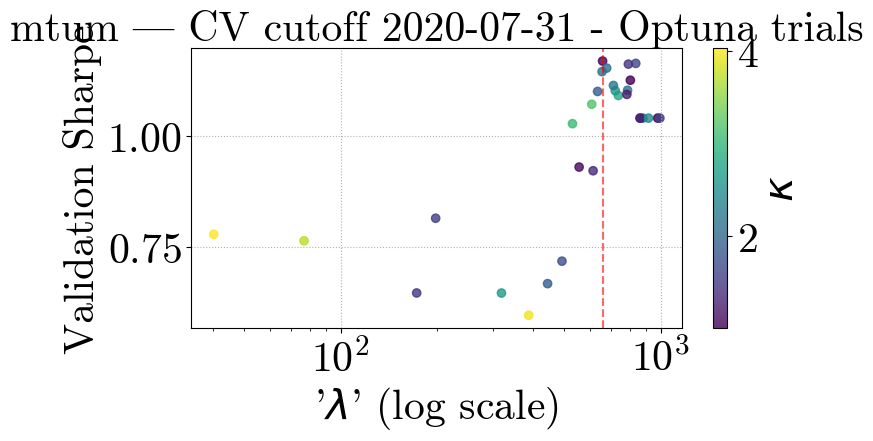

[I 2025-05-06 03:29:06,785] A new study created in memory with name: no-name-385eb4cf-bfa7-4222-948e-26dd91b506a6
[I 2025-05-06 03:29:15,195] Trial 0 finished with value: -0.06106547238545986 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.06106547238545986.
[I 2025-05-06 03:29:22,629] Trial 1 finished with value: 0.6903136504168148 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.6903136504168148.
[I 2025-05-06 03:29:31,783] Trial 2 finished with value: -0.04354977247834011 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.6903136504168148.
[I 2025-05-06 03:29:46,199] Trial 3 finished with value: 0.07890223274896356 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.6903136504168148.
[I 2025-05-06 03:29:54,642] Trial 4 finished with value: 0.5472396194798338 and p

Optuna best λ=676.6562, κ=1.1744763201195974, Sharpe=0.7297


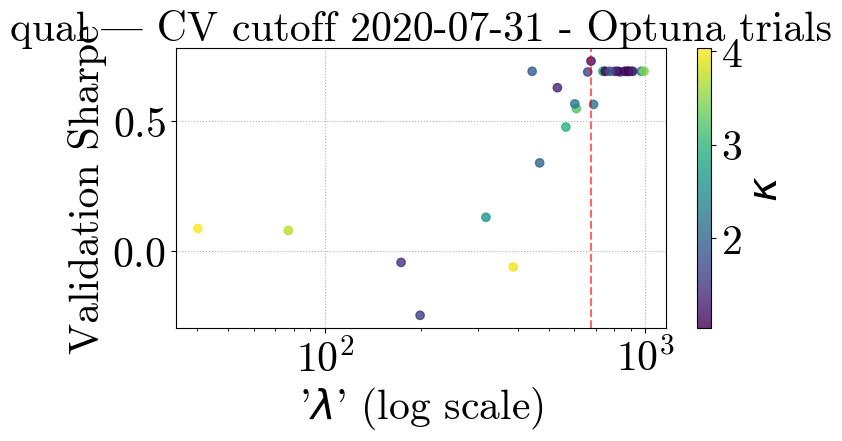

[I 2025-05-06 03:32:41,517] A new study created in memory with name: no-name-6ce89d44-498b-43b2-903c-c18d14d525b4
[I 2025-05-06 03:32:50,015] Trial 0 finished with value: 0.2458962037873028 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2458962037873028.
[I 2025-05-06 03:32:58,232] Trial 1 finished with value: 0.17550908314694905 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.2458962037873028.
[I 2025-05-06 03:33:07,145] Trial 2 finished with value: -0.2521398357857353 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.2458962037873028.
[I 2025-05-06 03:33:18,646] Trial 3 finished with value: -0.2739355912695628 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.2458962037873028.
[I 2025-05-06 03:33:25,248] Trial 4 finished with value: 0.3453369875727139 and param

Optuna best λ=948.0226, κ=2.1745901556389544, Sharpe=0.6650


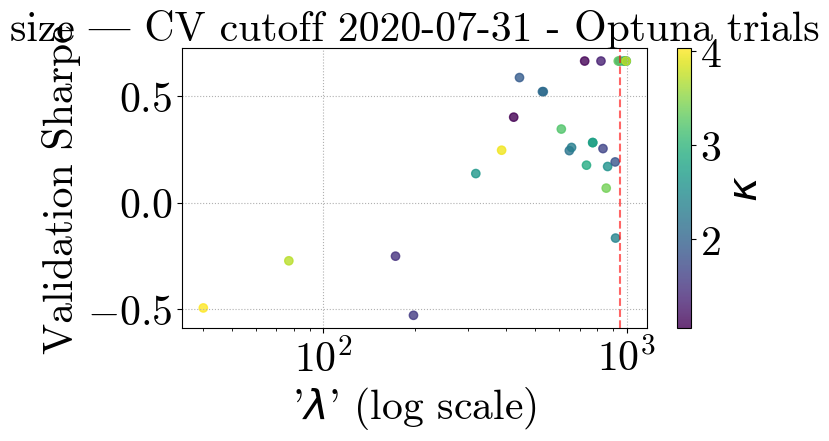

[I 2025-05-06 03:35:10,994] A new study created in memory with name: no-name-2df7ebcc-0e76-427d-8f5d-a4ae90da2197
[I 2025-05-06 03:35:15,213] Trial 0 finished with value: -1.2716465083091248 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.2716465083091248.
[I 2025-05-06 03:35:19,713] Trial 1 finished with value: 0.01356032652995973 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.01356032652995973.
[I 2025-05-06 03:35:27,462] Trial 2 finished with value: -0.7020261649408698 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.01356032652995973.
[I 2025-05-06 03:35:40,131] Trial 3 finished with value: -1.165975692792512 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.01356032652995973.
[I 2025-05-06 03:35:45,268] Trial 4 finished with value: 0.01356032652995973 and 

Optuna best λ=491.6627, κ=1.3004390574945772, Sharpe=0.0136


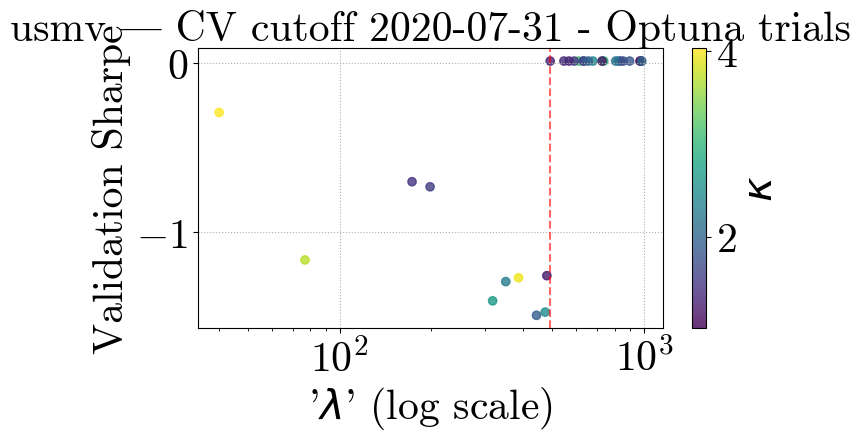

[I 2025-05-06 03:37:43,912] A new study created in memory with name: no-name-64ae9577-3638-4159-8de0-3e6bcb17aecf
[I 2025-05-06 03:37:52,462] Trial 0 finished with value: 0.016800346594650805 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.016800346594650805.
[I 2025-05-06 03:37:57,312] Trial 1 finished with value: -0.5450595701308543 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.016800346594650805.
[I 2025-05-06 03:38:04,891] Trial 2 finished with value: -0.40111792089873327 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.016800346594650805.
[I 2025-05-06 03:38:13,177] Trial 3 finished with value: -0.7251475769669796 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.016800346594650805.
[I 2025-05-06 03:38:17,910] Trial 4 finished with value: -1.11078971928539

Optuna best λ=396.9335, κ=4.097948080441039, Sharpe=0.1522


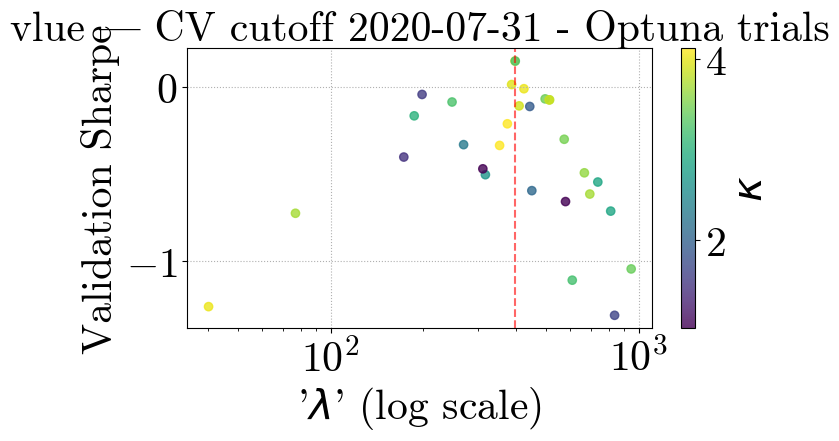

[I 2025-05-06 03:40:50,211] A new study created in memory with name: no-name-c389f5e2-9ecd-4bc1-bb04-29bb6f27aeb4
[I 2025-05-06 03:40:56,961] Trial 0 finished with value: 0.8903515944706217 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8903515944706217.
[I 2025-05-06 03:41:01,025] Trial 1 finished with value: 0.8790992555084858 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.8903515944706217.
[I 2025-05-06 03:41:06,406] Trial 2 finished with value: 0.6991227834375632 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.8903515944706217.
[I 2025-05-06 03:41:17,894] Trial 3 finished with value: 0.5147894225316189 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.8903515944706217.
[I 2025-05-06 03:41:21,495] Trial 4 finished with value: 0.961988666501416 and parameter

Optuna best λ=540.3551, κ=1.2132158890064817, Sharpe=1.0707


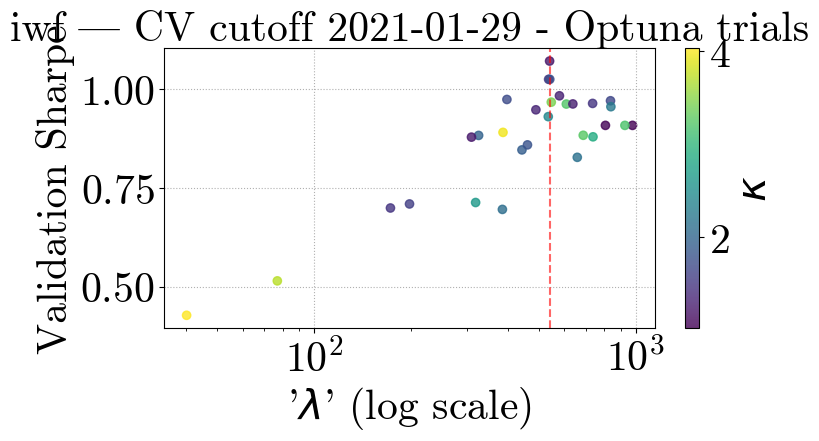

[I 2025-05-06 03:43:21,122] A new study created in memory with name: no-name-3042b19b-a204-4649-a8aa-7fae9fdac01c
[I 2025-05-06 03:43:26,123] Trial 0 finished with value: 0.2827453300286592 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2827453300286592.
[I 2025-05-06 03:43:30,311] Trial 1 finished with value: 0.49097092747368704 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.49097092747368704.
[I 2025-05-06 03:43:38,656] Trial 2 finished with value: 0.16622666916341075 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.49097092747368704.
[I 2025-05-06 03:43:53,074] Trial 3 finished with value: 0.3948686434776225 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.49097092747368704.
[I 2025-05-06 03:43:57,694] Trial 4 finished with value: 0.4911676349220929 and par

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.6925


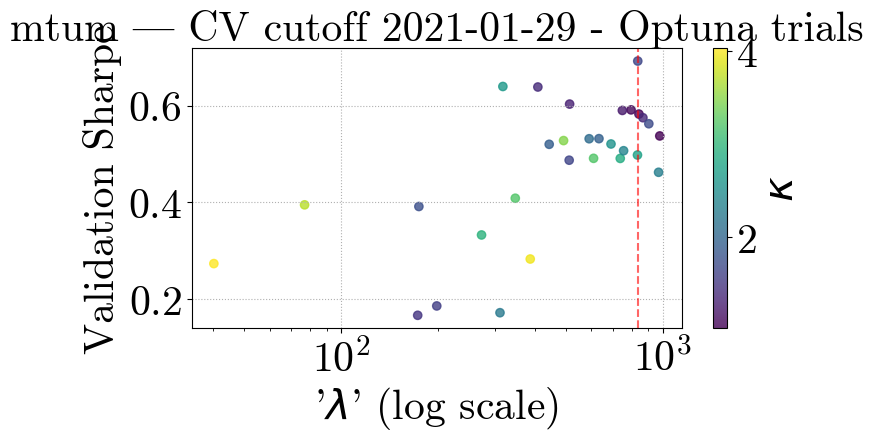

[I 2025-05-06 03:46:22,142] A new study created in memory with name: no-name-f3340538-db02-4970-83f3-de2cf8c5a32f
[I 2025-05-06 03:46:29,157] Trial 0 finished with value: -0.1767691795914812 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.1767691795914812.
[I 2025-05-06 03:46:34,006] Trial 1 finished with value: 0.08894032203406557 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.08894032203406557.
[I 2025-05-06 03:46:42,622] Trial 2 finished with value: 0.2627500629146559 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.2627500629146559.
[I 2025-05-06 03:46:55,890] Trial 3 finished with value: 0.21063243629536837 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.2627500629146559.
[I 2025-05-06 03:47:01,905] Trial 4 finished with value: 0.20821611818617541 and pa

Optuna best λ=711.9009, κ=1.0625572969162995, Sharpe=0.5886


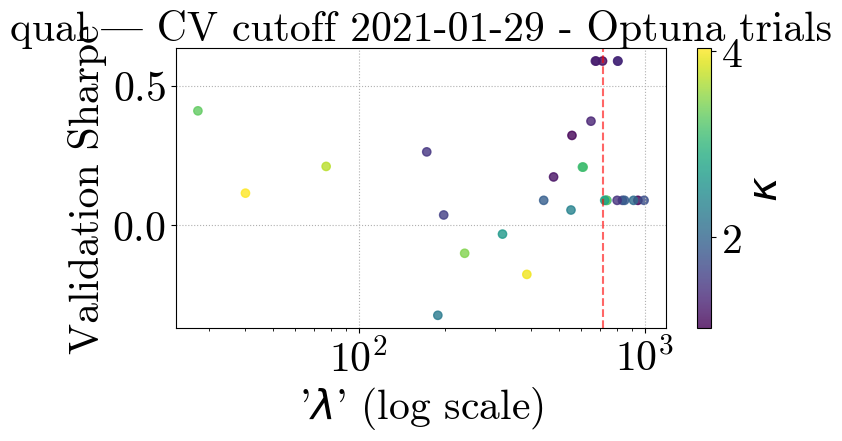

[I 2025-05-06 03:49:50,540] A new study created in memory with name: no-name-0255cfb4-d4d0-42f4-b9b2-305342b9d7a5
[I 2025-05-06 03:49:55,974] Trial 0 finished with value: 0.4607282798659351 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4607282798659351.
[I 2025-05-06 03:50:00,208] Trial 1 finished with value: 0.4446932946703152 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4607282798659351.
[I 2025-05-06 03:50:08,687] Trial 2 finished with value: 0.3108937522815485 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4607282798659351.
[I 2025-05-06 03:50:20,656] Trial 3 finished with value: -0.18577897155072468 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.4607282798659351.
[I 2025-05-06 03:50:25,471] Trial 4 finished with value: 0.5196740226758587 and parame

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=0.6216


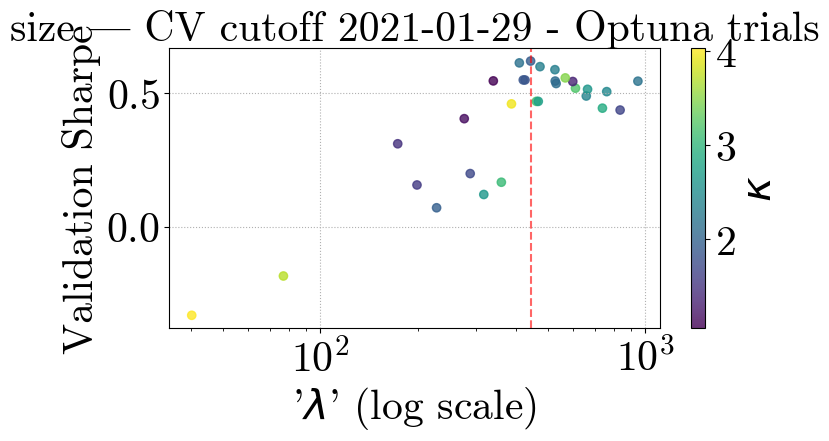

[I 2025-05-06 03:53:01,005] A new study created in memory with name: no-name-01fc4d0d-2cfa-4375-a58d-2e5307392297
[I 2025-05-06 03:53:06,737] Trial 0 finished with value: -1.7267859495562532 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.7267859495562532.
[I 2025-05-06 03:53:11,589] Trial 1 finished with value: 0.09240394867082151 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.09240394867082151.
[I 2025-05-06 03:53:16,954] Trial 2 finished with value: -0.9717908230503739 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.09240394867082151.
[I 2025-05-06 03:53:33,504] Trial 3 finished with value: -0.6981659818278172 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.09240394867082151.
[I 2025-05-06 03:53:38,385] Trial 4 finished with value: -1.3219667931860501 and

Optuna best λ=987.3911, κ=2.2256718351156524, Sharpe=0.1221


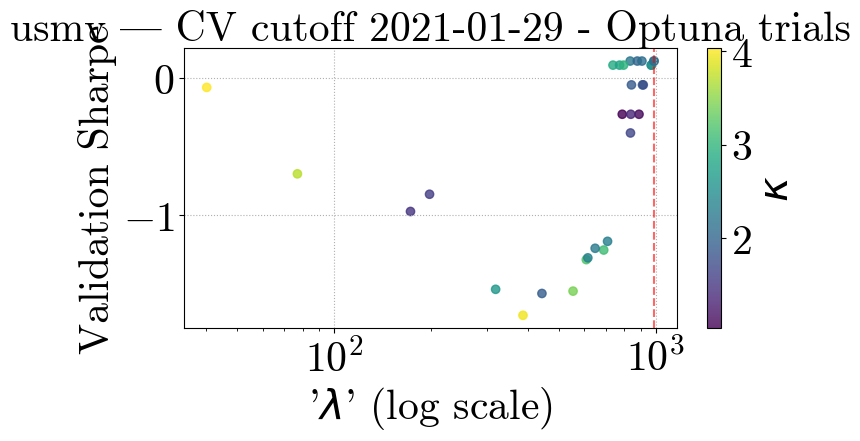

[I 2025-05-06 03:55:37,900] A new study created in memory with name: no-name-3947fdc6-8a4d-4053-a28d-0638b19680f4
[I 2025-05-06 03:55:46,953] Trial 0 finished with value: 0.01915883534976465 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.01915883534976465.
[I 2025-05-06 03:55:50,390] Trial 1 finished with value: -0.7225656344639259 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.01915883534976465.
[I 2025-05-06 03:56:00,505] Trial 2 finished with value: -0.09086534339002363 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.01915883534976465.
[I 2025-05-06 03:56:11,966] Trial 3 finished with value: -0.4536209560182685 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.01915883534976465.
[I 2025-05-06 03:56:15,504] Trial 4 finished with value: -1.3246114706134393 an

Optuna best λ=126.9184, κ=3.6641744196713146, Sharpe=0.3955


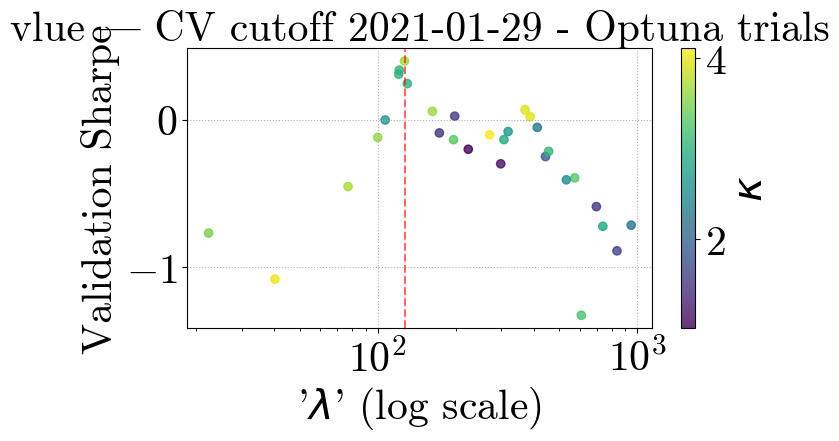

[I 2025-05-06 03:59:43,782] A new study created in memory with name: no-name-18b7a58a-496b-46fd-8a55-7f9f9a9d98f9
[I 2025-05-06 03:59:48,565] Trial 0 finished with value: 0.6954114877662045 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6954114877662045.
[I 2025-05-06 03:59:53,849] Trial 1 finished with value: 0.6529233038082267 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6954114877662045.
[I 2025-05-06 04:00:01,430] Trial 2 finished with value: 0.6509274654759442 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6954114877662045.
[I 2025-05-06 04:00:12,681] Trial 3 finished with value: 0.403241557034595 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6954114877662045.
[I 2025-05-06 04:00:17,502] Trial 4 finished with value: 0.6908512219568823 and parameter

Optuna best λ=601.2250, κ=2.0161336400150702, Sharpe=0.8425


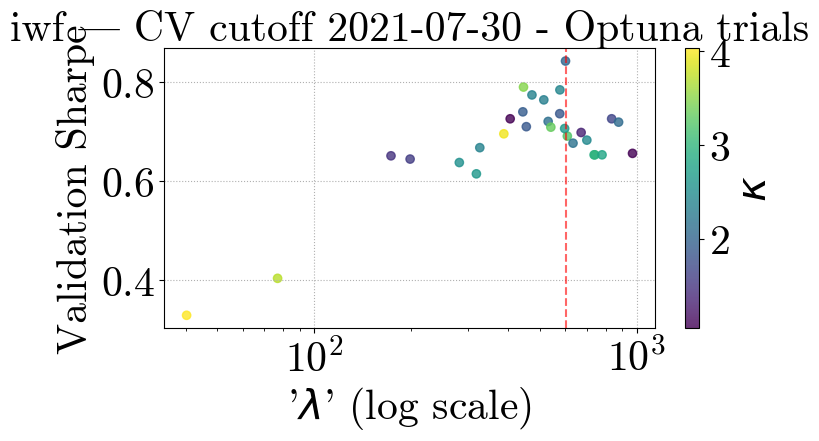

[I 2025-05-06 04:02:45,847] A new study created in memory with name: no-name-e8d17a4b-35fa-4aa0-ab2c-36a05dce6d9b
[I 2025-05-06 04:02:53,398] Trial 0 finished with value: 0.11748696030792964 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.11748696030792964.
[I 2025-05-06 04:02:57,347] Trial 1 finished with value: 0.30135339710937437 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.30135339710937437.
[I 2025-05-06 04:03:06,663] Trial 2 finished with value: 0.15787811277091027 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.30135339710937437.
[I 2025-05-06 04:03:25,914] Trial 3 finished with value: -0.3446433075129946 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.30135339710937437.
[I 2025-05-06 04:03:30,087] Trial 4 finished with value: 0.30135339710937437 and

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.3014


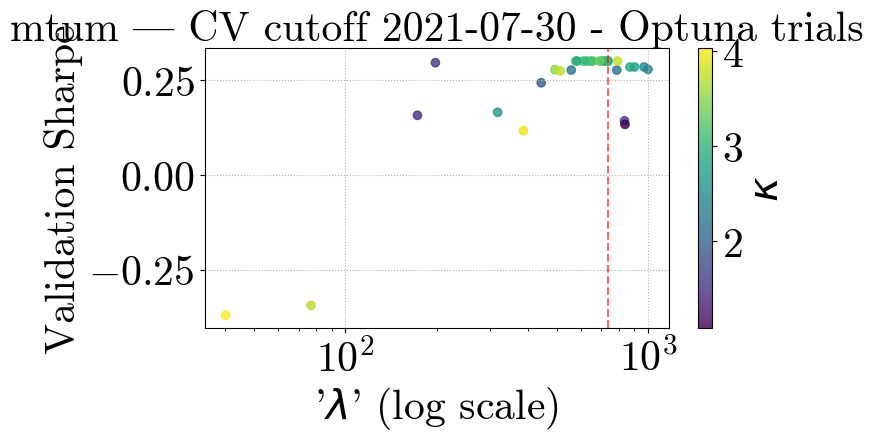

[I 2025-05-06 04:05:48,777] A new study created in memory with name: no-name-ed637cb2-53f6-4583-ba6e-58fbd0d803f1
[I 2025-05-06 04:05:58,114] Trial 0 finished with value: 0.07108495057391201 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.07108495057391201.
[I 2025-05-06 04:06:04,045] Trial 1 finished with value: 0.5196137522433947 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5196137522433947.
[I 2025-05-06 04:06:11,831] Trial 2 finished with value: 0.051248508243649876 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5196137522433947.
[I 2025-05-06 04:06:26,063] Trial 3 finished with value: 0.47476401859516437 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5196137522433947.
[I 2025-05-06 04:06:32,810] Trial 4 finished with value: 0.4980871493649657 and par

Optuna best λ=817.0744, κ=1.00403276277462, Sharpe=0.8858


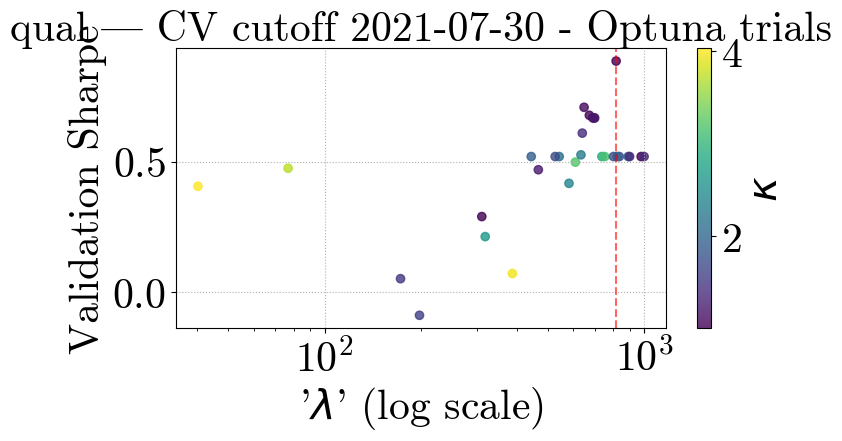

[I 2025-05-06 04:09:10,284] A new study created in memory with name: no-name-a675bcc4-ee0e-4b04-93c5-933d384a61f7
[I 2025-05-06 04:09:15,965] Trial 0 finished with value: 0.5091146196043047 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5091146196043047.
[I 2025-05-06 04:09:20,096] Trial 1 finished with value: 0.5008133635476154 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5091146196043047.
[I 2025-05-06 04:09:29,144] Trial 2 finished with value: 0.23353941990293714 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5091146196043047.
[I 2025-05-06 04:09:41,893] Trial 3 finished with value: -0.3641320419894136 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5091146196043047.
[I 2025-05-06 04:09:46,665] Trial 4 finished with value: 0.5526590557091701 and parame

Optuna best λ=600.7803, κ=3.2506760653696363, Sharpe=0.5997


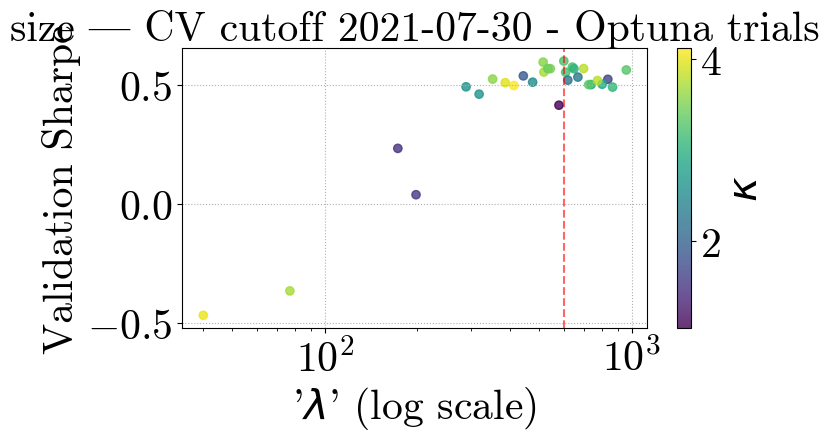

[I 2025-05-06 04:11:56,676] A new study created in memory with name: no-name-cd919dee-38b0-4709-bc3d-3a92fbe2e911
[I 2025-05-06 04:12:01,963] Trial 0 finished with value: -1.3459820843641144 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.3459820843641144.
[I 2025-05-06 04:12:06,589] Trial 1 finished with value: -0.45050900376657615 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.45050900376657615.
[I 2025-05-06 04:12:11,944] Trial 2 finished with value: -0.9629417628849937 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.45050900376657615.
[I 2025-05-06 04:12:21,130] Trial 3 finished with value: -0.6373171888596938 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.45050900376657615.
[I 2025-05-06 04:12:26,226] Trial 4 finished with value: -0.8538087357146675

Optuna best λ=822.7978, κ=2.077924366834204, Sharpe=0.3341


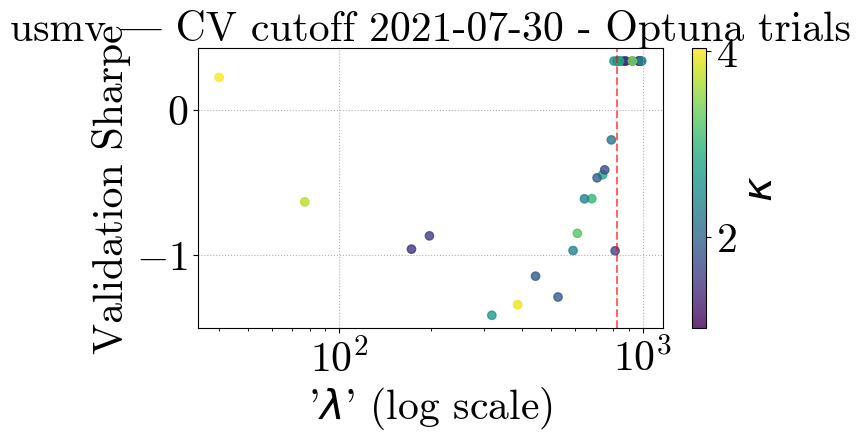

[I 2025-05-06 04:14:33,940] A new study created in memory with name: no-name-c10e8fe8-354c-4bdf-9a79-f47058e4821b
[I 2025-05-06 04:14:43,595] Trial 0 finished with value: 0.19239705823237085 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.19239705823237085.
[I 2025-05-06 04:14:47,294] Trial 1 finished with value: -0.7680623699198172 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.19239705823237085.
[I 2025-05-06 04:14:55,875] Trial 2 finished with value: 0.1714849909308702 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.19239705823237085.
[I 2025-05-06 04:15:07,011] Trial 3 finished with value: -0.33546124730196797 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.19239705823237085.
[I 2025-05-06 04:15:11,803] Trial 4 finished with value: -0.6350539325172668 and

Optuna best λ=253.7330, κ=2.0857879540957125, Sharpe=0.3671


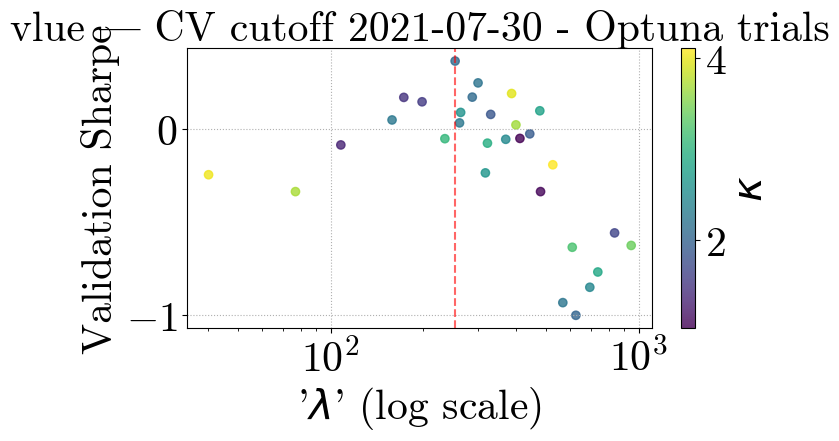

[I 2025-05-06 04:18:06,387] A new study created in memory with name: no-name-5672061c-8d10-4233-9f73-c6943585c129
[I 2025-05-06 04:18:10,810] Trial 0 finished with value: 0.6200978022192238 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6200978022192238.
[I 2025-05-06 04:18:16,125] Trial 1 finished with value: 0.5872581578470675 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6200978022192238.
[I 2025-05-06 04:18:25,709] Trial 2 finished with value: 0.5740065130661568 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6200978022192238.
[I 2025-05-06 04:18:33,676] Trial 3 finished with value: 0.21534853784280655 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6200978022192238.
[I 2025-05-06 04:18:38,908] Trial 4 finished with value: 0.5872581578470675 and paramet

Optuna best λ=574.2538, κ=2.268842850975212, Sharpe=0.6825


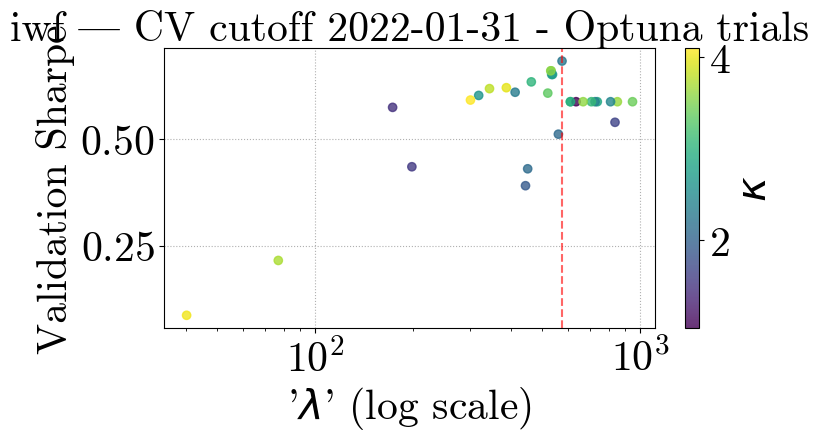

[I 2025-05-06 04:21:12,322] A new study created in memory with name: no-name-5ebbb858-0c6a-4a5c-9385-130fee49f443
[I 2025-05-06 04:21:18,069] Trial 0 finished with value: -0.12922150434486393 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.12922150434486393.
[I 2025-05-06 04:21:22,587] Trial 1 finished with value: 0.1023862090625772 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.1023862090625772.
[I 2025-05-06 04:21:28,053] Trial 2 finished with value: -0.20382027530691338 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.1023862090625772.
[I 2025-05-06 04:21:42,753] Trial 3 finished with value: -0.1337242748166997 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.1023862090625772.
[I 2025-05-06 04:21:47,339] Trial 4 finished with value: 0.1023862090625772 and p

Optuna best λ=727.5946, κ=1.0041336066094295, Sharpe=1.0211


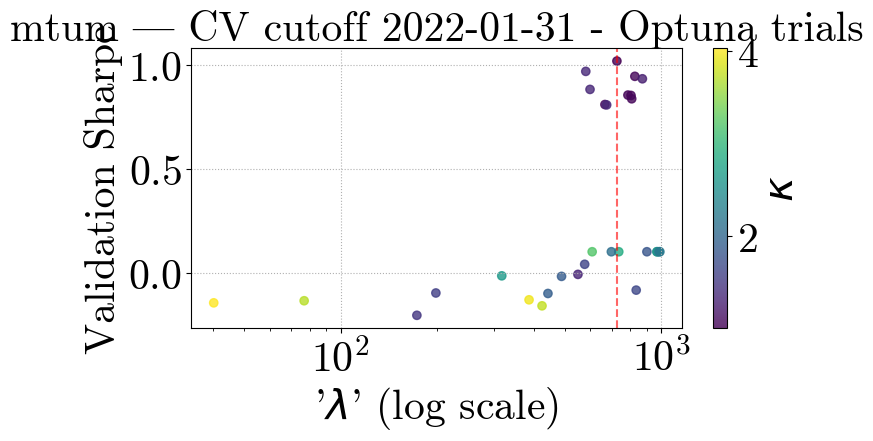

[I 2025-05-06 04:23:57,233] A new study created in memory with name: no-name-cc792456-3397-420a-ad46-1bffa97f8f0f
[I 2025-05-06 04:24:05,423] Trial 0 finished with value: -0.20642767240996113 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.20642767240996113.
[I 2025-05-06 04:24:09,351] Trial 1 finished with value: 0.2098824794909263 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.2098824794909263.
[I 2025-05-06 04:24:17,940] Trial 2 finished with value: -0.26879166428343804 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.2098824794909263.
[I 2025-05-06 04:24:27,871] Trial 3 finished with value: 0.550399794965521 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.550399794965521.
[I 2025-05-06 04:24:36,790] Trial 4 finished with value: 0.20988247949092623 and par

Optuna best λ=27.3964, κ=3.9798232276603978, Sharpe=0.7203


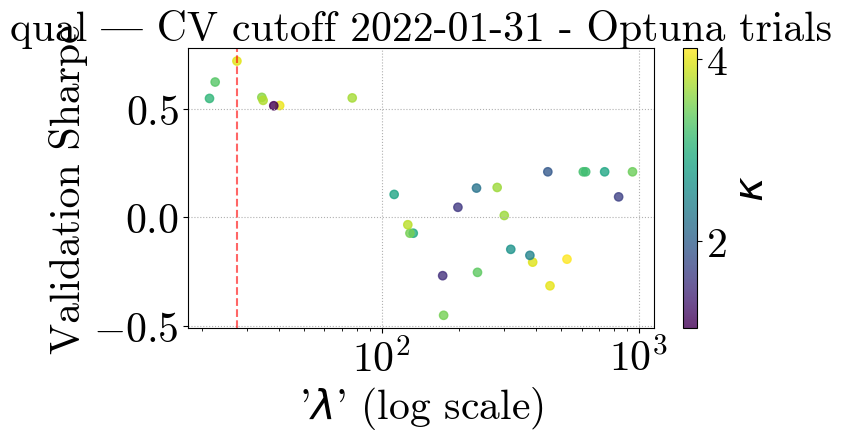

[I 2025-05-06 04:29:07,803] A new study created in memory with name: no-name-5c56b141-1861-4a5e-9bcb-9addde7199ac
[I 2025-05-06 04:29:13,032] Trial 0 finished with value: 0.6207539017762516 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6207539017762516.
[I 2025-05-06 04:29:18,236] Trial 1 finished with value: 0.6500610780034255 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.6500610780034255.
[I 2025-05-06 04:29:24,348] Trial 2 finished with value: -0.005202835359196832 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.6500610780034255.
[I 2025-05-06 04:29:33,514] Trial 3 finished with value: -0.18866414395961553 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.6500610780034255.
[I 2025-05-06 04:29:42,519] Trial 4 finished with value: 0.6864313908787302 and par

Optuna best λ=934.3147, κ=1.0589408618198615, Sharpe=0.6973


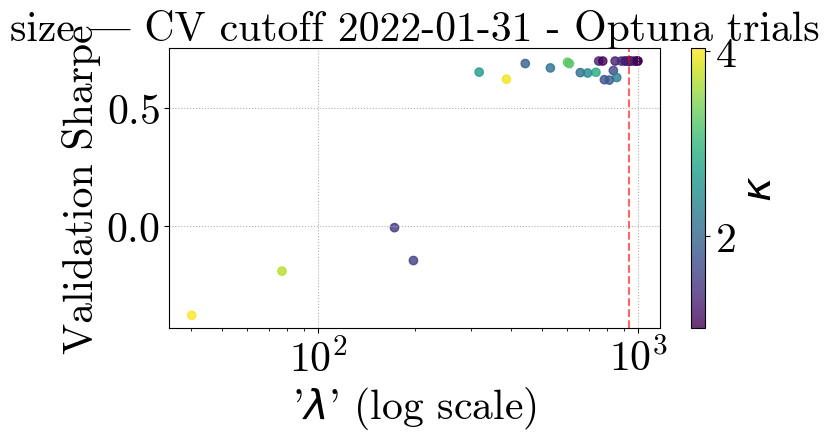

[I 2025-05-06 04:31:16,956] A new study created in memory with name: no-name-cfb93cca-6ad9-41c7-8289-afa28b44b6f2
[I 2025-05-06 04:31:22,220] Trial 0 finished with value: -1.1001987062647551 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.1001987062647551.
[I 2025-05-06 04:31:27,882] Trial 1 finished with value: -0.6408885657154104 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6408885657154104.
[I 2025-05-06 04:31:36,336] Trial 2 finished with value: -0.9698548278122096 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.6408885657154104.
[I 2025-05-06 04:31:53,015] Trial 3 finished with value: -0.7843071002639077 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.6408885657154104.
[I 2025-05-06 04:31:57,422] Trial 4 finished with value: -0.8226696609656524 and

Optuna best λ=24.2656, κ=3.7917825493459194, Sharpe=0.1218


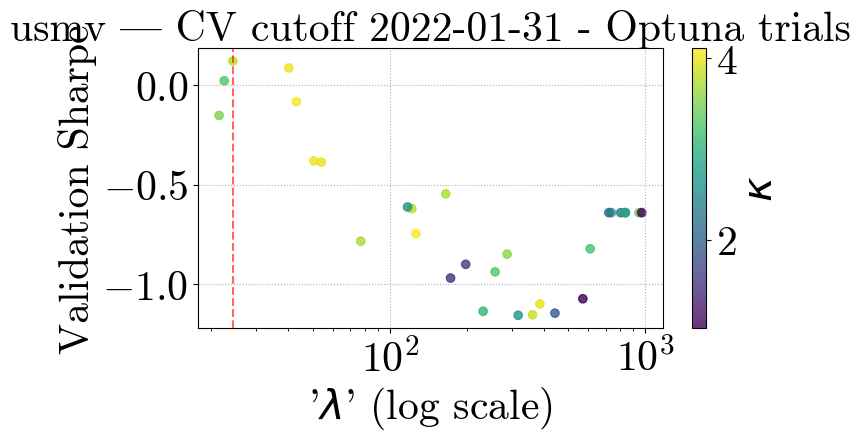

[I 2025-05-06 04:35:52,599] A new study created in memory with name: no-name-18701ccb-085d-4c06-afde-5e46a69b6aff
[I 2025-05-06 04:36:00,484] Trial 0 finished with value: 0.13686017655348914 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.13686017655348914.
[I 2025-05-06 04:36:05,580] Trial 1 finished with value: -0.10944037849491806 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.13686017655348914.
[I 2025-05-06 04:36:14,512] Trial 2 finished with value: 0.07148536974620684 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.13686017655348914.
[I 2025-05-06 04:36:22,881] Trial 3 finished with value: -0.07573553211484625 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.13686017655348914.
[I 2025-05-06 04:36:30,382] Trial 4 finished with value: -0.16562703846268506 

Optuna best λ=302.6155, κ=2.640561910157082, Sharpe=0.5760


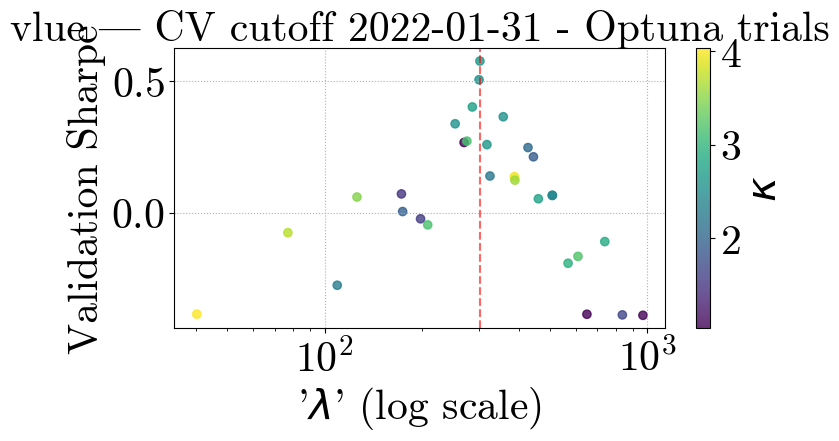

[I 2025-05-06 04:39:27,831] A new study created in memory with name: no-name-04f2607a-44ac-4a21-8c2e-eecec99c1c9e
[I 2025-05-06 04:39:32,528] Trial 0 finished with value: 0.12414158656170685 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.12414158656170685.
[I 2025-05-06 04:39:35,182] Trial 1 finished with value: 0.060043722684689146 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.12414158656170685.
[I 2025-05-06 04:39:42,070] Trial 2 finished with value: -0.01921184072244787 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.12414158656170685.
[I 2025-05-06 04:39:56,845] Trial 3 finished with value: 0.05728219569418921 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.12414158656170685.
[I 2025-05-06 04:39:59,829] Trial 4 finished with value: -0.05078618093093201 

Optuna best λ=126.9416, κ=3.541279860670312, Sharpe=0.2450


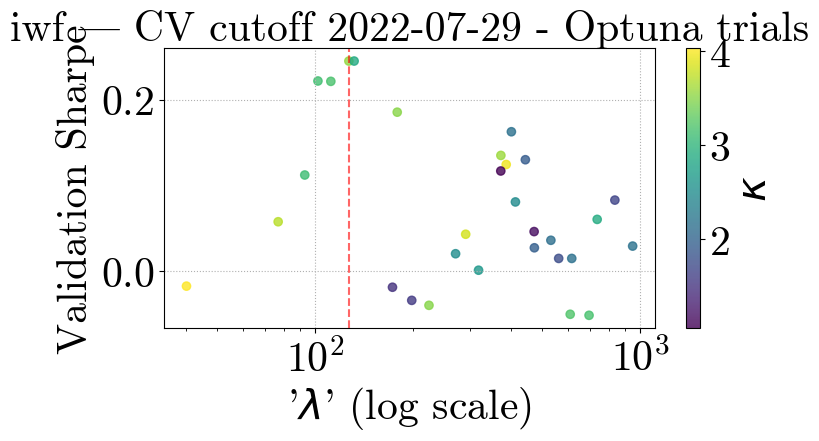

[I 2025-05-06 04:42:59,281] A new study created in memory with name: no-name-f296d4eb-78e2-4f69-9e02-a4879a33d349
[I 2025-05-06 04:43:06,281] Trial 0 finished with value: -0.11010882749243218 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.11010882749243218.
[I 2025-05-06 04:43:10,976] Trial 1 finished with value: -0.11080211229204957 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.11010882749243218.
[I 2025-05-06 04:43:18,154] Trial 2 finished with value: -0.1901514234162557 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.11010882749243218.
[I 2025-05-06 04:43:40,129] Trial 3 finished with value: -0.300945207228024 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.11010882749243218.
[I 2025-05-06 04:43:44,547] Trial 4 finished with value: -0.108953273997438

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.2110


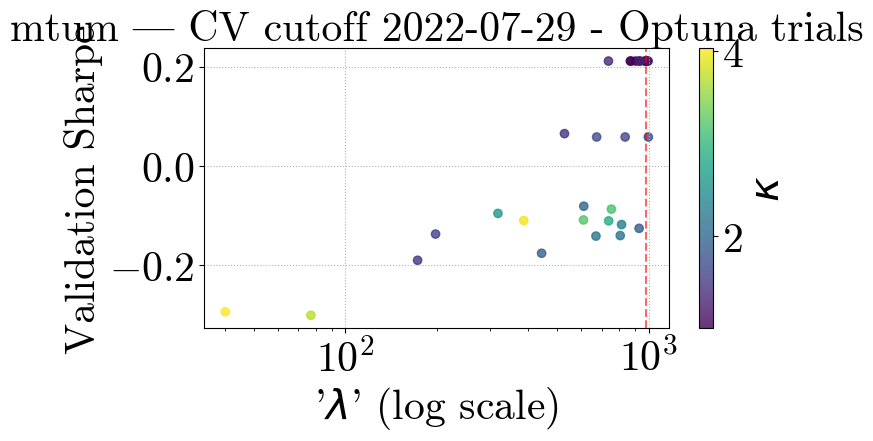

[I 2025-05-06 04:45:47,225] A new study created in memory with name: no-name-ffb82764-0b5a-4086-9bf8-5ef1d605054a
[I 2025-05-06 04:45:54,408] Trial 0 finished with value: -0.22010546377007253 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.22010546377007253.
[I 2025-05-06 04:46:00,175] Trial 1 finished with value: -0.1848251111542266 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.1848251111542266.
[I 2025-05-06 04:46:07,978] Trial 2 finished with value: -0.103544836201674 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.103544836201674.
[I 2025-05-06 04:46:18,729] Trial 3 finished with value: 0.29817693438130144 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.29817693438130144.
[I 2025-05-06 04:46:24,444] Trial 4 finished with value: -0.058922697128273305 a

Optuna best λ=54.1609, κ=4.11127017016935, Sharpe=0.4017


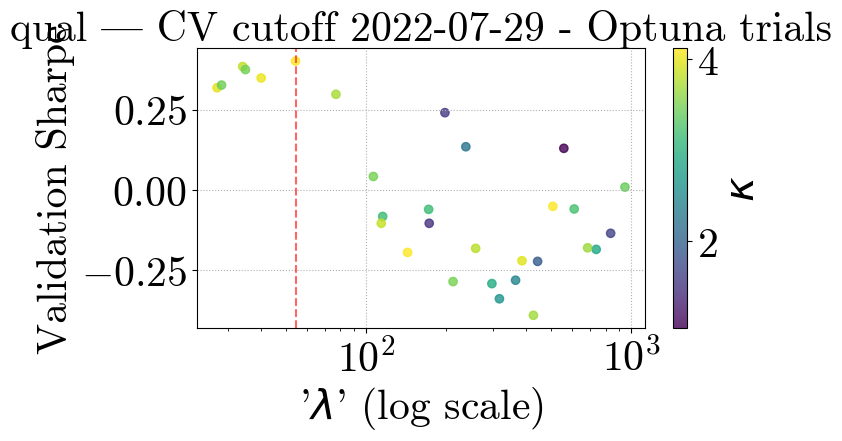

[I 2025-05-06 04:50:11,826] A new study created in memory with name: no-name-b0193082-03f2-4220-a7bb-1984993f4cde
[I 2025-05-06 04:50:19,244] Trial 0 finished with value: 0.5898262653429243 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5898262653429243.
[I 2025-05-06 04:50:24,537] Trial 1 finished with value: 0.5993435837911629 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5993435837911629.
[I 2025-05-06 04:50:32,765] Trial 2 finished with value: 0.3171226757801157 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5993435837911629.
[I 2025-05-06 04:50:48,640] Trial 3 finished with value: 0.17797363934112886 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5993435837911629.
[I 2025-05-06 04:50:53,441] Trial 4 finished with value: 0.6009249465114176 and paramet

Optuna best λ=817.2711, κ=3.392580189667147, Sharpe=0.6010


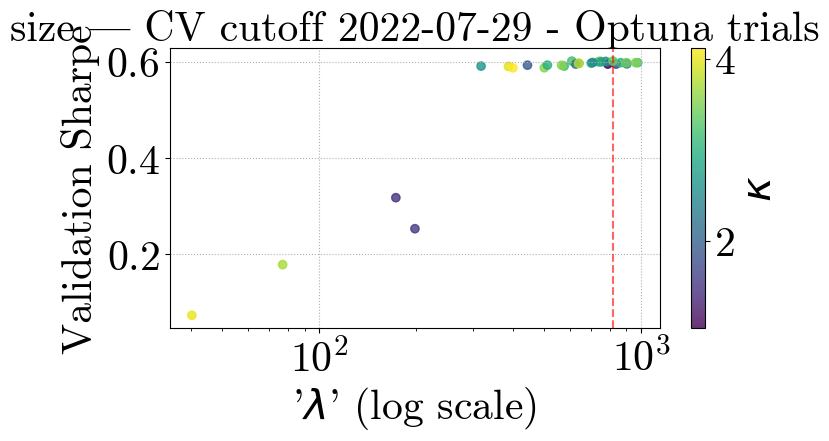

[I 2025-05-06 04:53:30,059] A new study created in memory with name: no-name-99bfe535-a20d-413f-9249-dce265cceaff
[I 2025-05-06 04:53:34,771] Trial 0 finished with value: -0.70108331352524 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.70108331352524.
[I 2025-05-06 04:53:38,688] Trial 1 finished with value: -0.688624698185485 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.688624698185485.
[I 2025-05-06 04:53:45,119] Trial 2 finished with value: -0.32419924478738915 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.32419924478738915.
[I 2025-05-06 04:53:58,521] Trial 3 finished with value: -0.17290744842838332 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.17290744842838332.
[I 2025-05-06 04:54:02,576] Trial 4 finished with value: -0.8391966927509369 and p

Optuna best λ=31.6270, κ=3.743171508134014, Sharpe=0.2145


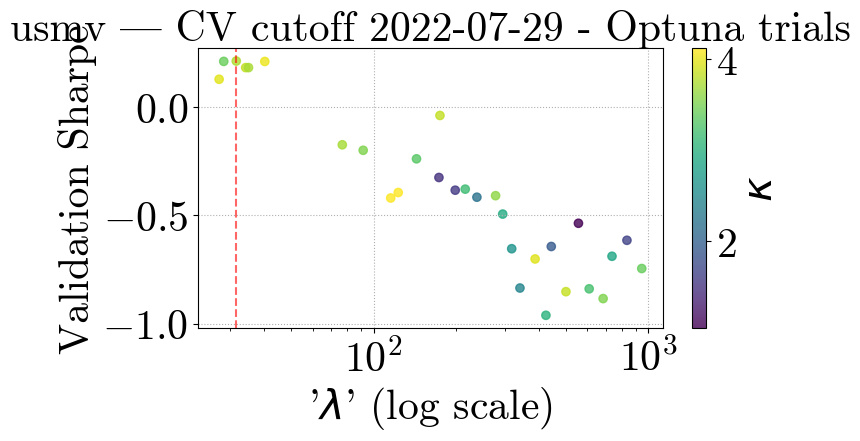

[I 2025-05-06 04:57:45,774] A new study created in memory with name: no-name-71a03f27-8b3f-4a26-9199-77f1aeba3525
[I 2025-05-06 04:57:52,784] Trial 0 finished with value: -0.12105076073178044 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.12105076073178044.
[I 2025-05-06 04:57:57,971] Trial 1 finished with value: 0.24463937630668292 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.24463937630668292.
[I 2025-05-06 04:58:03,656] Trial 2 finished with value: -0.1408409757398479 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.24463937630668292.
[I 2025-05-06 04:58:15,720] Trial 3 finished with value: 0.2667600214045293 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.2667600214045293.
[I 2025-05-06 04:58:21,402] Trial 4 finished with value: 0.04898309592358729 and

Optuna best λ=136.2662, κ=4.1125853271656325, Sharpe=0.6491


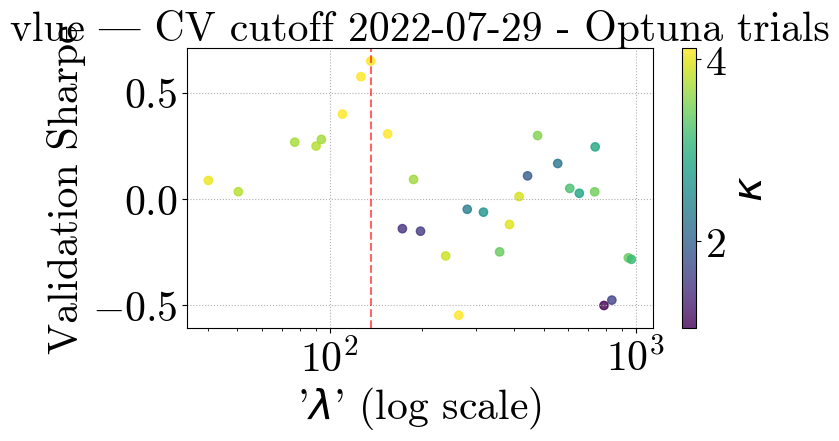

[I 2025-05-06 05:01:52,981] A new study created in memory with name: no-name-677e7275-ab15-4a72-b2d8-d1daaa119172
[I 2025-05-06 05:01:57,567] Trial 0 finished with value: -0.07365638063939493 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.07365638063939493.
[I 2025-05-06 05:02:00,031] Trial 1 finished with value: -0.22852863528168163 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.07365638063939493.
[I 2025-05-06 05:02:10,749] Trial 2 finished with value: -0.07166018490692193 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.07166018490692193.
[I 2025-05-06 05:02:25,582] Trial 3 finished with value: -0.07405487239742023 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.07166018490692193.
[I 2025-05-06 05:02:28,467] Trial 4 finished with value: -0.161897797900

Optuna best λ=948.0226, κ=1.392115193311568, Sharpe=0.1464


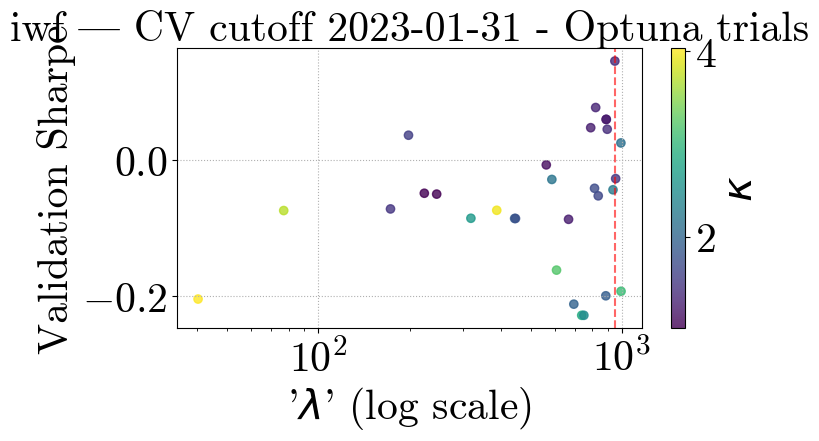

[I 2025-05-06 05:04:15,015] A new study created in memory with name: no-name-3d709523-5b28-4597-bcdb-f510c034f0aa
[I 2025-05-06 05:04:24,660] Trial 0 finished with value: -0.1005266305165068 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.1005266305165068.
[I 2025-05-06 05:04:33,232] Trial 1 finished with value: -0.17824876198424774 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.1005266305165068.
[I 2025-05-06 05:04:43,515] Trial 2 finished with value: -0.5033819045812296 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.1005266305165068.
[I 2025-05-06 05:04:59,052] Trial 3 finished with value: -0.5067845264885764 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.1005266305165068.
[I 2025-05-06 05:05:06,863] Trial 4 finished with value: -0.11413685671981957 a

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.6956


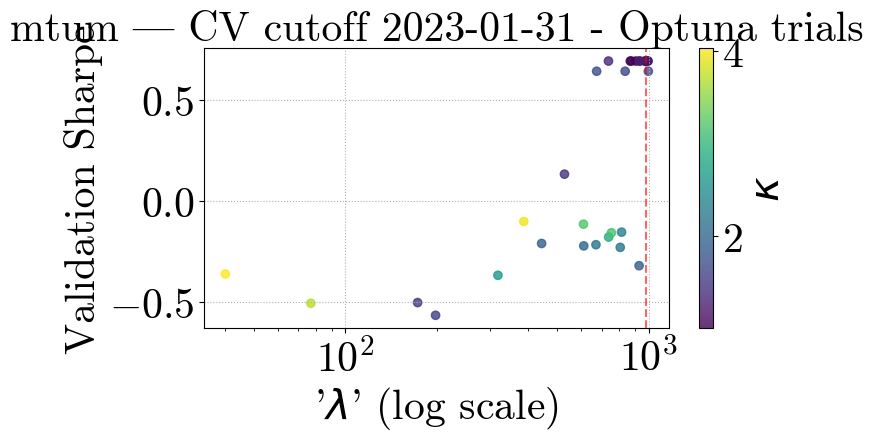

[I 2025-05-06 05:07:23,285] A new study created in memory with name: no-name-0dd8f9b8-ac16-49e3-8bab-724adf309233
[I 2025-05-06 05:07:32,347] Trial 0 finished with value: -0.07405880029109146 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.07405880029109146.
[I 2025-05-06 05:07:42,430] Trial 1 finished with value: -0.07405880029109146 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.07405880029109146.
[I 2025-05-06 05:08:09,016] Trial 2 finished with value: 0.30722794245344315 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.30722794245344315.
[I 2025-05-06 05:08:21,170] Trial 3 finished with value: 0.35090358671679267 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.35090358671679267.
[I 2025-05-06 05:08:32,113] Trial 4 finished with value: -0.0740588002910914

Optuna best λ=34.2268, κ=3.834733028321934, Sharpe=0.4696


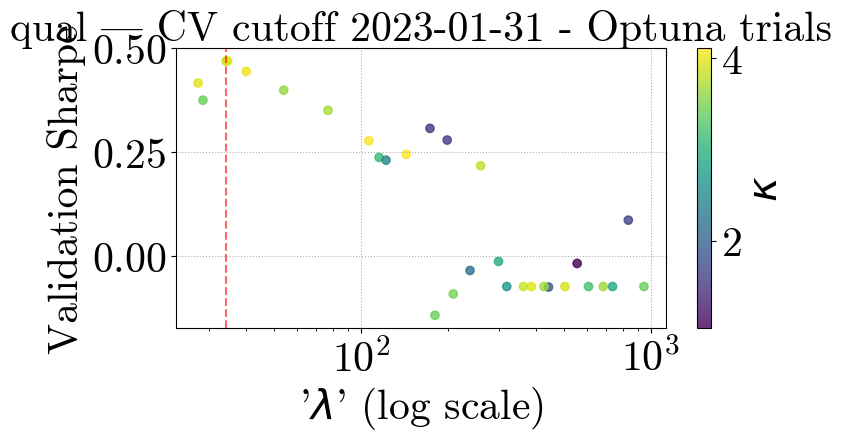

[I 2025-05-06 05:12:56,658] A new study created in memory with name: no-name-2dc0b8c2-b0ee-4ea5-9beb-a8f0b8097acf
[I 2025-05-06 05:13:04,141] Trial 0 finished with value: 0.3937958145228757 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3937958145228757.
[I 2025-05-06 05:13:08,612] Trial 1 finished with value: 0.3902206474835763 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3937958145228757.
[I 2025-05-06 05:13:16,498] Trial 2 finished with value: 0.13311849001815623 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3937958145228757.
[I 2025-05-06 05:13:27,276] Trial 3 finished with value: 0.13059422535780976 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3937958145228757.
[I 2025-05-06 05:13:32,210] Trial 4 finished with value: 0.3893722840592673 and parame

Optuna best λ=306.1260, κ=1.797308272706998, Sharpe=0.4037


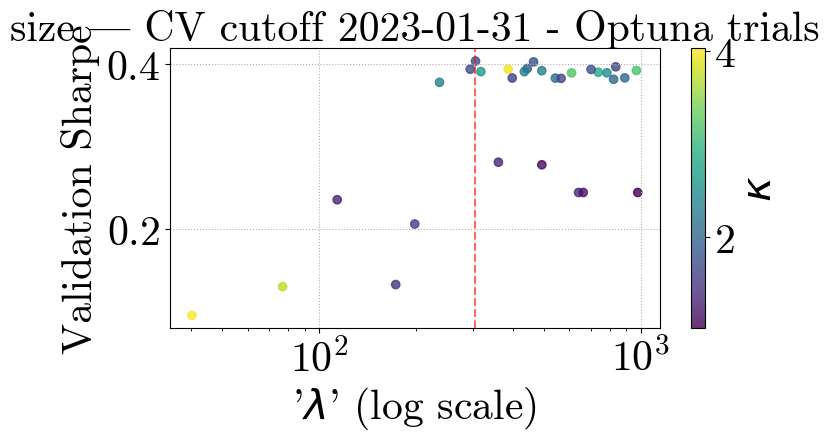

[I 2025-05-06 05:16:06,726] A new study created in memory with name: no-name-b6843c96-a7c9-4f44-98b7-d538bc0e484f
[I 2025-05-06 05:16:10,859] Trial 0 finished with value: -0.16983454701001968 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.16983454701001968.
[I 2025-05-06 05:16:14,930] Trial 1 finished with value: -0.6013556331421467 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.16983454701001968.
[I 2025-05-06 05:16:23,125] Trial 2 finished with value: -0.45402166147345563 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.16983454701001968.
[I 2025-05-06 05:16:35,191] Trial 3 finished with value: -0.19159007735484201 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.16983454701001968.
[I 2025-05-06 05:16:39,393] Trial 4 finished with value: -0.5568752885253

Optuna best λ=28.3342, κ=3.1772915080384827, Sharpe=0.1984


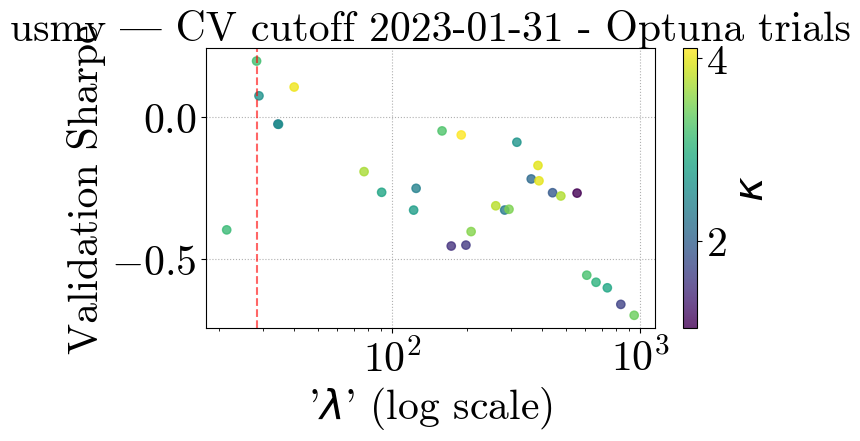

[I 2025-05-06 05:20:16,224] A new study created in memory with name: no-name-88f4ec1c-055f-4c09-9277-cf20476b6d0f
[I 2025-05-06 05:20:25,845] Trial 0 finished with value: 0.6440704719946743 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6440704719946743.
[I 2025-05-06 05:20:31,874] Trial 1 finished with value: -0.012468460042013907 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6440704719946743.
[I 2025-05-06 05:20:39,895] Trial 2 finished with value: 0.08117121972840077 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6440704719946743.
[I 2025-05-06 05:20:50,955] Trial 3 finished with value: 0.28674367566538245 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6440704719946743.
[I 2025-05-06 05:20:58,328] Trial 4 finished with value: -0.026631590914926593 and 

Optuna best λ=362.7862, κ=3.1137742847580365, Sharpe=0.8573


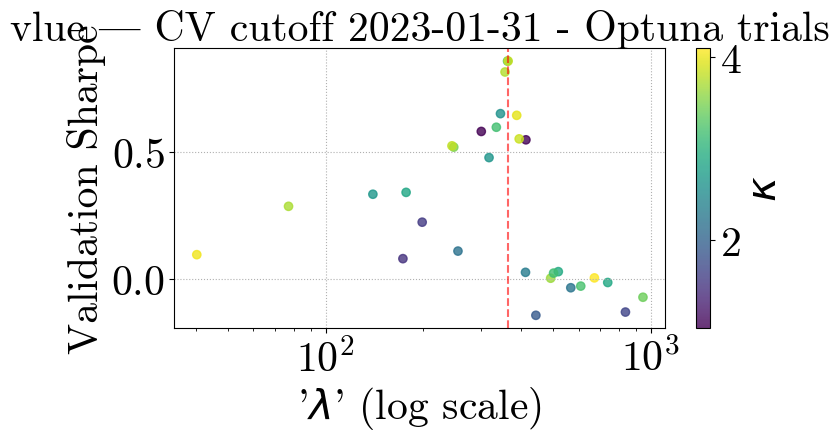

[I 2025-05-06 05:24:37,541] A new study created in memory with name: no-name-83436eba-8178-4806-927a-5919aac2fdf6
[I 2025-05-06 05:24:43,857] Trial 0 finished with value: -0.050920665130482524 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.050920665130482524.
[I 2025-05-06 05:24:49,872] Trial 1 finished with value: -0.05309899766395232 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.050920665130482524.
[I 2025-05-06 05:24:56,782] Trial 2 finished with value: -0.2590503131844761 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.050920665130482524.
[I 2025-05-06 05:25:13,443] Trial 3 finished with value: -0.06660010147237067 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.050920665130482524.
[I 2025-05-06 05:25:19,376] Trial 4 finished with value: -0.09136050

Optuna best λ=424.2470, κ=2.2256718351156524, Sharpe=0.0421


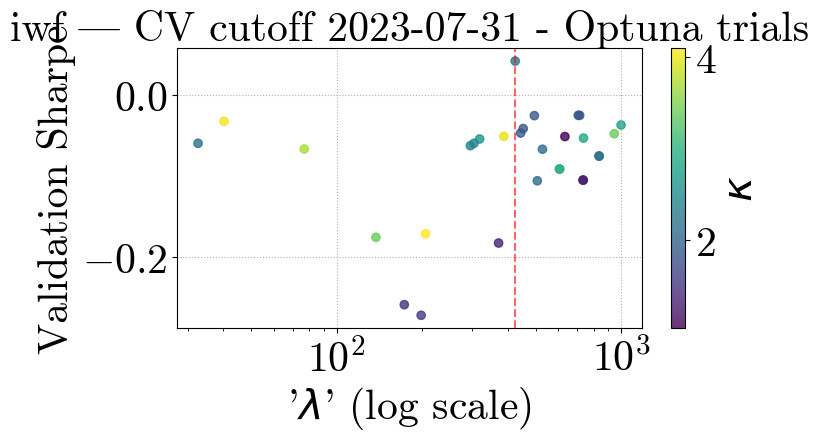

[I 2025-05-06 05:28:45,123] A new study created in memory with name: no-name-5a548878-bf95-45e7-8811-0bdb1132a0dd
[I 2025-05-06 05:28:48,186] Trial 0 finished with value: -0.677278313819043 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.677278313819043.
[I 2025-05-06 05:28:51,564] Trial 1 finished with value: -0.03750826350130636 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.03750826350130636.
[I 2025-05-06 05:28:58,221] Trial 2 finished with value: -0.6464426826371366 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.03750826350130636.
[I 2025-05-06 05:29:27,238] Trial 3 finished with value: -0.798442471124658 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.03750826350130636.
[I 2025-05-06 05:29:30,867] Trial 4 finished with value: -0.07136404648016877 a

Optuna best λ=886.5855, κ=1.0823503127445395, Sharpe=0.6352


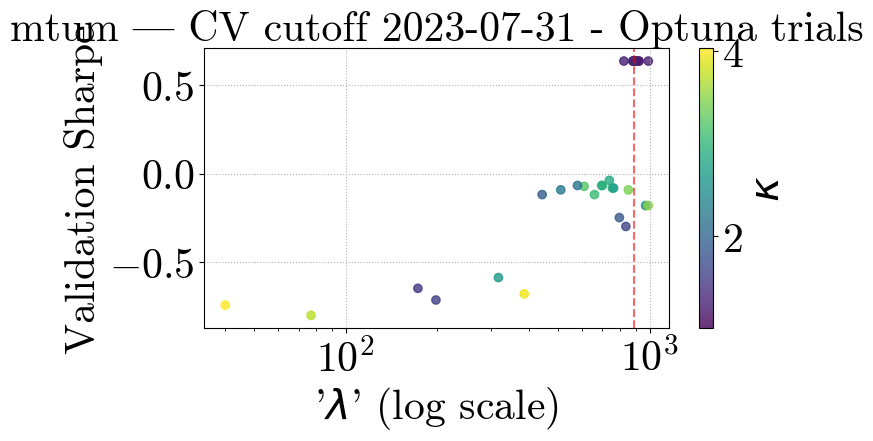

[I 2025-05-06 05:31:18,317] A new study created in memory with name: no-name-e14befb6-fce6-4d3a-8f56-96b4a67318f3
[I 2025-05-06 05:31:31,589] Trial 0 finished with value: 0.37685072262502334 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.37685072262502334.
[I 2025-05-06 05:31:40,134] Trial 1 finished with value: 0.3768507226250233 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.37685072262502334.
[I 2025-05-06 05:31:49,568] Trial 2 finished with value: 0.4793351348939927 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.4793351348939927.
[I 2025-05-06 05:32:09,455] Trial 3 finished with value: 0.29509599481368665 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.4793351348939927.
[I 2025-05-06 05:32:17,437] Trial 4 finished with value: 0.3768507226250233 and para

Optuna best λ=272.3555, κ=2.4697697239285508, Sharpe=0.6099


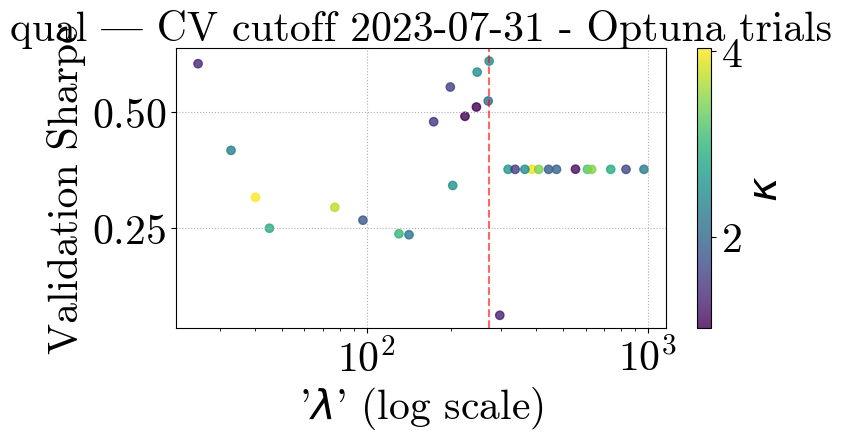

[I 2025-05-06 05:36:34,184] A new study created in memory with name: no-name-3617d62e-49ae-422e-88ed-bdd9c164fc52
[I 2025-05-06 05:36:42,614] Trial 0 finished with value: 0.3467112618378411 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3467112618378411.
[I 2025-05-06 05:36:46,698] Trial 1 finished with value: 0.37346648032651997 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.37346648032651997.
[I 2025-05-06 05:36:56,617] Trial 2 finished with value: 0.36491482962922034 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.37346648032651997.
[I 2025-05-06 05:37:08,852] Trial 3 finished with value: 0.11712250378456832 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.37346648032651997.
[I 2025-05-06 05:37:13,849] Trial 4 finished with value: 0.37346648032651997 and p

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.3735


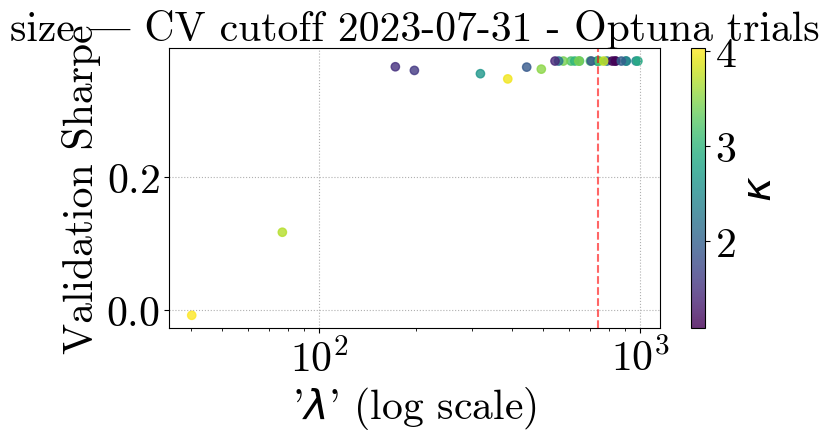

[I 2025-05-06 05:39:41,930] A new study created in memory with name: no-name-8c1fbcf8-8059-4ad1-ad05-0a7913708e41
[I 2025-05-06 05:39:49,147] Trial 0 finished with value: 0.06857611389033291 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.06857611389033291.
[I 2025-05-06 05:39:53,245] Trial 1 finished with value: 0.02847170776114667 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.06857611389033291.
[I 2025-05-06 05:40:03,530] Trial 2 finished with value: -0.7675697716159796 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.06857611389033291.
[I 2025-05-06 05:40:17,531] Trial 3 finished with value: 0.5801715731368969 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5801715731368969.
[I 2025-05-06 05:40:21,514] Trial 4 finished with value: 0.2233014526754276 and pa

Optuna best λ=137.4059, κ=3.6224350528031977, Sharpe=0.8008


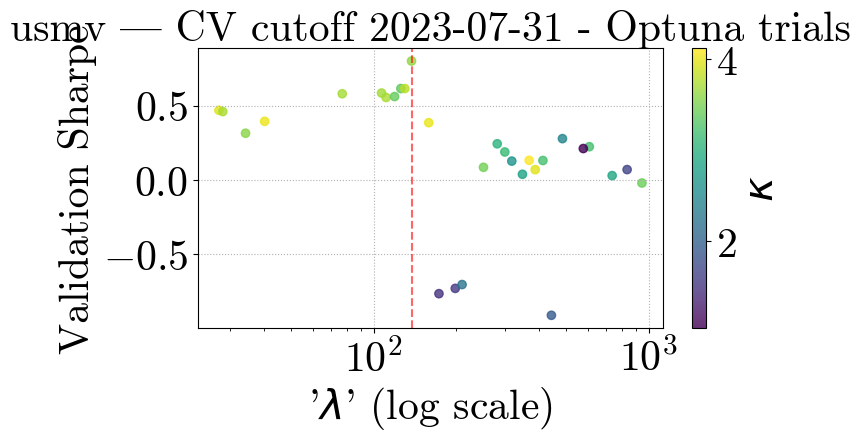

[I 2025-05-06 05:44:57,749] A new study created in memory with name: no-name-574cf8ca-9dbb-45c3-95c2-3b656d1c6b93
[I 2025-05-06 05:45:04,610] Trial 0 finished with value: -0.09796909383241835 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.09796909383241835.
[I 2025-05-06 05:45:08,528] Trial 1 finished with value: -0.44586547095788226 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.09796909383241835.
[I 2025-05-06 05:45:20,094] Trial 2 finished with value: 0.21553359540602618 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.21553359540602618.
[I 2025-05-06 05:45:37,960] Trial 3 finished with value: 0.6394488498773568 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.6394488498773568.
[I 2025-05-06 05:45:42,143] Trial 4 finished with value: -0.7380497162333208 a

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.7220


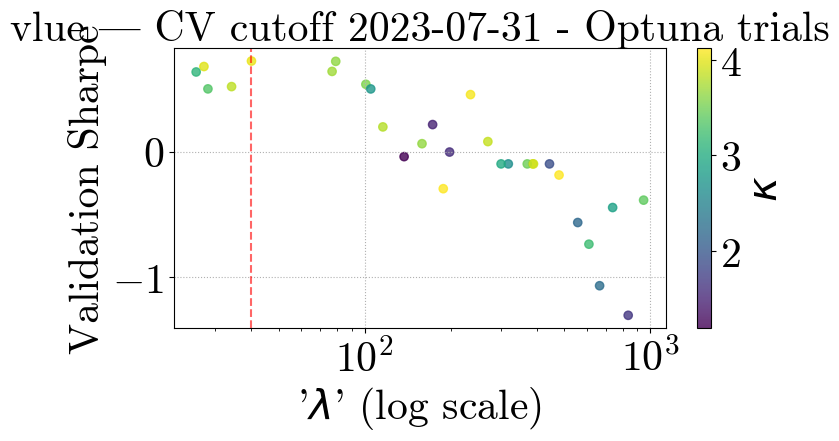

[I 2025-05-06 05:50:14,727] A new study created in memory with name: no-name-29615496-83c0-4ca2-b559-e9782a083ffb
[I 2025-05-06 05:50:24,278] Trial 0 finished with value: -0.16106027090060535 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.16106027090060535.
[I 2025-05-06 05:50:29,627] Trial 1 finished with value: -0.22214175303644104 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.16106027090060535.
[I 2025-05-06 05:50:35,444] Trial 2 finished with value: -0.2629656764097547 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.16106027090060535.
[I 2025-05-06 05:50:47,578] Trial 3 finished with value: 0.19341381864776638 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.19341381864776638.
[I 2025-05-06 05:50:55,340] Trial 4 finished with value: -0.183950061417746

Optuna best λ=34.2366, κ=3.561963338490747, Sharpe=0.2019


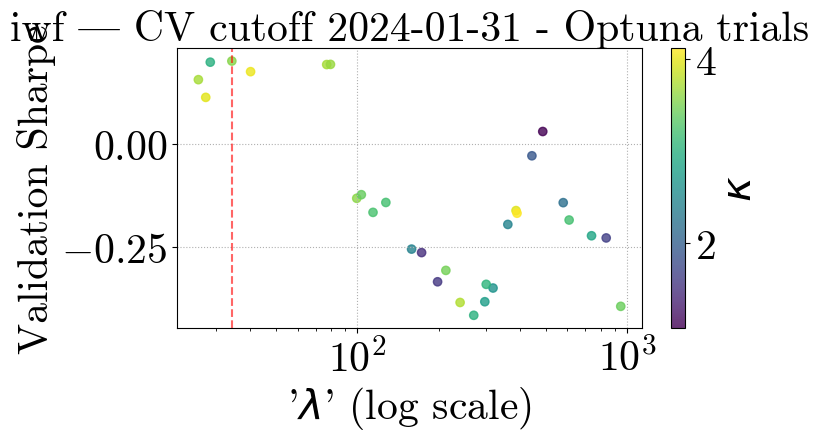

[I 2025-05-06 05:55:21,906] A new study created in memory with name: no-name-2c9076ee-f522-4b34-817d-2de229ea6aa9
[I 2025-05-06 05:55:29,076] Trial 0 finished with value: -0.47358647562910094 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.47358647562910094.
[I 2025-05-06 05:55:33,489] Trial 1 finished with value: -0.4629553389960352 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.4629553389960352.
[I 2025-05-06 05:55:39,457] Trial 2 finished with value: -0.2632493831467143 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.2632493831467143.
[I 2025-05-06 05:55:54,304] Trial 3 finished with value: -1.2226977154600054 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.2632493831467143.
[I 2025-05-06 05:56:01,739] Trial 4 finished with value: -0.4628220400483972 a

Optuna best λ=556.6071, κ=1.5485958168673346, Sharpe=-0.2485


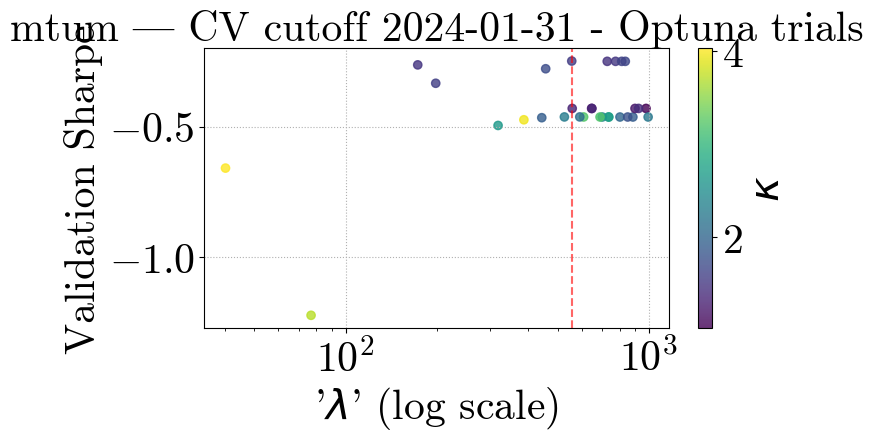

[I 2025-05-06 05:58:18,122] A new study created in memory with name: no-name-e9f633a3-c268-4959-840c-1cc362c7ebb5
[I 2025-05-06 05:58:22,908] Trial 0 finished with value: 0.03009874847117543 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.03009874847117543.
[I 2025-05-06 05:58:26,975] Trial 1 finished with value: 0.03009874847117543 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.03009874847117543.
[I 2025-05-06 05:58:36,785] Trial 2 finished with value: 0.9442756798718647 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9442756798718647.
[I 2025-05-06 05:58:48,041] Trial 3 finished with value: 0.12789334453388043 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.9442756798718647.
[I 2025-05-06 05:58:52,023] Trial 4 finished with value: 0.03009874847117543 and pa

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=0.9443


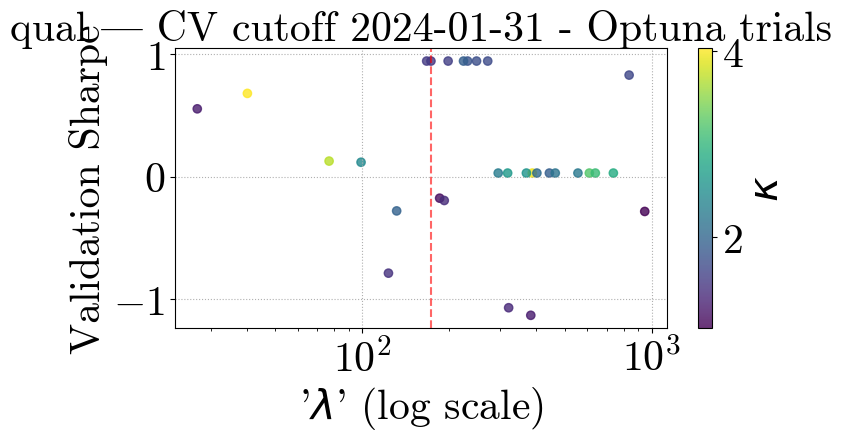

[I 2025-05-06 06:02:11,690] A new study created in memory with name: no-name-58db001b-2b93-4032-9464-1f20ecd8048e
[I 2025-05-06 06:02:16,623] Trial 0 finished with value: 0.41837208804095943 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.41837208804095943.
[I 2025-05-06 06:02:17,490] Trial 1 finished with value: 0.427268902260415 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.427268902260415.
[I 2025-05-06 06:02:32,698] Trial 2 finished with value: 0.1814942746887786 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.427268902260415.
[I 2025-05-06 06:02:42,052] Trial 3 finished with value: 0.1301056247170763 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.427268902260415.
[I 2025-05-06 06:02:46,407] Trial 4 finished with value: 0.427268902260415 and parameters:

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.4273


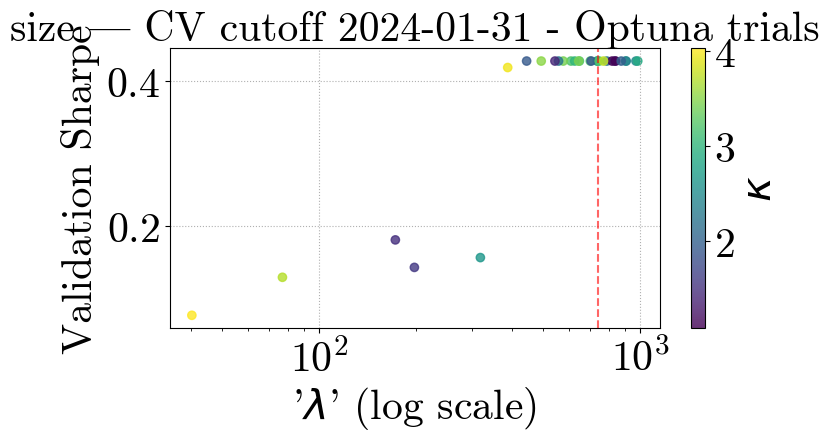

[I 2025-05-06 06:04:03,951] A new study created in memory with name: no-name-347a7c11-b7de-4b8d-b68b-7b46216e44b4
[I 2025-05-06 06:04:11,003] Trial 0 finished with value: -0.5650914906140823 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5650914906140823.
[I 2025-05-06 06:04:11,750] Trial 1 finished with value: -0.025820646506187924 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.025820646506187924.
[I 2025-05-06 06:04:19,052] Trial 2 finished with value: -0.3224201065115322 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.025820646506187924.
[I 2025-05-06 06:04:36,384] Trial 3 finished with value: 0.20317402062236287 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.20317402062236287.
[I 2025-05-06 06:04:41,753] Trial 4 finished with value: -0.20790807353738

Optuna best λ=134.8374, κ=3.2946725840031856, Sharpe=0.4594


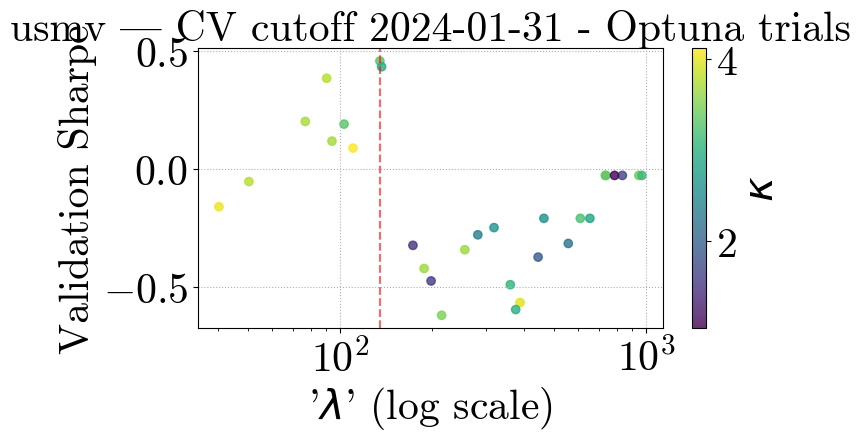

[I 2025-05-06 06:08:06,187] A new study created in memory with name: no-name-cf0185dc-7219-4938-8e3c-d83c61467ac8
[I 2025-05-06 06:08:12,883] Trial 0 finished with value: 0.16868331829882802 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.16868331829882802.
[I 2025-05-06 06:08:16,899] Trial 1 finished with value: 0.37264578844772317 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.37264578844772317.
[I 2025-05-06 06:08:29,154] Trial 2 finished with value: 0.16868331829882802 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.37264578844772317.
[I 2025-05-06 06:08:42,335] Trial 3 finished with value: 0.5073184423855741 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5073184423855741.
[I 2025-05-06 06:08:47,370] Trial 4 finished with value: 0.37264578844772317 and p

Optuna best λ=35.0437, κ=3.9923187856246907, Sharpe=0.8667


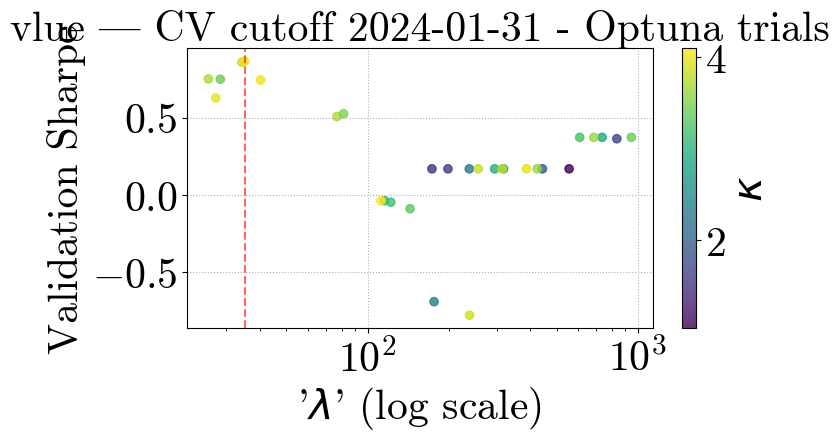

[I 2025-05-06 06:14:25,169] A new study created in memory with name: no-name-ccc8a7a0-e4de-42ab-bd2d-5a9c5d70fcf0
[I 2025-05-06 06:14:31,115] Trial 0 finished with value: 0.02967992438708804 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.02967992438708804.
[I 2025-05-06 06:14:33,710] Trial 1 finished with value: 0.0707055540596556 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.0707055540596556.
[I 2025-05-06 06:14:40,079] Trial 2 finished with value: 0.20658401199429696 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.20658401199429696.
[I 2025-05-06 06:14:50,477] Trial 3 finished with value: 0.1791939466745968 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.20658401199429696.
[I 2025-05-06 06:14:53,611] Trial 4 finished with value: 0.057740859011936804 and p

Optuna best λ=882.9144, κ=1.2867137722414546, Sharpe=0.2827


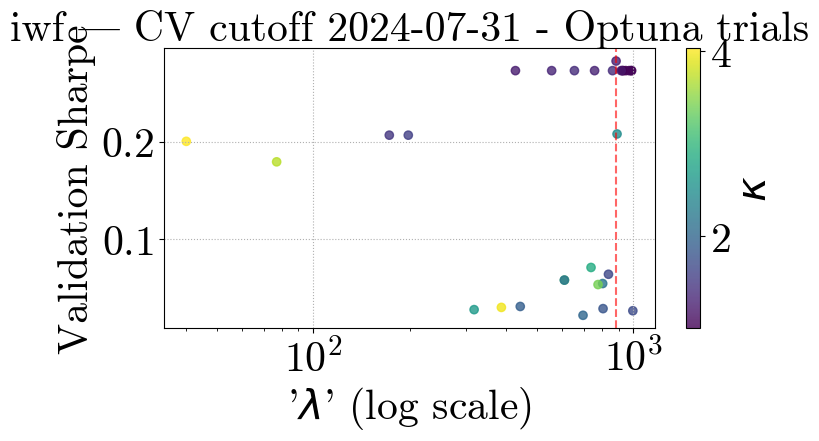

[I 2025-05-06 06:16:41,400] A new study created in memory with name: no-name-d88c861e-331a-46ce-bc2c-61fbc37213eb
[I 2025-05-06 06:16:47,083] Trial 0 finished with value: 0.24068517321786995 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.24068517321786995.
[I 2025-05-06 06:16:51,833] Trial 1 finished with value: 0.41517640689933194 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.41517640689933194.
[I 2025-05-06 06:16:58,114] Trial 2 finished with value: 0.23201676488306885 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.41517640689933194.
[I 2025-05-06 06:17:12,645] Trial 3 finished with value: -0.030192882555014736 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.41517640689933194.
[I 2025-05-06 06:17:17,725] Trial 4 finished with value: 0.3665607979538772 an

Optuna best λ=282.5157, κ=1.1209428898519394, Sharpe=0.7924


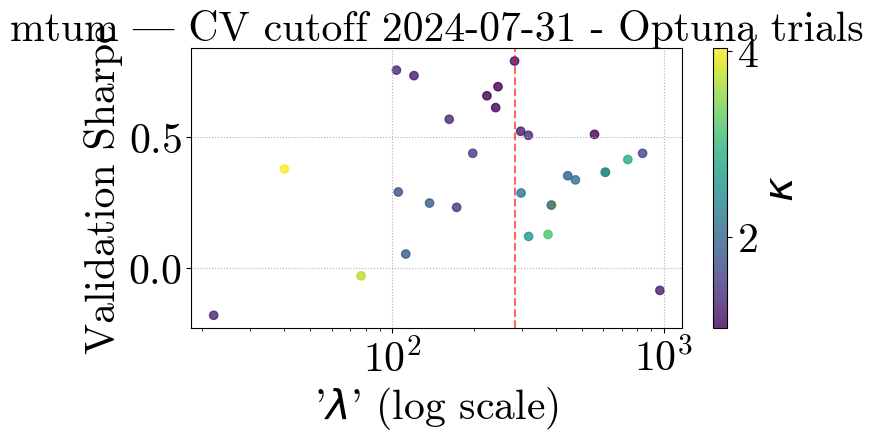

[I 2025-05-06 06:19:45,315] A new study created in memory with name: no-name-6f55bdbf-791a-4737-bcf6-3cba785a2a82
[I 2025-05-06 06:19:50,579] Trial 0 finished with value: -0.2630561726318326 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2630561726318326.
[I 2025-05-06 06:19:54,197] Trial 1 finished with value: -0.008652394369947592 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.008652394369947592.
[I 2025-05-06 06:20:00,260] Trial 2 finished with value: 0.3479309403085898 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.3479309403085898.
[I 2025-05-06 06:20:16,728] Trial 3 finished with value: 0.44476964334886265 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.44476964334886265.
[I 2025-05-06 06:20:20,376] Trial 4 finished with value: -0.22886825304073508 

Optuna best λ=24.3062, κ=2.2104976391689557, Sharpe=0.8525


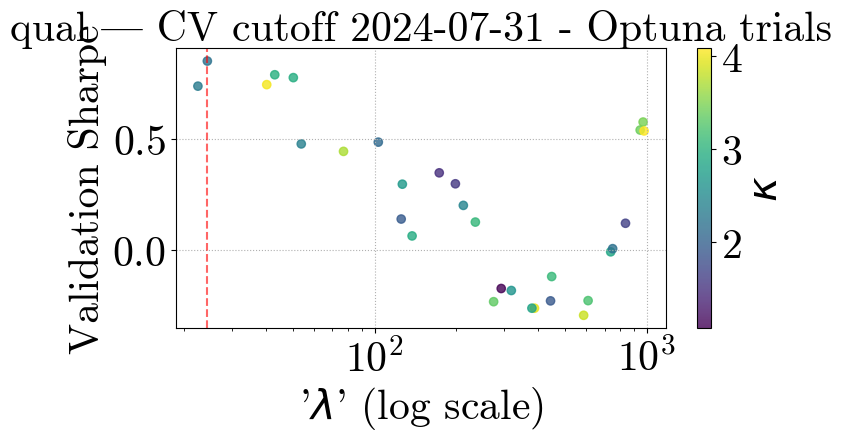

[I 2025-05-06 06:25:50,376] A new study created in memory with name: no-name-e8045b36-38fc-46ad-bda1-73628ffc65ca
[I 2025-05-06 06:25:57,104] Trial 0 finished with value: 0.5012408687545277 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-06 06:25:58,040] Trial 1 finished with value: 0.5012408687545277 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-06 06:26:09,360] Trial 2 finished with value: 0.4793492722825119 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-06 06:26:21,272] Trial 3 finished with value: 0.38406650133137077 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-06 06:26:22,594] Trial 4 finished with value: 0.5012408687545277 and paramet

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.5012


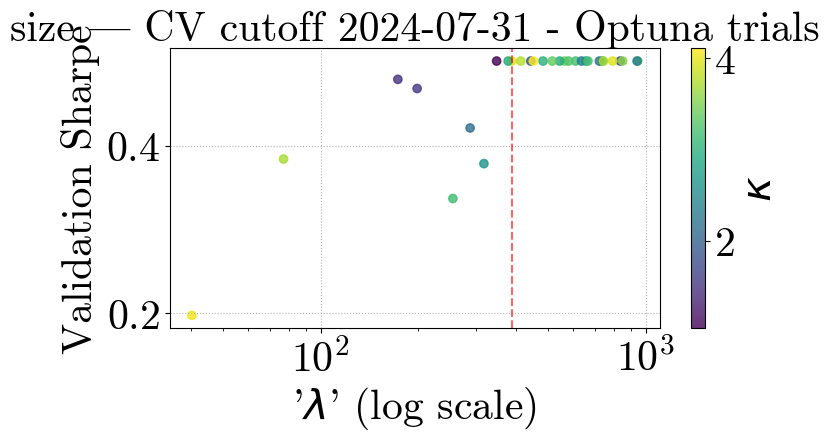

[I 2025-05-06 06:28:11,900] A new study created in memory with name: no-name-bafff3cc-5050-4433-a2ff-ccbf2e5377e2
[I 2025-05-06 06:28:19,304] Trial 0 finished with value: -0.5908409164241725 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5908409164241725.
[I 2025-05-06 06:28:24,219] Trial 1 finished with value: -0.9185553119547528 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5908409164241725.
[I 2025-05-06 06:28:30,372] Trial 2 finished with value: -0.5939200814134574 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.5908409164241725.
[I 2025-05-06 06:28:43,389] Trial 3 finished with value: 0.34562189812017047 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.34562189812017047.
[I 2025-05-06 06:28:49,807] Trial 4 finished with value: -0.554925865471433 and 

Optuna best λ=116.2359, κ=1.326184431810769, Sharpe=0.5339


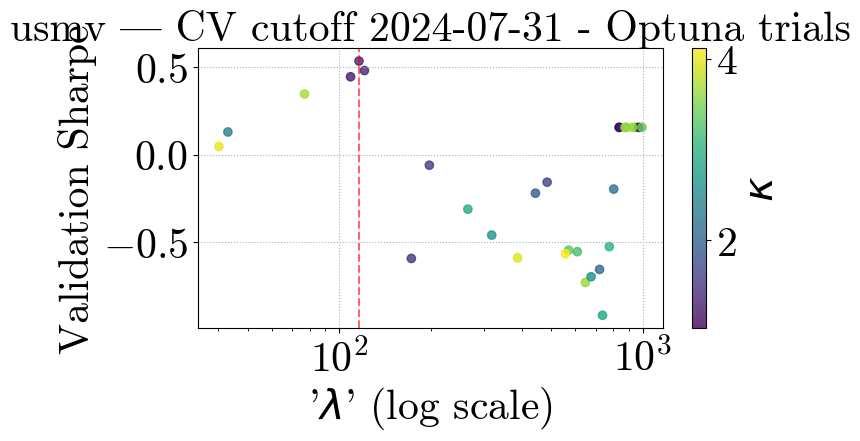

[I 2025-05-06 06:30:54,088] A new study created in memory with name: no-name-f1adaf23-df67-4f57-954b-6076d5fb4b41
[I 2025-05-06 06:31:07,574] Trial 0 finished with value: 0.3718054907594993 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-06 06:31:12,673] Trial 1 finished with value: 0.3718054907594993 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-06 06:31:23,973] Trial 2 finished with value: 0.3718054907594993 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-06 06:31:37,738] Trial 3 finished with value: 0.34027666587553845 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-06 06:31:42,558] Trial 4 finished with value: 0.3718054907594993 and paramet

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.7211


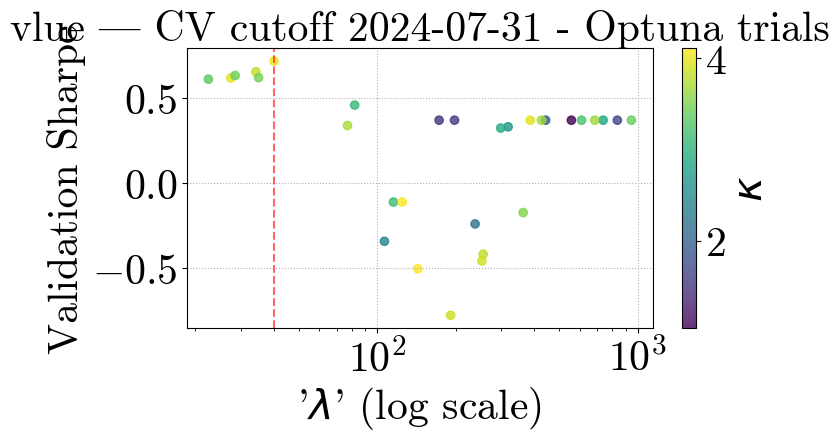

[I 2025-05-06 06:36:01,016] A new study created in memory with name: no-name-8068adae-ea47-4cec-aef7-61276f8b9388
[I 2025-05-06 06:36:04,338] Trial 0 finished with value: 0.609981370241624 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.609981370241624.
[I 2025-05-06 06:36:06,656] Trial 1 finished with value: 0.6075836806101277 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.609981370241624.
[I 2025-05-06 06:36:16,252] Trial 2 finished with value: 0.1319607613859997 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.609981370241624.
[I 2025-05-06 06:36:25,870] Trial 3 finished with value: 0.6096024652955163 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.609981370241624.
[I 2025-05-06 06:36:28,152] Trial 4 finished with value: 0.6285446620798951 and parameters: {

Optuna best λ=50.3067, κ=2.9348699430616354, Sharpe=0.7493


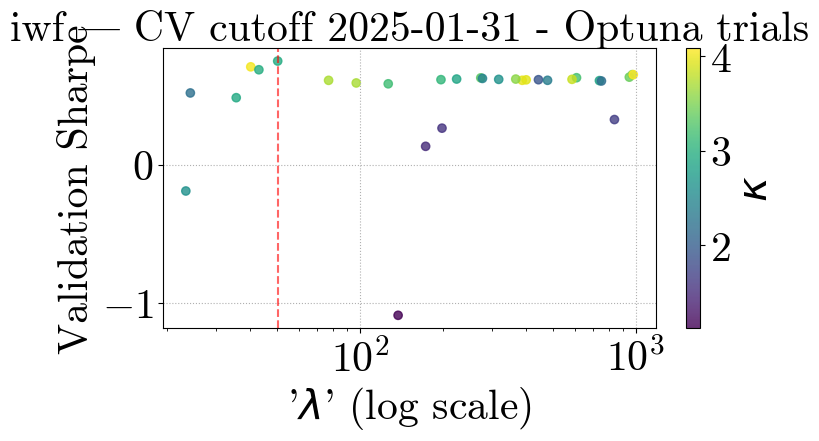

[I 2025-05-06 06:39:45,351] A new study created in memory with name: no-name-64ab35c7-55b0-4897-ac89-7845909480d8
[I 2025-05-06 06:39:49,766] Trial 0 finished with value: -0.16198107887440752 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.16198107887440752.
[I 2025-05-06 06:39:54,131] Trial 1 finished with value: -0.05256825737022445 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.05256825737022445.
[I 2025-05-06 06:40:04,035] Trial 2 finished with value: -0.7443474252486055 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.05256825737022445.
[I 2025-05-06 06:40:15,381] Trial 3 finished with value: -0.14498125205000706 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.05256825737022445.
[I 2025-05-06 06:40:19,715] Trial 4 finished with value: -0.0023611749373

Optuna best λ=324.5298, κ=1.4194367062964883, Sharpe=0.6566


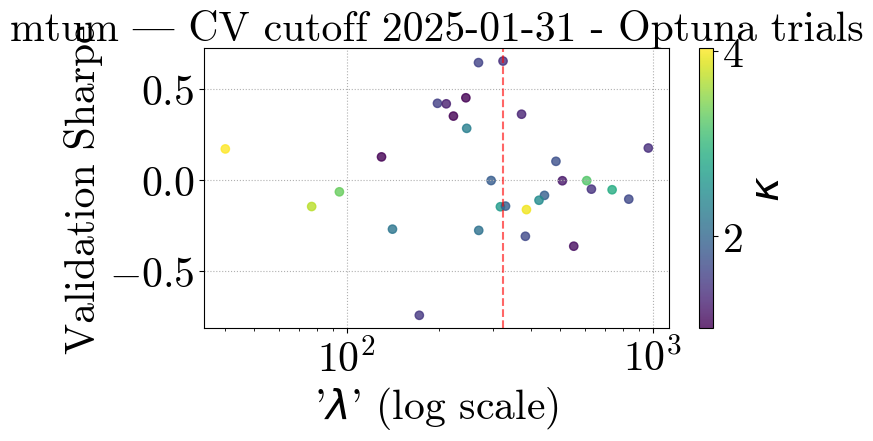

[I 2025-05-06 06:43:05,685] A new study created in memory with name: no-name-07fd6ad5-3d0c-488b-ab44-a2340c2ae64d
[I 2025-05-06 06:43:08,766] Trial 0 finished with value: 0.036268715522234006 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.036268715522234006.
[I 2025-05-06 06:43:11,485] Trial 1 finished with value: 0.6470032959629949 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.6470032959629949.
[I 2025-05-06 06:43:15,895] Trial 2 finished with value: -0.13436690758383749 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.6470032959629949.
[I 2025-05-06 06:43:30,201] Trial 3 finished with value: 0.4446614444545796 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.6470032959629949.
[I 2025-05-06 06:43:33,546] Trial 4 finished with value: 0.0022053993387769113 and

Optuna best λ=827.0051, κ=2.074055598614203, Sharpe=0.8402


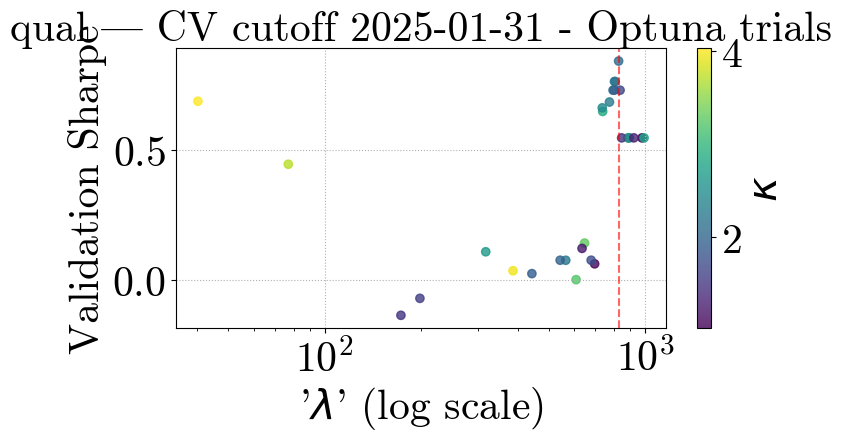

[I 2025-05-06 06:44:49,030] A new study created in memory with name: no-name-45d60587-3089-4f3e-b2f7-e72229820021
[I 2025-05-06 06:44:54,733] Trial 0 finished with value: 0.5807085639718884 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-06 06:44:55,799] Trial 1 finished with value: 0.5807085639718884 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-06 06:45:04,818] Trial 2 finished with value: 0.5131153960156555 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-06 06:45:18,013] Trial 3 finished with value: 0.3985981601707661 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-06 06:45:19,880] Trial 4 finished with value: 0.5807085639718884 and paramete

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.5807


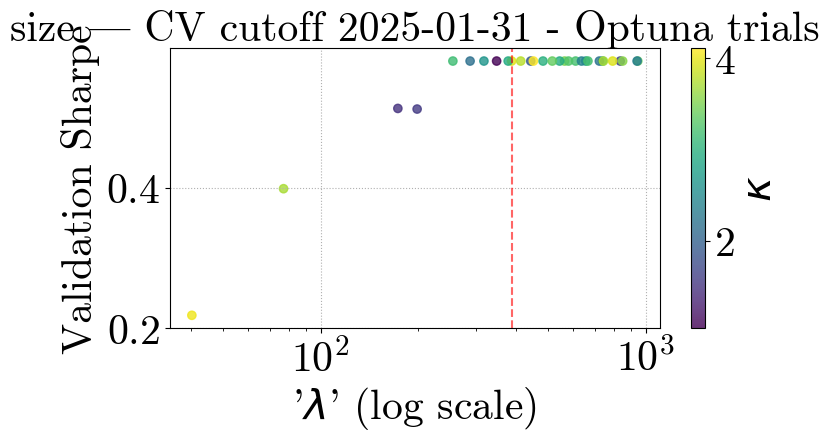

[I 2025-05-06 06:46:42,283] A new study created in memory with name: no-name-44149bf0-035b-4d67-afe5-080682fc808c
[I 2025-05-06 06:46:46,044] Trial 0 finished with value: 0.02491007858184181 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.02491007858184181.
[I 2025-05-06 06:46:49,311] Trial 1 finished with value: 0.2171958568191789 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.2171958568191789.
[I 2025-05-06 06:46:53,677] Trial 2 finished with value: 0.8423715588888137 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.8423715588888137.
[I 2025-05-06 06:47:03,493] Trial 3 finished with value: 0.6826202443430612 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.8423715588888137.
[I 2025-05-06 06:47:06,910] Trial 4 finished with value: 0.2713640165378343 and parame

Optuna best λ=198.1885, κ=1.5727916564869089, Sharpe=1.0239


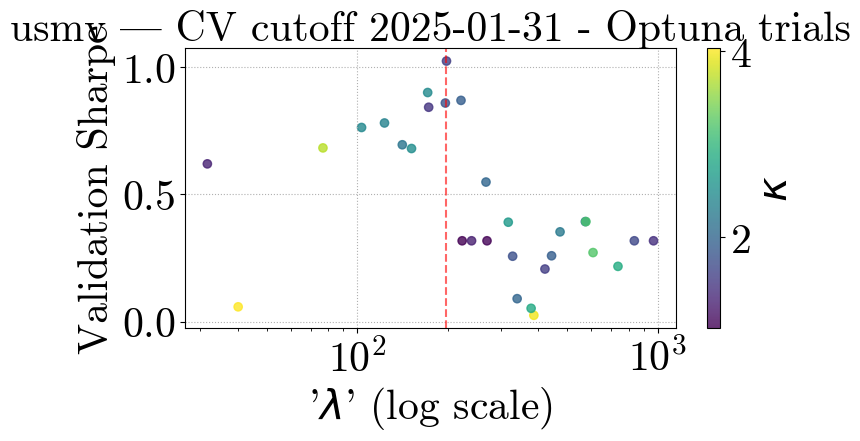

[I 2025-05-06 06:48:59,644] A new study created in memory with name: no-name-fd74d663-b8ea-427e-8d30-a79a4efeb336
[I 2025-05-06 06:49:03,129] Trial 0 finished with value: 0.8703232065642238 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-06 06:49:06,465] Trial 1 finished with value: 0.8703232065642238 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-06 06:49:14,596] Trial 2 finished with value: 0.6159359006633787 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-06 06:49:24,598] Trial 3 finished with value: -0.424468308416236 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-06 06:49:28,126] Trial 4 finished with value: 0.8703232065642238 and paramete

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.8703


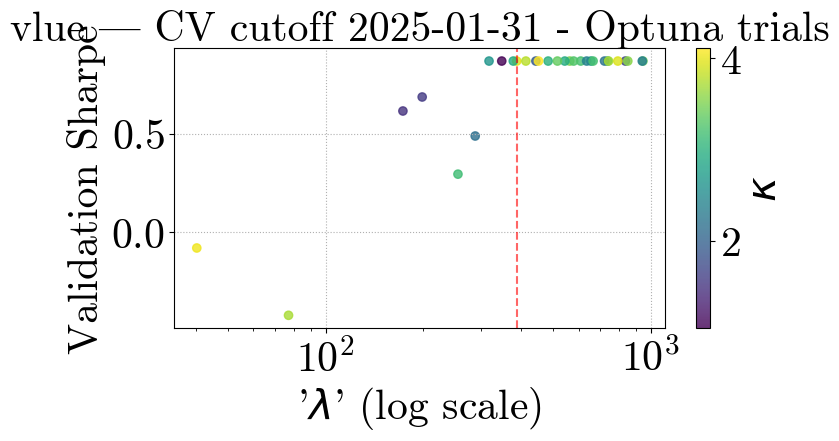

[I 2025-05-06 06:51:17,042] A new study created in memory with name: no-name-6f5dd2d2-42b1-44c0-bd12-4d9ba87bab99
[I 2025-05-06 06:51:20,143] Trial 0 finished with value: 0.4857408266560169 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4857408266560169.
[I 2025-05-06 06:51:23,108] Trial 1 finished with value: 0.4857408266560169 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4857408266560169.
[I 2025-05-06 06:51:28,331] Trial 2 finished with value: 0.4857408266560169 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4857408266560169.
[I 2025-05-06 06:51:49,827] Trial 3 finished with value: 0.5308148638447362 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5308148638447362.
[I 2025-05-06 06:51:52,878] Trial 4 finished with value: 0.4857408266560169 and paramete

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.6395


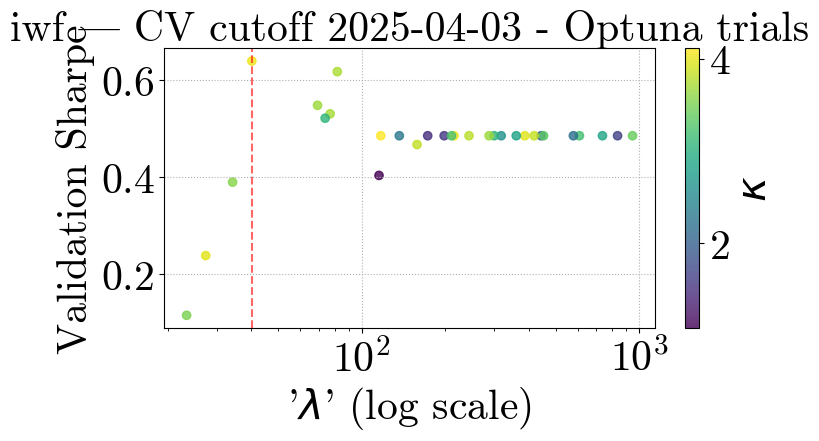

[I 2025-05-06 06:55:16,543] A new study created in memory with name: no-name-3f447681-b638-45e3-bc99-a9c4721a87fa
[I 2025-05-06 06:55:20,078] Trial 0 finished with value: -0.061979469682608444 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.061979469682608444.
[I 2025-05-06 06:55:23,274] Trial 1 finished with value: -0.282354364134066 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.061979469682608444.
[I 2025-05-06 06:55:33,324] Trial 2 finished with value: 0.005238491705223668 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.005238491705223668.
[I 2025-05-06 06:55:45,462] Trial 3 finished with value: -0.274917345063341 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.005238491705223668.
[I 2025-05-06 06:55:48,760] Trial 4 finished with value: -0.2076385266945

Optuna best λ=21.4921, κ=2.5254576207788495, Sharpe=0.5031


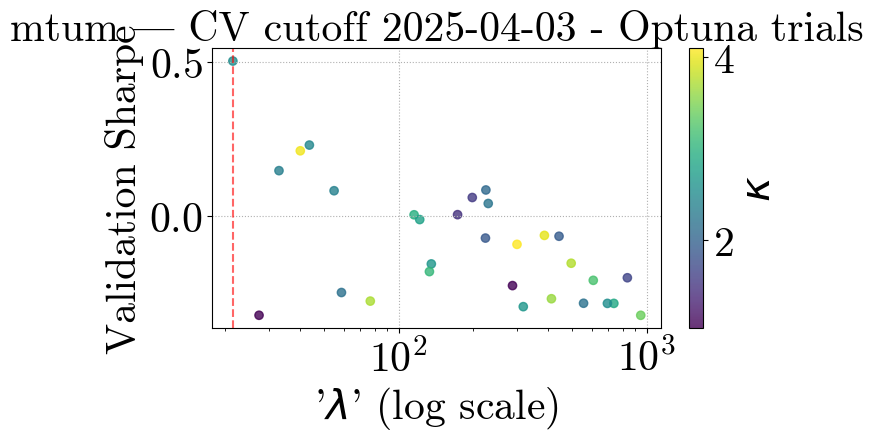

[I 2025-05-06 06:58:47,592] A new study created in memory with name: no-name-609df4fb-1126-47ea-9758-fe140d09e5f3
[I 2025-05-06 06:58:52,019] Trial 0 finished with value: 0.04121670391037377 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.04121670391037377.
[I 2025-05-06 06:58:52,938] Trial 1 finished with value: 0.7180281425627766 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.7180281425627766.
[I 2025-05-06 06:58:59,893] Trial 2 finished with value: -0.2773362776706969 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.7180281425627766.
[I 2025-05-06 06:59:09,541] Trial 3 finished with value: 0.31625264137212566 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.7180281425627766.
[I 2025-05-06 06:59:12,492] Trial 4 finished with value: 0.8653226237333185 and para

Optuna best λ=621.9372, κ=3.2898558741033144, Sharpe=0.9116


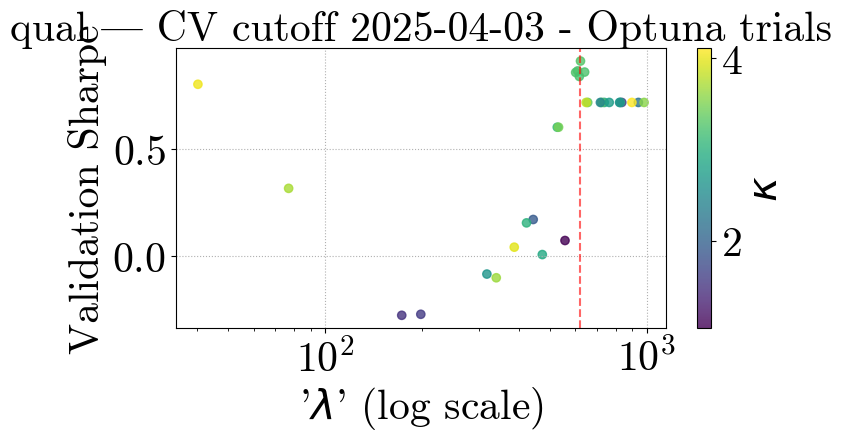

[I 2025-05-06 07:00:22,604] A new study created in memory with name: no-name-68a2da6e-f537-44b5-af1c-6187e004f19f
[I 2025-05-06 07:00:26,888] Trial 0 finished with value: 0.19736375360833708 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-06 07:00:27,707] Trial 1 finished with value: 0.19736375360833708 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-06 07:00:35,436] Trial 2 finished with value: 0.1408581021504095 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-06 07:00:46,404] Trial 3 finished with value: 0.13493536403458925 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-06 07:00:47,321] Trial 4 finished with value: 0.19736375360833708 and 

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.1974


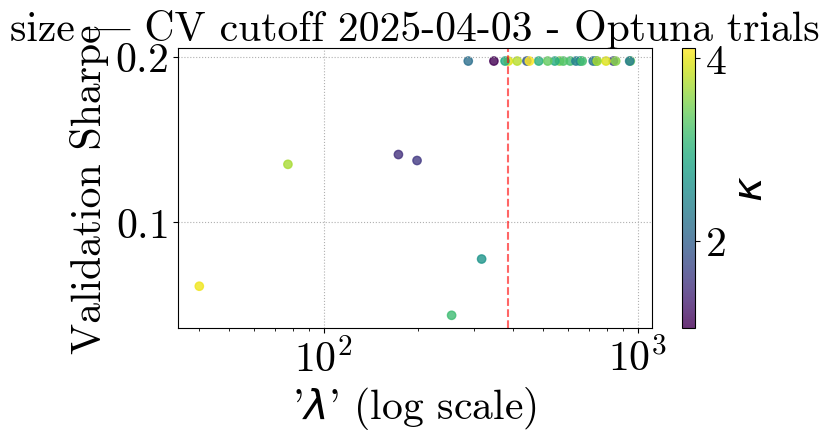

[I 2025-05-06 07:02:11,274] A new study created in memory with name: no-name-b89ac335-180b-45d1-b526-042224254ca3
[I 2025-05-06 07:02:15,908] Trial 0 finished with value: -0.038076520584220286 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.038076520584220286.
[I 2025-05-06 07:02:16,789] Trial 1 finished with value: -0.038076520584220286 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.038076520584220286.
[I 2025-05-06 07:02:22,236] Trial 2 finished with value: 0.029281368679162298 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.029281368679162298.
[I 2025-05-06 07:02:28,456] Trial 3 finished with value: 0.23216280153682295 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.23216280153682295.
[I 2025-05-06 07:02:31,336] Trial 4 finished with value: -0.0380765205

Optuna best λ=154.5763, κ=3.644437513815549, Sharpe=0.6584


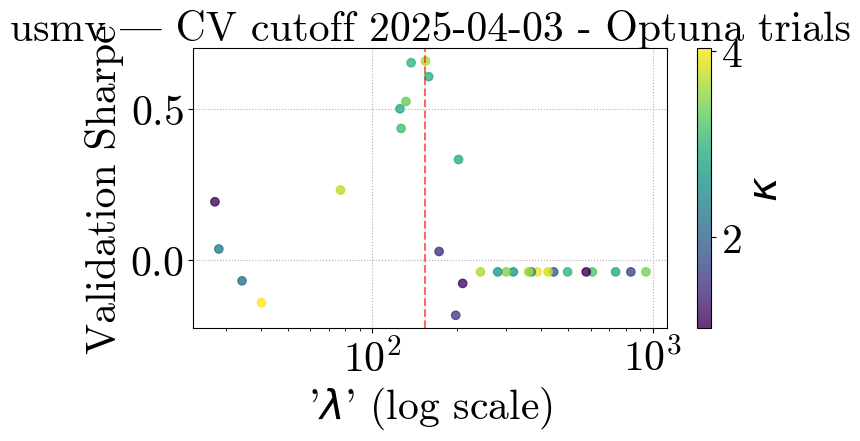

[I 2025-05-06 07:05:05,391] A new study created in memory with name: no-name-2a10df98-223d-436f-b96b-594ad304b67b
[I 2025-05-06 07:05:09,085] Trial 0 finished with value: 0.4798767703593348 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4798767703593348.
[I 2025-05-06 07:05:12,133] Trial 1 finished with value: 0.4798767703593348 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4798767703593348.
[I 2025-05-06 07:05:19,540] Trial 2 finished with value: 0.048847784141134165 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4798767703593348.
[I 2025-05-06 07:05:28,802] Trial 3 finished with value: -0.6877905767421163 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.4798767703593348.
[I 2025-05-06 07:05:31,988] Trial 4 finished with value: 0.4798767703593348 and param

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.4799


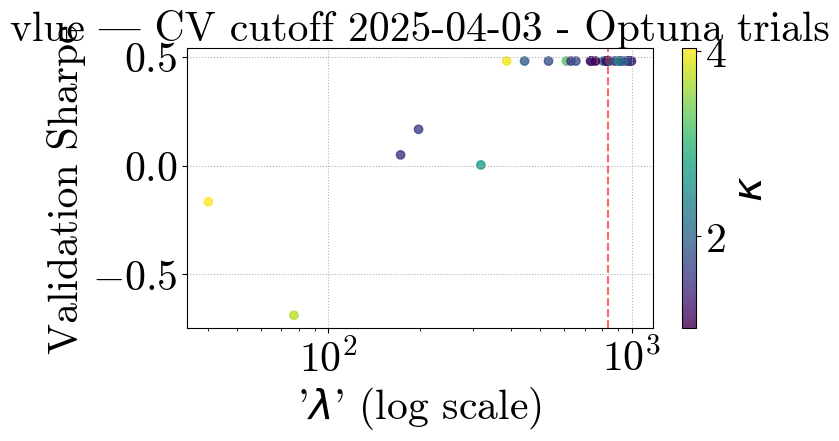

C:\Users\victo\AppData\Local\Temp\ipykernel_12836\2857859080.py:123: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


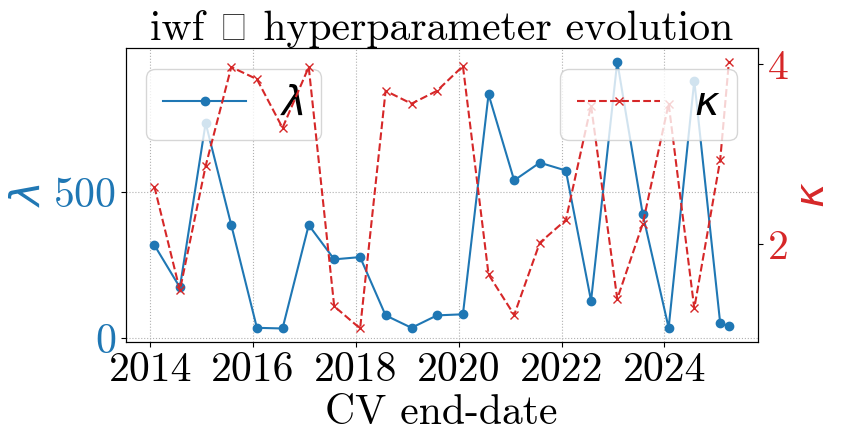

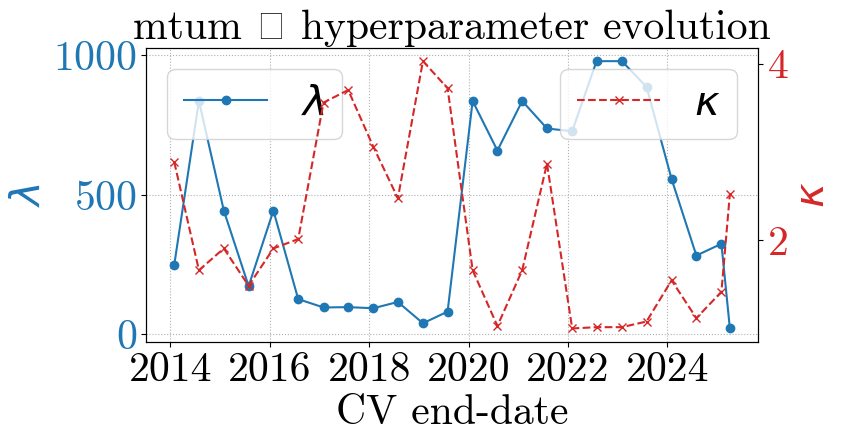

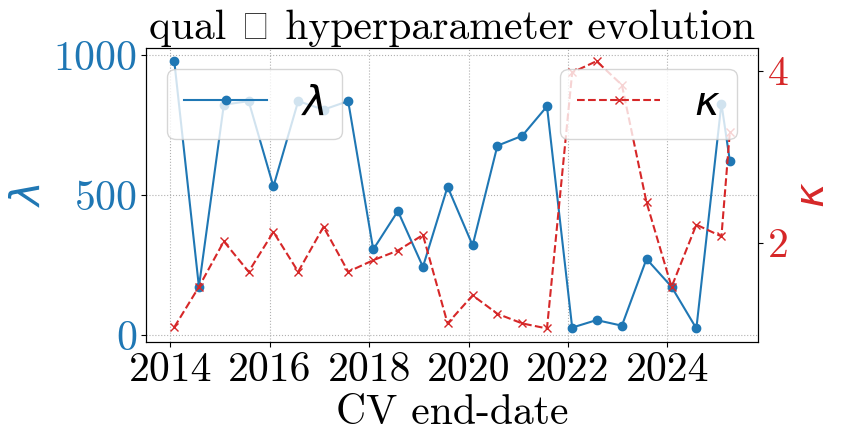

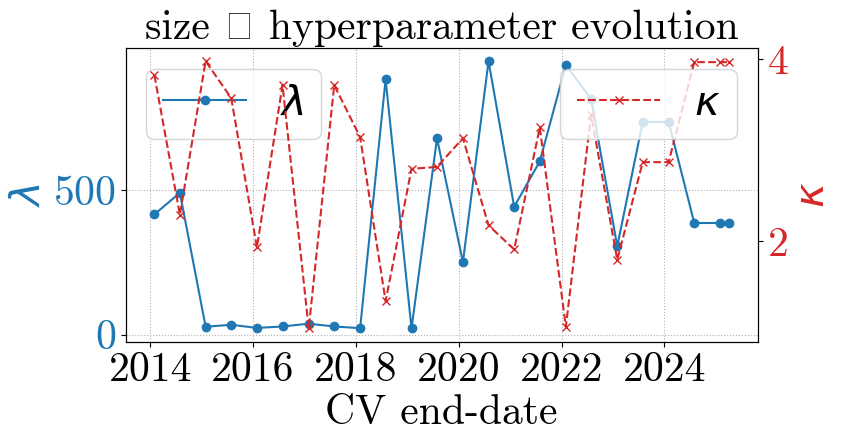

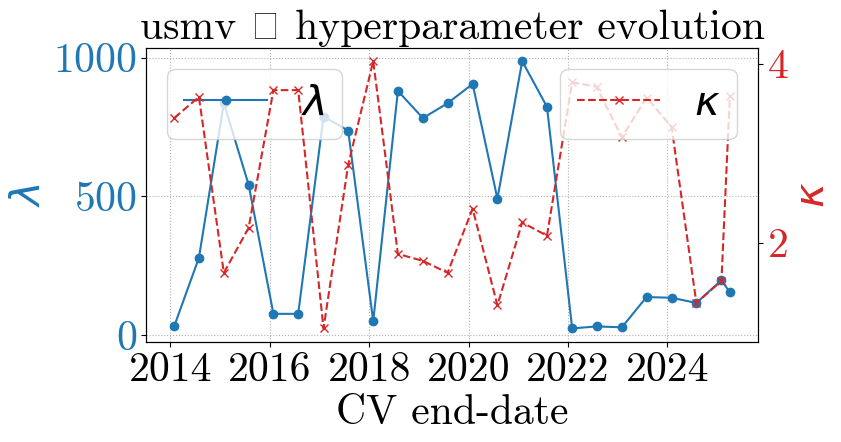

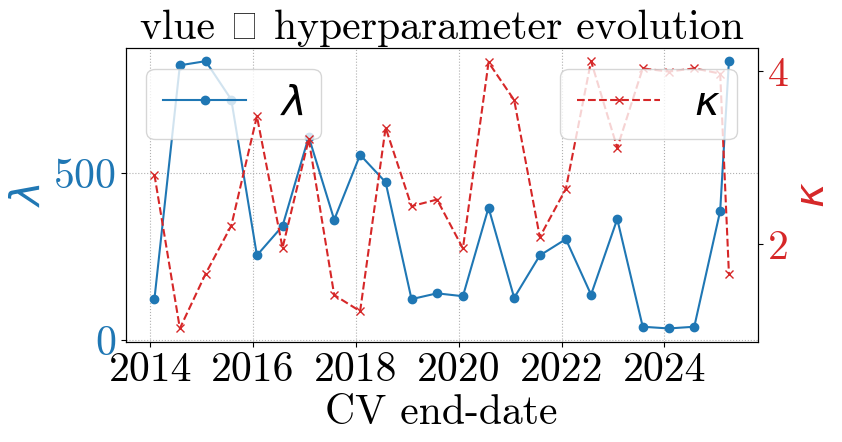

Saved tuned parameters to cv_params.parquet
         date factor  best_lambda  best_kappa
0  2014-01-31    iwf   318.157398    2.638870
6  2014-07-31    iwf   172.898268    1.487187
12 2015-01-30    iwf   737.354063    2.869674
18 2015-07-31    iwf   387.049316    3.969181
24 2016-01-29    iwf    34.226760    3.834733


In [5]:
# -------------------------  QUICK STAND‑ALONE RUN  ----------------------- #
# ---- user‑specific setup (exactly as in your original script) -------- #

# Paths & tickers -----------------------------------------------------------------------
TEST_START       = "2014-01-01"
RECROSS_VAL_FREQ = "6ME"          # six‑month‑end


script_dir = os.getcwd()
base_dir   = os.path.abspath(os.path.join(script_dir, "..", ".."))
data_dir   = os.path.join(base_dir, "data_new")

factor_file = os.path.join(data_dir, "1estimation_index_returns.csv")
market_file = os.path.join(data_dir, "1macro_data.csv")
etf_file    = os.path.join(data_dir, "2trading_etf_returns_aligned.csv")

factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]   

# lambda_values = np.linspace(30, 400, 5)
# # kappa grid can depend on feature count; a simple fixed grid is fine
# kappa_values  = np.array([2.0, 3.0, 4.0]) # kappa = trial.suggest_int("kappa", 1, np.sqrt(17))

# ------- load full data into factor_data_dict here -------------------- #
# (use your existing MergedDataLoader logic)
factor_data_dict = {}
for fac in factors:
    data = MergedDataLoader(
                factor_file=factor_file,
                market_file=market_file,
                ver="v2",
                factor_col=fac).load()

    common_idx = (data.X.index
                    .intersection(data.ret_ser.index)
                    .intersection(data.market_ser.index))

    factor_data_dict[fac] = {
        "X":       data.X.loc[common_idx],
        "fac_ret": data.ret_ser.loc[common_idx],
        "mkt_ret": data.market_ser.loc[common_idx],
    }


master_index = factor_data_dict[factors[0]]["X"].index.sort_values()
test_index   = master_index[master_index >= TEST_START]

recross_val_boundaries = (
    test_index.to_series()
    .resample(RECROSS_VAL_FREQ)
    .last()
    .dropna()                     # Series of Timestamp objects
)
# ----------------------------------------------------------------------

cv_table = run_cv(
    factors,
    factor_data_dict,
    cv_dates=recross_val_boundaries,
    initial_train_start="2002-05-31"
)

print("Saved tuned parameters to cv_params.parquet")
print(cv_table.head())

In [ ]:
# # 1) Cast kappa to float
# cv_table["best_kappa"] = cv_table["best_kappa"].astype(float)

# # 2) (Optional) verify
# print(cv_table.dtypes)

# # 3) Save out
# cv_table.to_parquet("cv_params_bayes_v2.parquet", index=False) # v2 is the one searching from 0.1 to 1000


date           datetime64[ns]
factor                 object
best_lambda           float64
best_kappa            float64
dtype: object


In [5]:
with open("cell_output.txt", "w") as f:
    for r in records:  # or whatever your output list is
        f.write(str(r) + "\n")


NameError: name 'records' is not defined